In [1]:
from F1_library import libraryF1dataNotebook as libraryDataF1
import pandas as pd
import numpy as np
import fastf1 as ff1

from fastf1 import utils
from matplotlib import pyplot as plt

# FORMULA 1 QATAR AIRWAYS QATAR GRAND PRIX 2025
The Qatar Grand Prix (Arabic: جائزة قطر الكبرى) is a Formula One motor racing event which is held in Qatar. It was held for the first time on 21 November as part of the 2021 championship at the Lusail International Circuit, and after not taking place during the 2022 season due to the 2022 FIFA World Cup taking place in Qatar, it rejoined the calendar in 2023 under a 10-year contract. The race was established as the fourth full-night race (as opposed to day or day-to-night races) on the Formula One calendar, following the Singapore, Bahrain and Sakhir Grands Prix.
Source: Wikipedia
Analyzed by Franccy del Piero Sambrano Ganoza

## Obtain session information

In [2]:
libraryDataF1.obtain_information('sessions',year=2025,country_acronym='QAT')

,meeting_key,session_key,location,date_start,date_end,session_type,session_name,country_key,country_code,country_name,circuit_key,circuit_short_name,gmt_offset,year
0,1275,9840,Lusail,2025-11-28T13:30:00+00:00,2025-11-28T14:30:00+00:00,Practice,Practice 1,149,QAT,Qatar,150,Lusail,03:00:00,2025
1,1275,9841,Lusail,2025-11-28T17:30:00+00:00,2025-11-28T18:14:00+00:00,Qualifying,Sprint Qualifying,149,QAT,Qatar,150,Lusail,03:00:00,2025
2,1275,9845,Lusail,2025-11-29T14:00:00+00:00,2025-11-29T15:00:00+00:00,Race,Sprint,149,QAT,Qatar,150,Lusail,03:00:00,2025


core           INFO 	Loading data for Qatar Grand Prix - Practice 1 [v3.3.0]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
logger      WARNING 	Failed to load result data from Ergast!
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	No cached data found for position_data. Loading data...
_api           INFO 	Fetching position data...
_api           INFO 	Parsing position data...
_api        WARNING 	Driver  2: Position data is incomplete!
_api        WARNING 	Driver  3: Position data is incomplete!

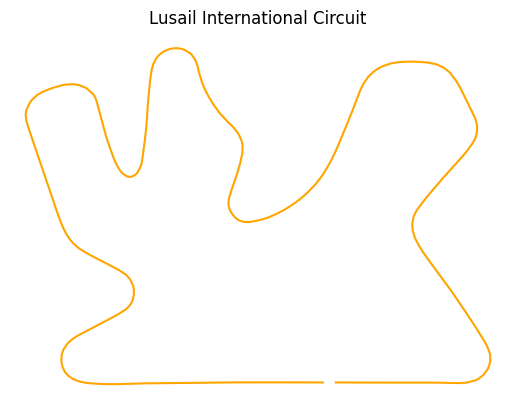

In [102]:
session = ff1.get_session(2025,23, 'FP1')
session.load()

lap = session.laps.pick_fastest()
pos = lap.get_pos_data()

circuit_info = session.get_circuit_info()
libraryDataF1.draw_track(circuit_info,pos,"Lusail International Circuit")

## Free Practice 1
### Obtain setup

In [7]:
practice = libraryDataF1.obtain_information('laps',session_key=9840)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9840)
drivers = libraryDataF1.obtain_information('drivers',session_key=9840)

In [8]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

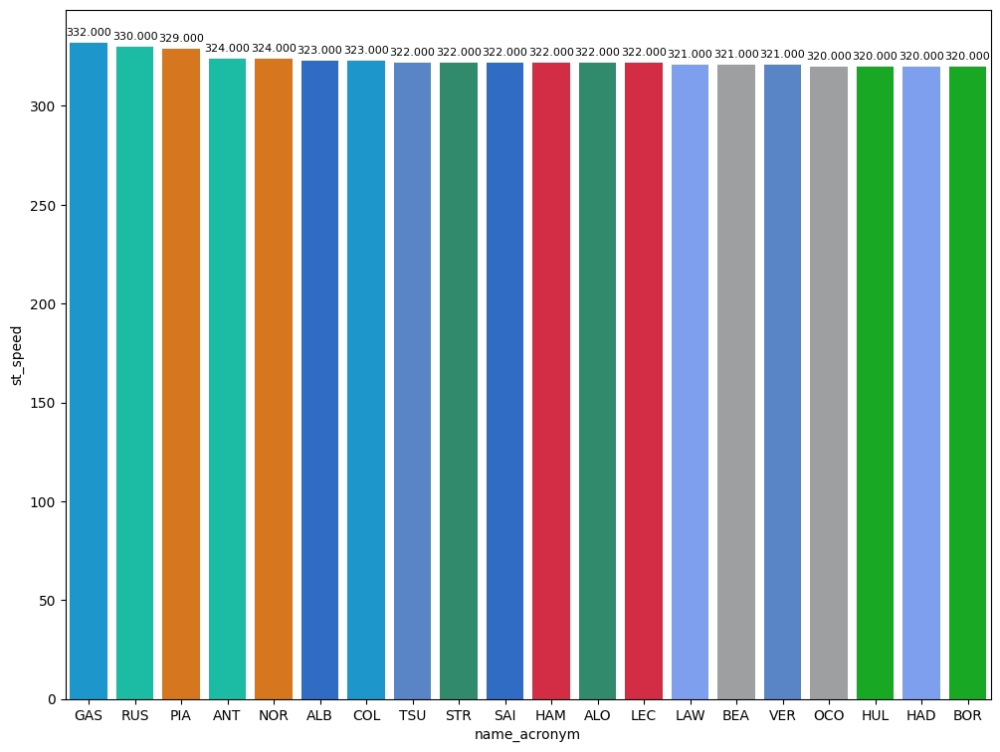

In [9]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

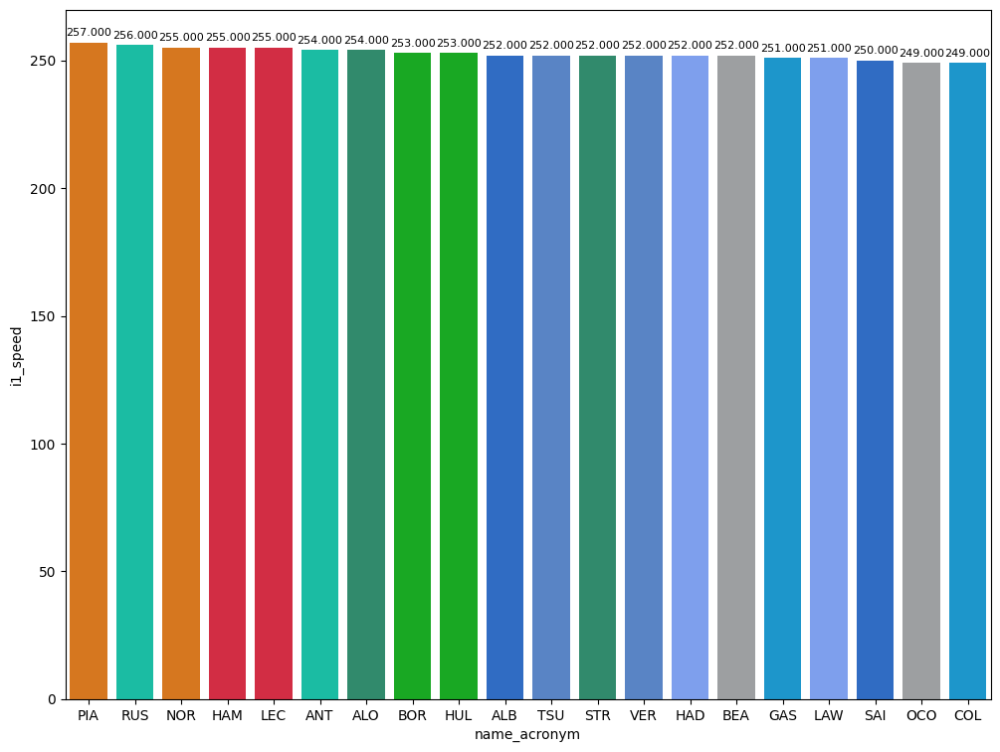

In [10]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

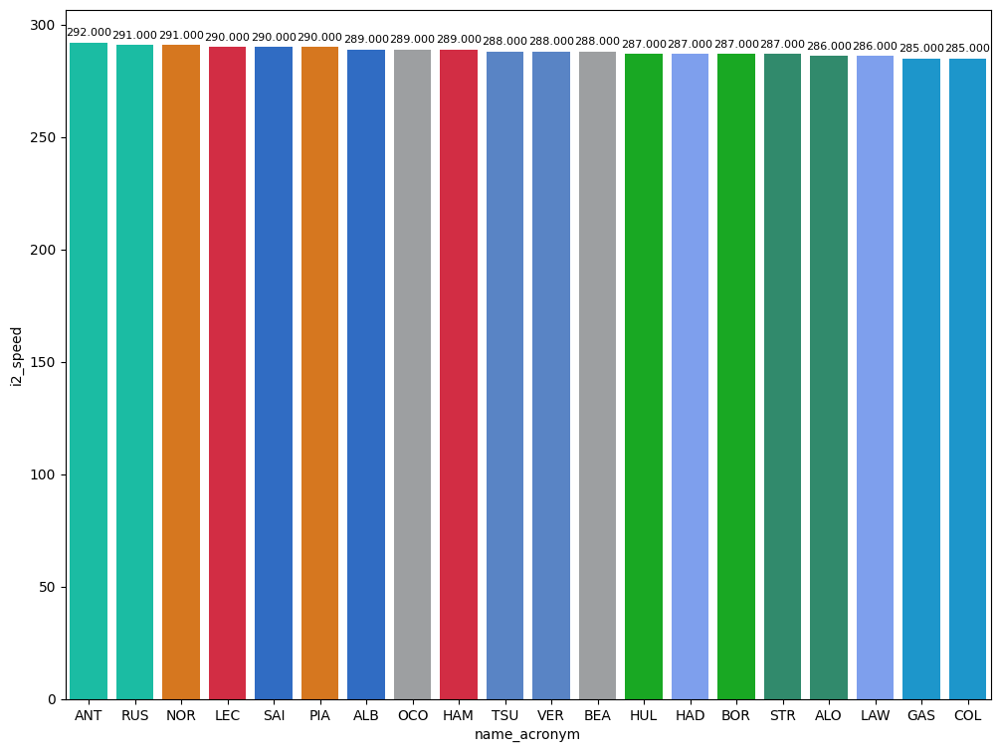

In [11]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [12]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
174,George RUSSELL,HARD,29.963,28.218,23.984,82.165
468,Oscar PIASTRI,SOFT,29.577,27.697,23.650,80.924


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session.
Track evolution is quite high and it seems that two attemps are possible but it is important to take care of the gravel trap. McLaren and WIlliams seem that they are competitive. Mercedes, Ferrari and Alpine could suffer here.

In [13]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


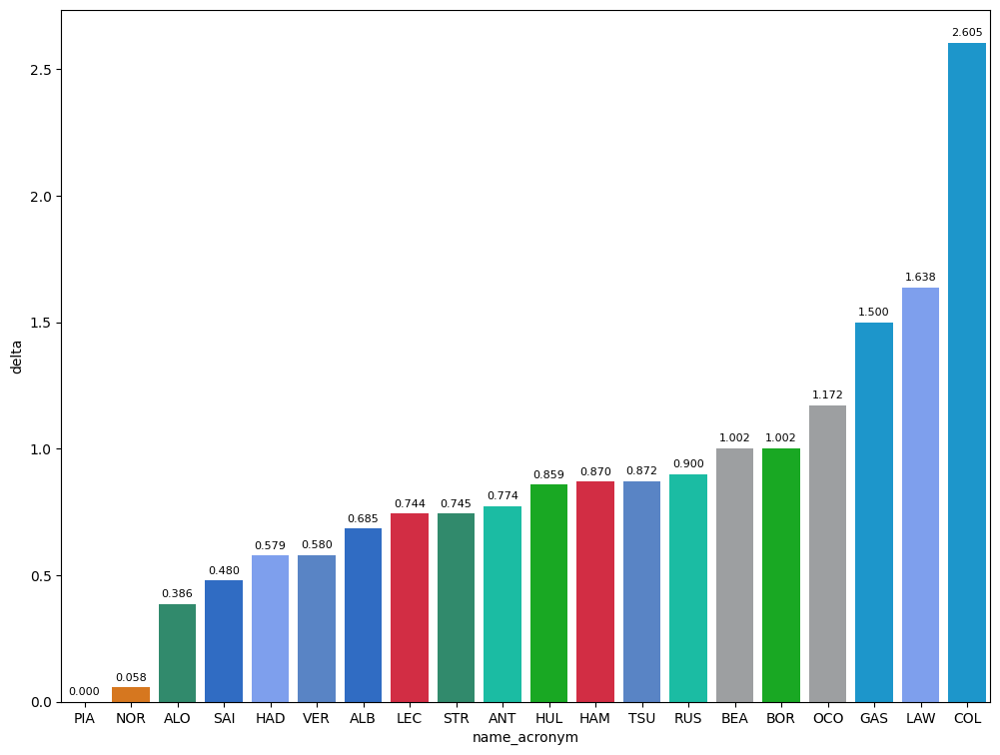

In [14]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.
S1:McLaren is quick here and Sauber has to take advantage of this sector. Even though Max made one attemp, his sector is not fast.
S2: Williams stand out in this sector, followed by McLaren and Sauber. Red Bull, Mercedes and Ferrari's pace is very poor
S3:McLaren dominated here and Aston is very competitive. Sauber lost all the advantage and Williams is in the midfield, maybe due to they push in the second sector. Red Bull's performance is good and this indicates that they doesn't suffer for tyre degradation.

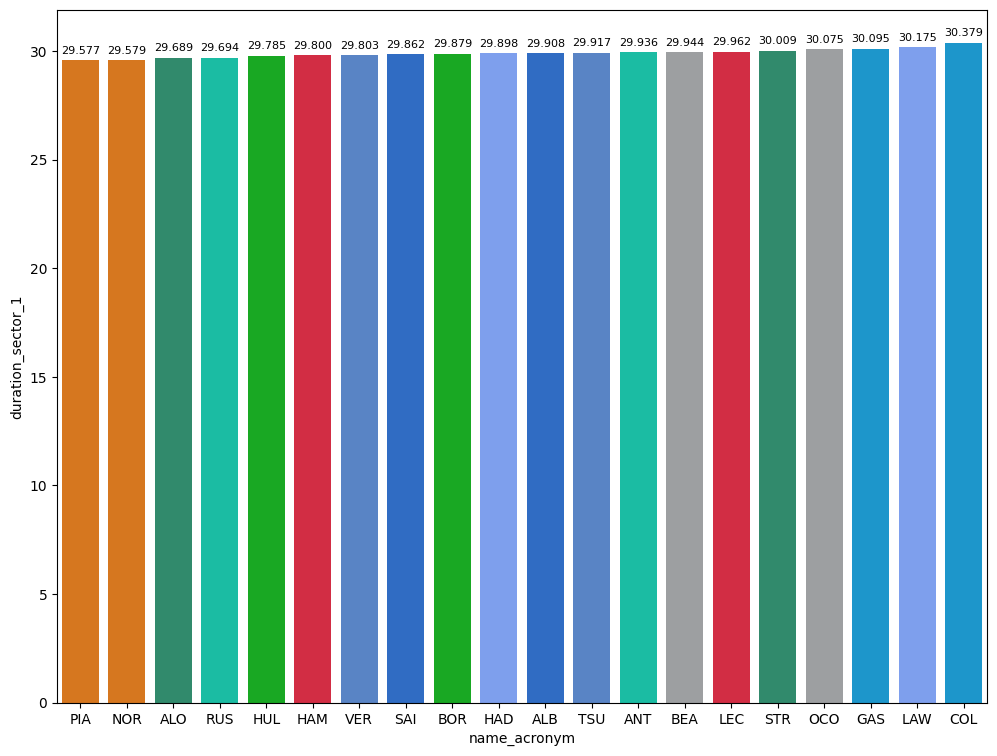

In [15]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin().dropna()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

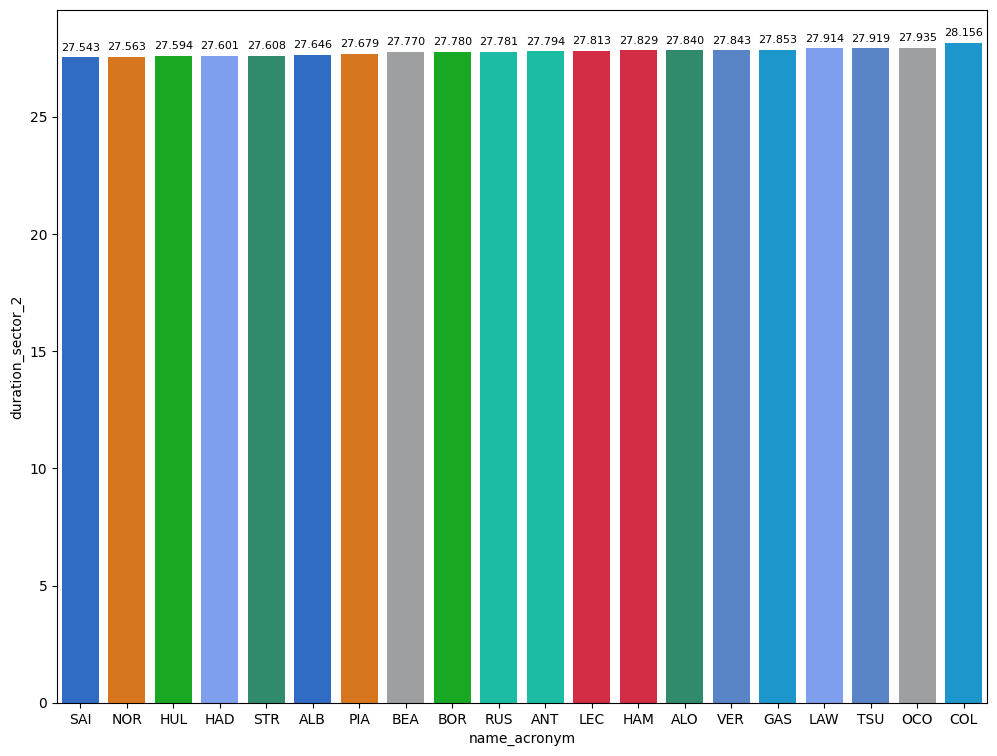

In [16]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin().dropna()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

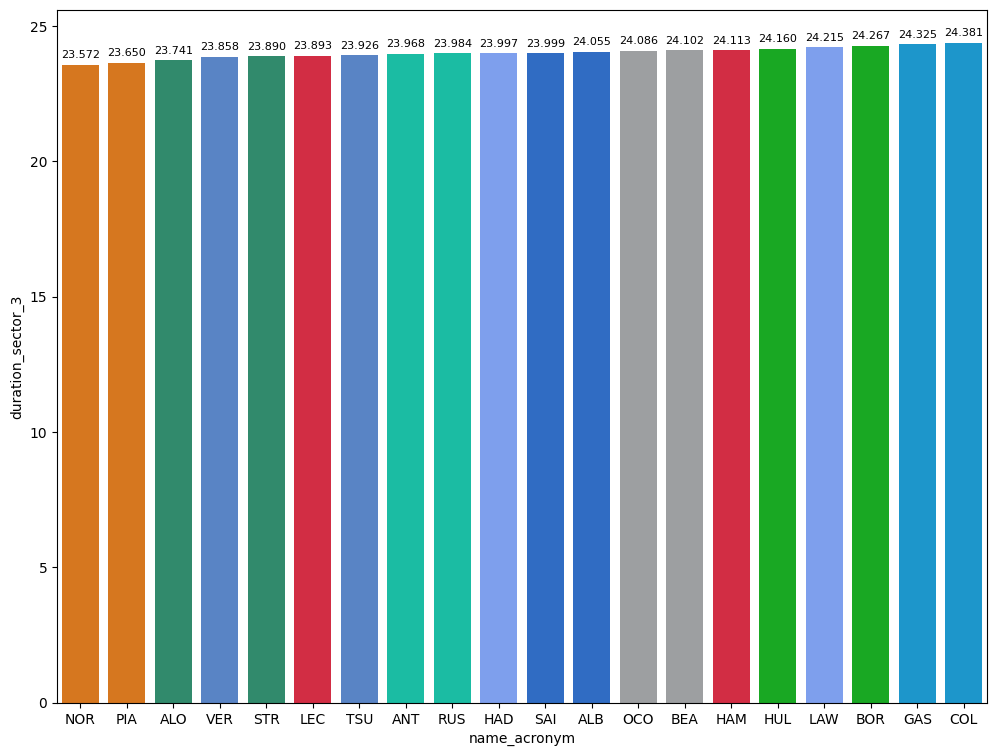

In [17]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin().dropna()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [18]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False and lap_duration > 85 and lap_duration <=88").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,85.807000
HARD,85.843427


### Long runs

In [19]:
MINIMUN_SECONDS = 85
MAXIMUM_SECONDS = 88

#### Red Bull Racing

In [20]:
stintInformation.query('driver_number == 1 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
16,1275,9840,1,1,1,10,HARD,0
21,1275,9840,1,22,1,12,HARD,0
43,1275,9840,2,1,11,21,HARD,10
53,1275,9840,2,22,13,21,HARD,12
60,1275,9840,3,1,22,24,SOFT,0
67,1275,9840,4,1,25,27,SOFT,0
76,1275,9840,3,22,22,28,SOFT,0


In [21]:
data = libraryDataF1.getinfolongruns(jointables2,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
23,Max VERSTAPPEN,HARD,2025-11-28T13:32:15.939000+00:00,2,31.355,28.800,24.892,85.047
242,Max VERSTAPPEN,HARD,2025-11-28T13:58:07.652000+00:00,12,31.817,29.391,25.302,86.510
253,Max VERSTAPPEN,HARD,2025-11-28T13:59:34.244000+00:00,13,31.797,29.355,25.144,86.296
268,Max VERSTAPPEN,HARD,2025-11-28T14:01:00.594000+00:00,14,31.658,29.378,25.195,86.231
283,Max VERSTAPPEN,HARD,2025-11-28T14:02:26.730000+00:00,15,31.446,29.253,25.108,85.807
300,Max VERSTAPPEN,HARD,2025-11-28T14:03:52.527000+00:00,16,31.222,29.175,24.636,85.033
318,Max VERSTAPPEN,HARD,2025-11-28T14:05:17.512000+00:00,17,31.169,29.118,24.720,85.007
334,Max VERSTAPPEN,HARD,2025-11-28T14:06:42.606000+00:00,18,31.283,29.310,24.754,85.347
362,Max VERSTAPPEN,HARD,2025-11-28T14:09:32.790000+00:00,20,31.376,29.399,24.516,85.291


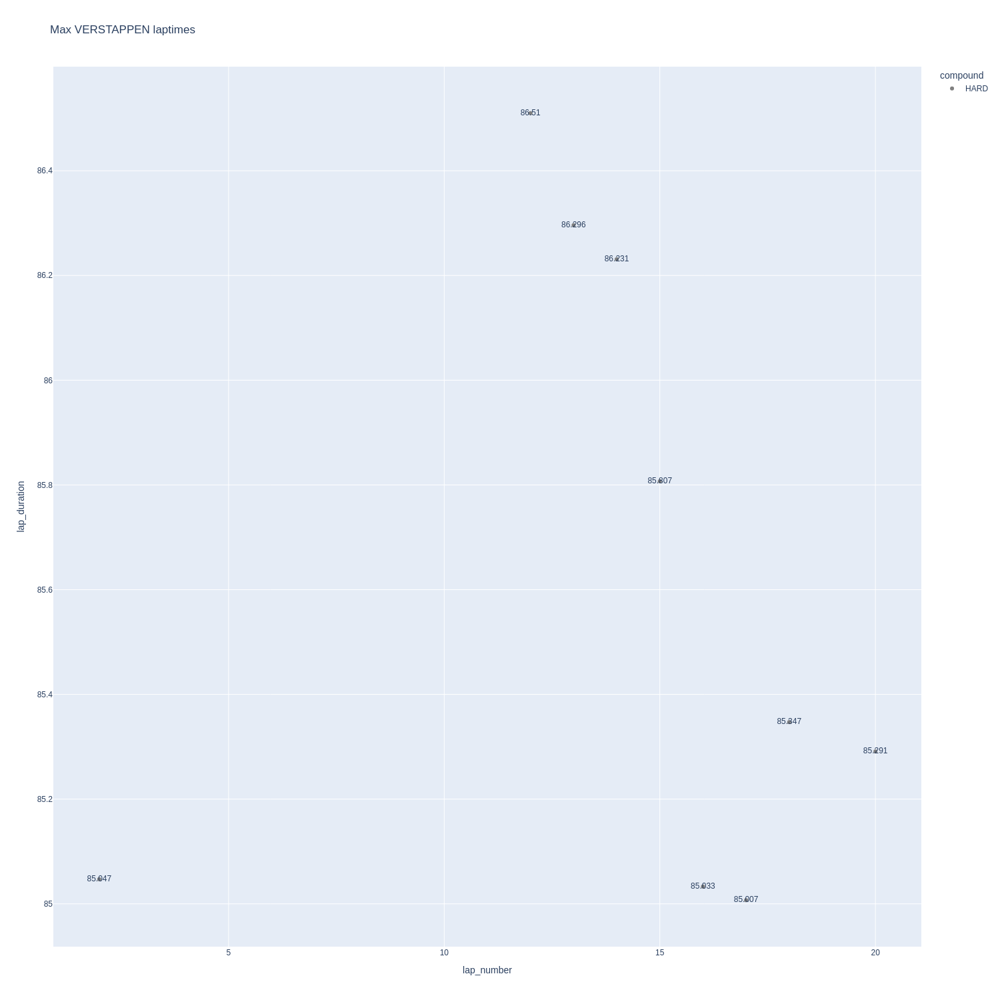

In [22]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

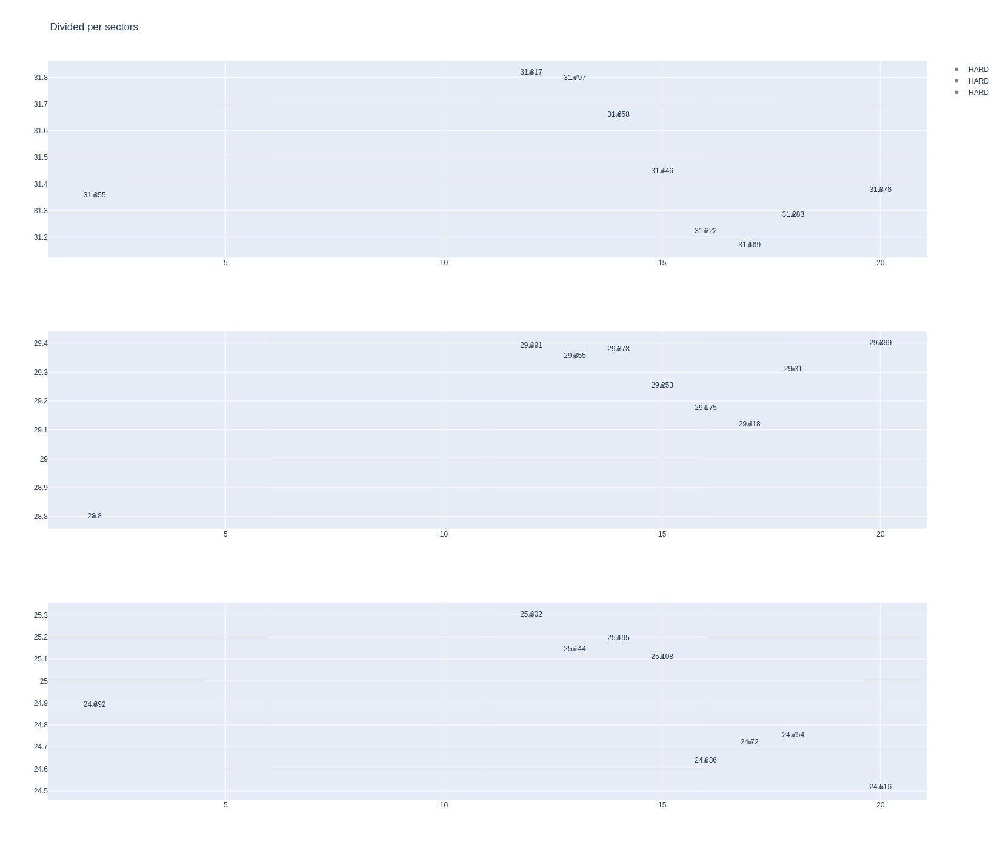

In [23]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [24]:
data = libraryDataF1.getinfolongruns(jointables2,22,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
26,Yuki TSUNODA,HARD,2025-11-28T13:32:40.379000+00:00,2,31.684,29.022,25.161,85.867
137,Yuki TSUNODA,HARD,2025-11-28T13:42:29.544000+00:00,7,30.656,29.374,24.993,85.023
272,Yuki TSUNODA,HARD,2025-11-28T14:01:24.391000+00:00,14,32.356,29.833,25.793,87.982
285,Yuki TSUNODA,HARD,2025-11-28T14:02:52.355000+00:00,15,31.856,29.517,25.527,86.900
303,Yuki TSUNODA,HARD,2025-11-28T14:04:19.152000+00:00,16,31.929,29.292,25.121,86.342
320,Yuki TSUNODA,HARD,2025-11-28T14:05:45.637000+00:00,17,31.752,29.321,25.177,86.250
336,Yuki TSUNODA,HARD,2025-11-28T14:07:11.781000+00:00,18,31.733,29.294,24.960,85.987
352,Yuki TSUNODA,HARD,2025-11-28T14:08:37.816000+00:00,19,31.535,29.212,24.859,85.606
365,Yuki TSUNODA,HARD,2025-11-28T14:10:03.399000+00:00,20,31.615,29.082,24.853,85.550


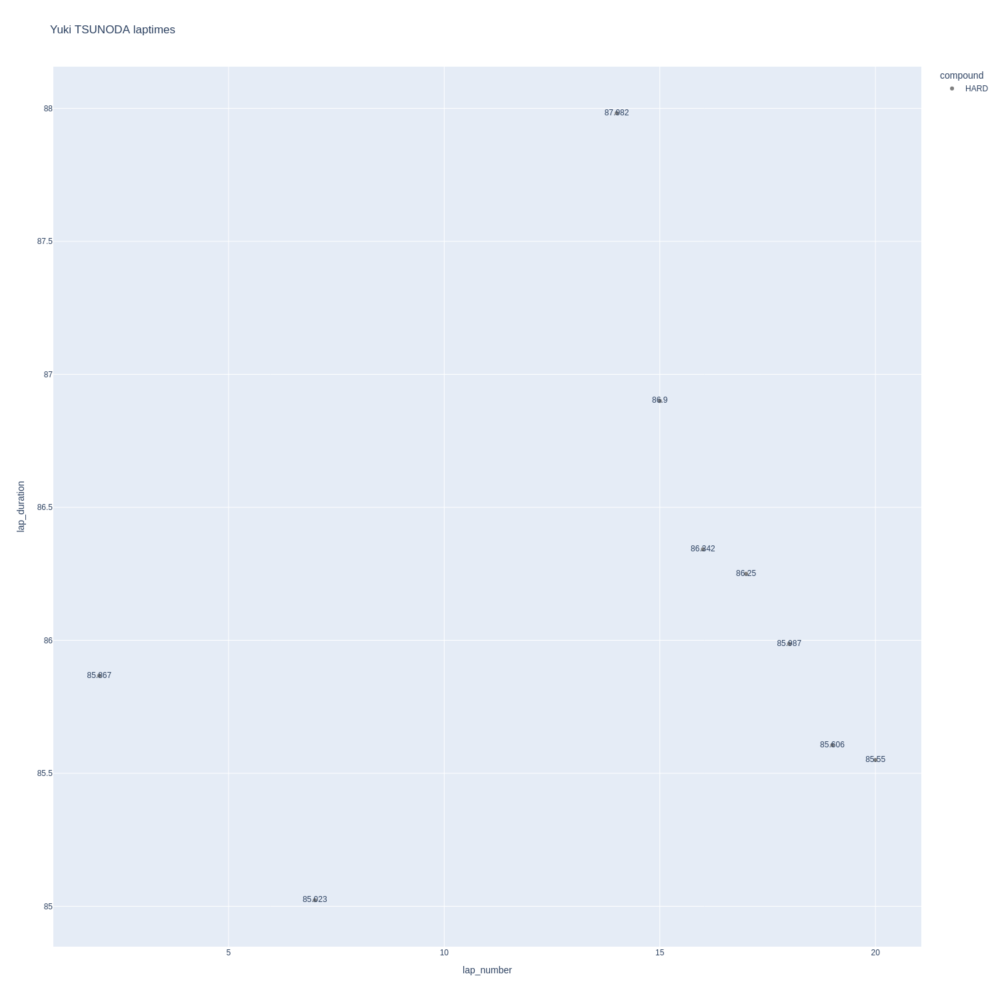

In [25]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

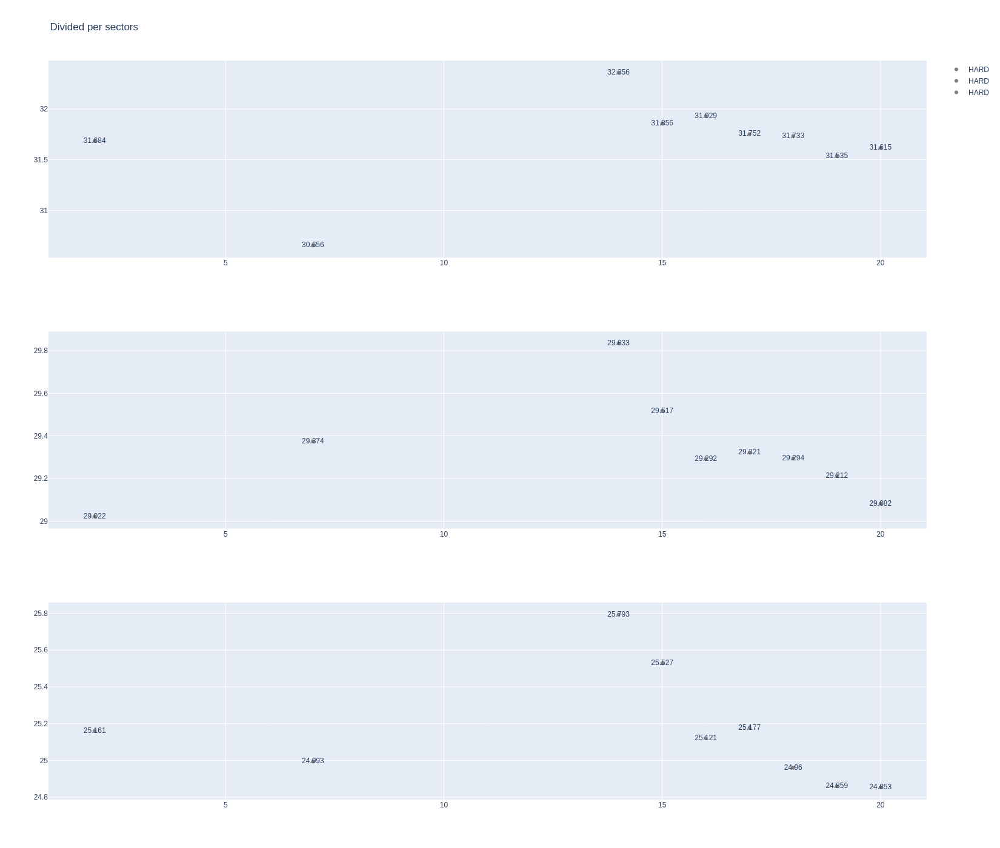

In [26]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [27]:
stintInformation.query('driver_number == 44 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1275,9840,1,44,1,3,HARD,0
7,1275,9840,1,16,1,10,HARD,0
22,1275,9840,2,44,4,11,HARD,3
25,1275,9840,2,16,11,15,HARD,10
28,1275,9840,3,44,12,15,HARD,11
46,1275,9840,3,16,16,23,HARD,15
52,1275,9840,4,44,16,21,HARD,15
77,1275,9840,4,16,24,31,SOFT,0
78,1275,9840,5,44,22,28,SOFT,0


In [28]:
data = libraryDataF1.getinfolongruns(jointables2,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
210,Charles LECLERC,HARD,2025-11-28T13:53:36.015000+00:00,13,30.347,29.48,26.226,86.053
333,Charles LECLERC,HARD,2025-11-28T14:06:40.575000+00:00,18,30.274,28.40,26.461,85.135


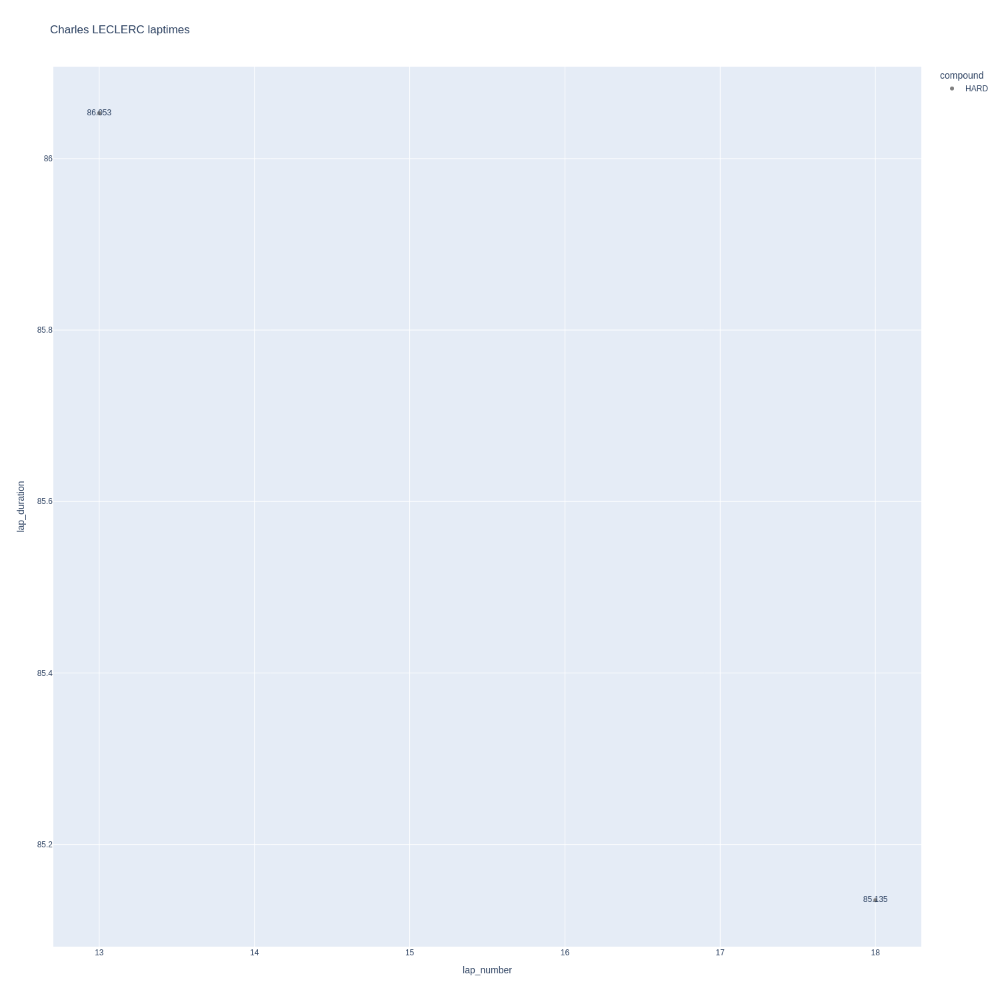

In [29]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

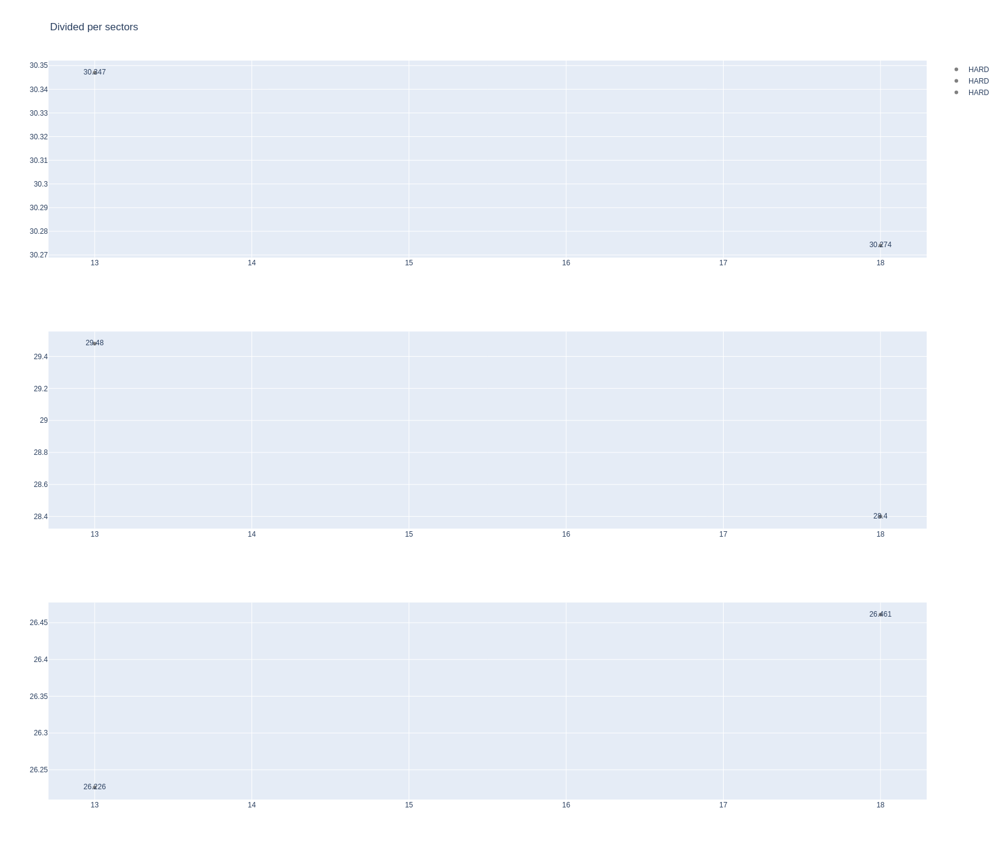

In [30]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [31]:
data = libraryDataF1.getinfolongruns(jointables2,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
30,Lewis HAMILTON,HARD,2025-11-28T13:33:06.232000+00:00,2,31.968,29.164,25.284,86.416


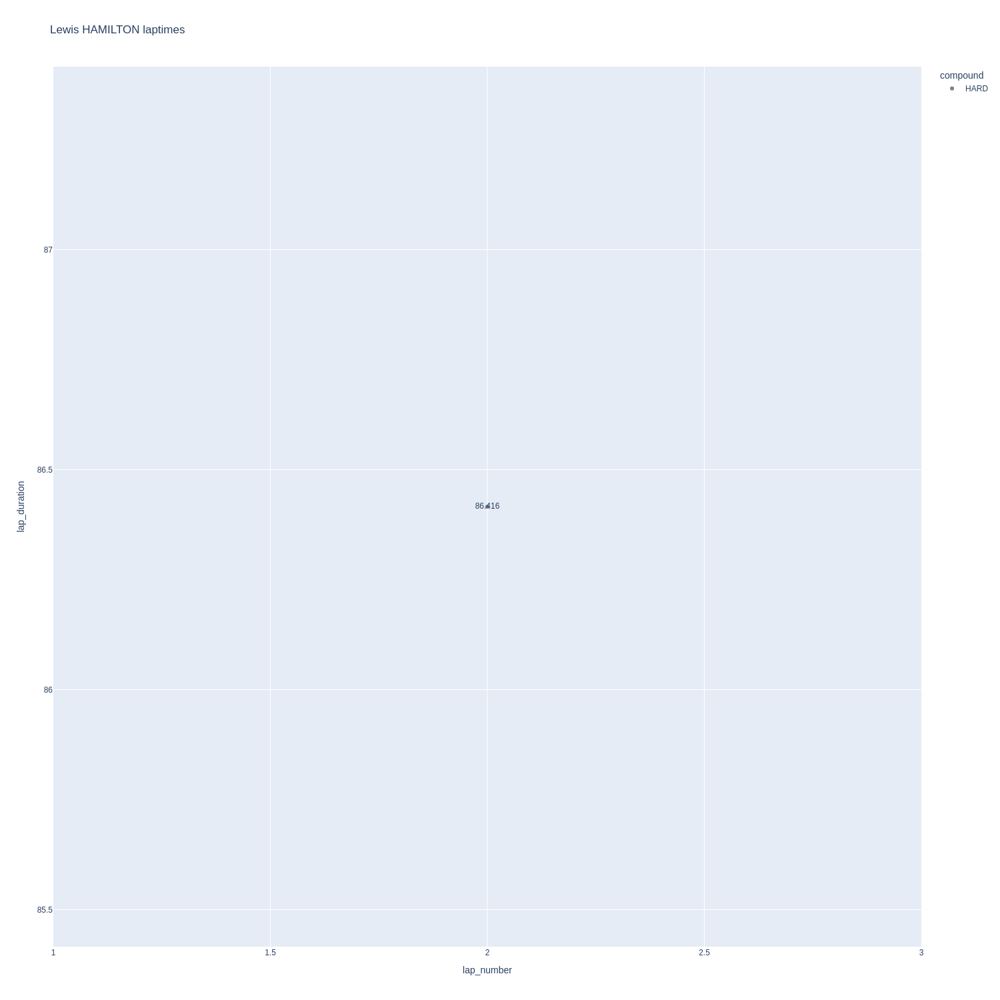

In [32]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

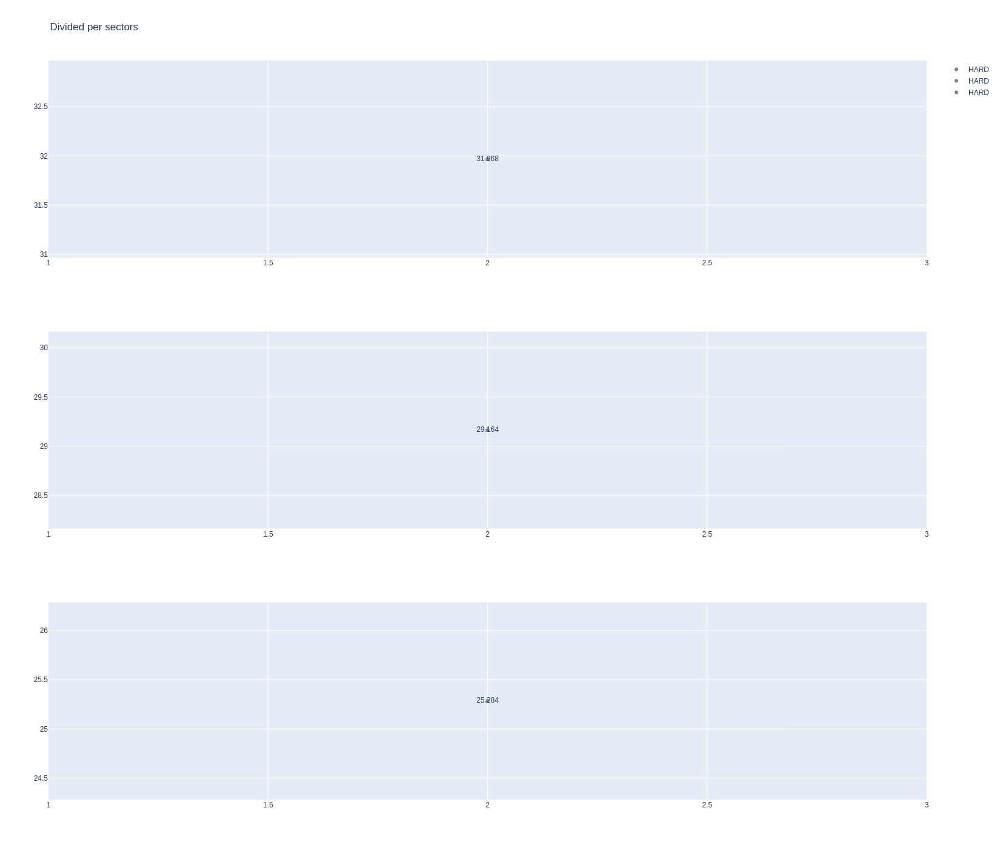

In [33]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [34]:
stintInformation.query('driver_number == 63 or driver_number == 12')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
13,1275,9840,1,12,1,10,HARD,0
14,1275,9840,1,63,1,11,HARD,0
44,1275,9840,2,63,12,25,HARD,11
45,1275,9840,2,12,11,24,HARD,10
56,1275,9840,3,12,25,27,SOFT,0
82,1275,9840,3,63,26,33,SOFT,0
84,1275,9840,4,12,28,32,SOFT,0


In [35]:
data = libraryDataF1.getinfolongruns(jointables2,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
45,Kimi ANTONELLI,HARD,2025-11-28T13:34:03.503000+00:00,3,31.322,28.990,25.040,85.352
225,Kimi ANTONELLI,HARD,2025-11-28T13:56:06.772000+00:00,12,31.826,29.313,25.312,86.451
235,Kimi ANTONELLI,HARD,2025-11-28T13:57:33.153000+00:00,13,31.574,29.214,25.259,86.047
246,Kimi ANTONELLI,HARD,2025-11-28T13:58:59.220000+00:00,14,31.562,29.217,25.019,85.798
260,Kimi ANTONELLI,HARD,2025-11-28T14:00:24.974000+00:00,15,31.429,29.305,25.039,85.773
276,Kimi ANTONELLI,HARD,2025-11-28T14:01:50.808000+00:00,16,31.713,29.299,25.284,86.296
292,Kimi ANTONELLI,HARD,2025-11-28T14:03:17.120000+00:00,17,31.220,29.209,24.890,85.319
309,Kimi ANTONELLI,HARD,2025-11-28T14:04:42.433000+00:00,18,31.283,29.237,24.885,85.405
325,Kimi ANTONELLI,HARD,2025-11-28T14:06:07.825000+00:00,19,31.300,29.356,24.942,85.598
341,Kimi ANTONELLI,HARD,2025-11-28T14:07:33.440000+00:00,20,31.411,29.304,24.786,85.501


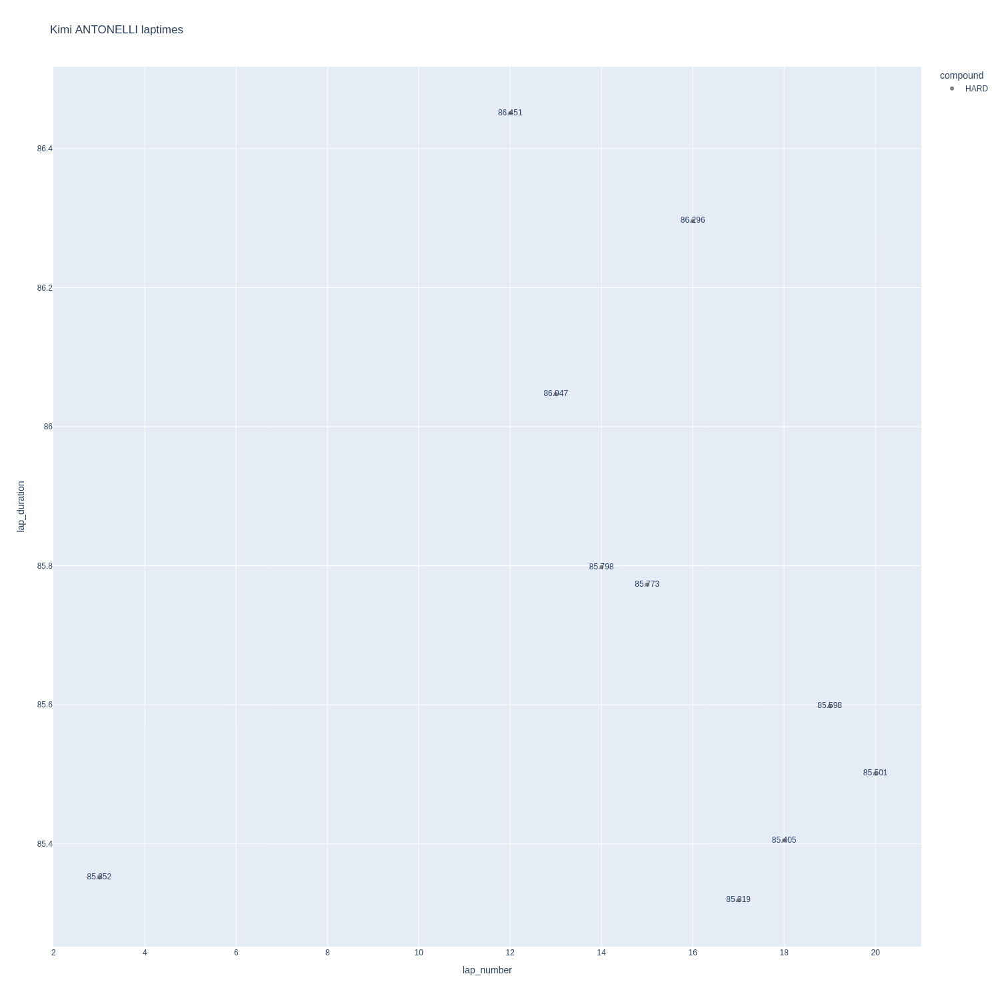

In [36]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

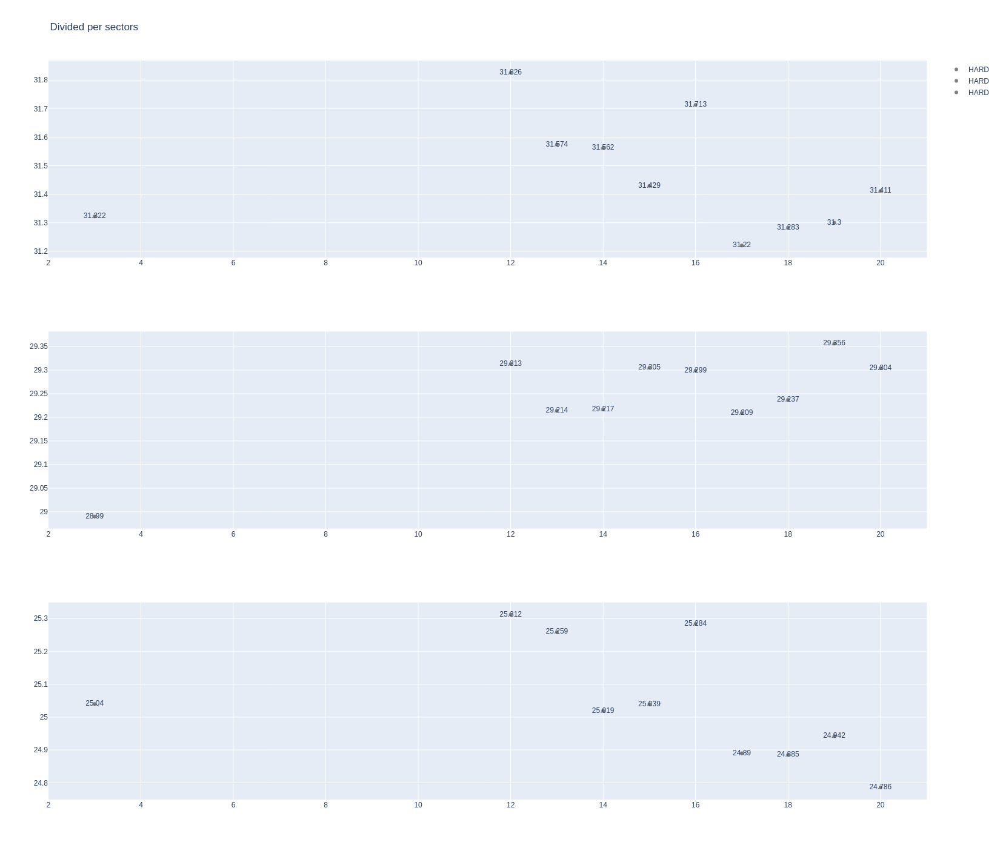

In [37]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [38]:
data = libraryDataF1.getinfolongruns(jointables2,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
226,George RUSSELL,HARD,2025-11-28T13:56:18.337000+00:00,13,31.714,29.176,25.209,86.099
237,George RUSSELL,HARD,2025-11-28T13:57:44.435000+00:00,14,31.656,29.233,25.007,85.896
248,George RUSSELL,HARD,2025-11-28T13:59:10.341000+00:00,15,31.460,29.286,24.784,85.530
262,George RUSSELL,HARD,2025-11-28T14:00:35.784000+00:00,16,31.270,29.297,24.743,85.310
278,George RUSSELL,HARD,2025-11-28T14:02:01.105000+00:00,17,31.511,29.448,24.998,85.957
297,George RUSSELL,HARD,2025-11-28T14:03:27.167000+00:00,18,31.177,29.430,24.792,85.399
329,George RUSSELL,HARD,2025-11-28T14:06:23.715000+00:00,20,31.340,29.221,24.589,85.150
345,George RUSSELL,HARD,2025-11-28T14:07:48.917000+00:00,21,31.505,29.236,24.617,85.358
359,George RUSSELL,HARD,2025-11-28T14:09:14.212000+00:00,22,31.312,29.245,24.520,85.077


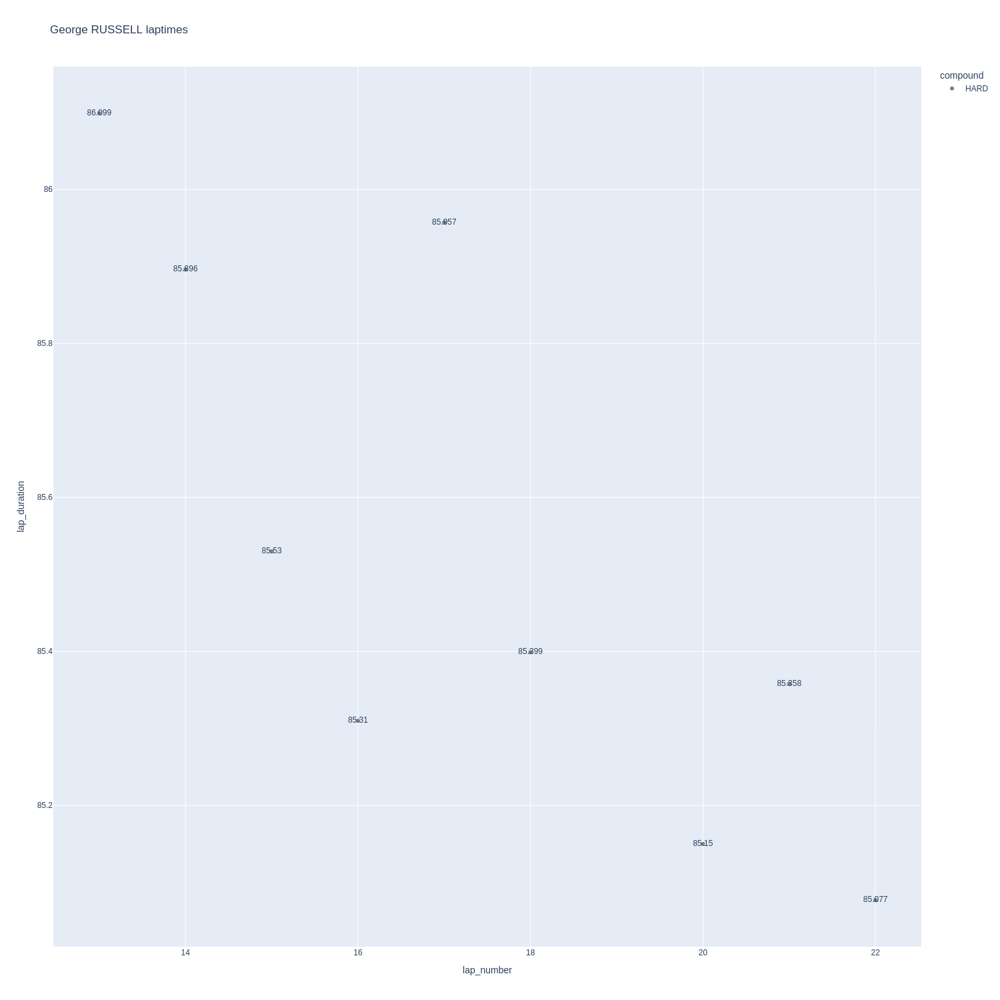

In [39]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

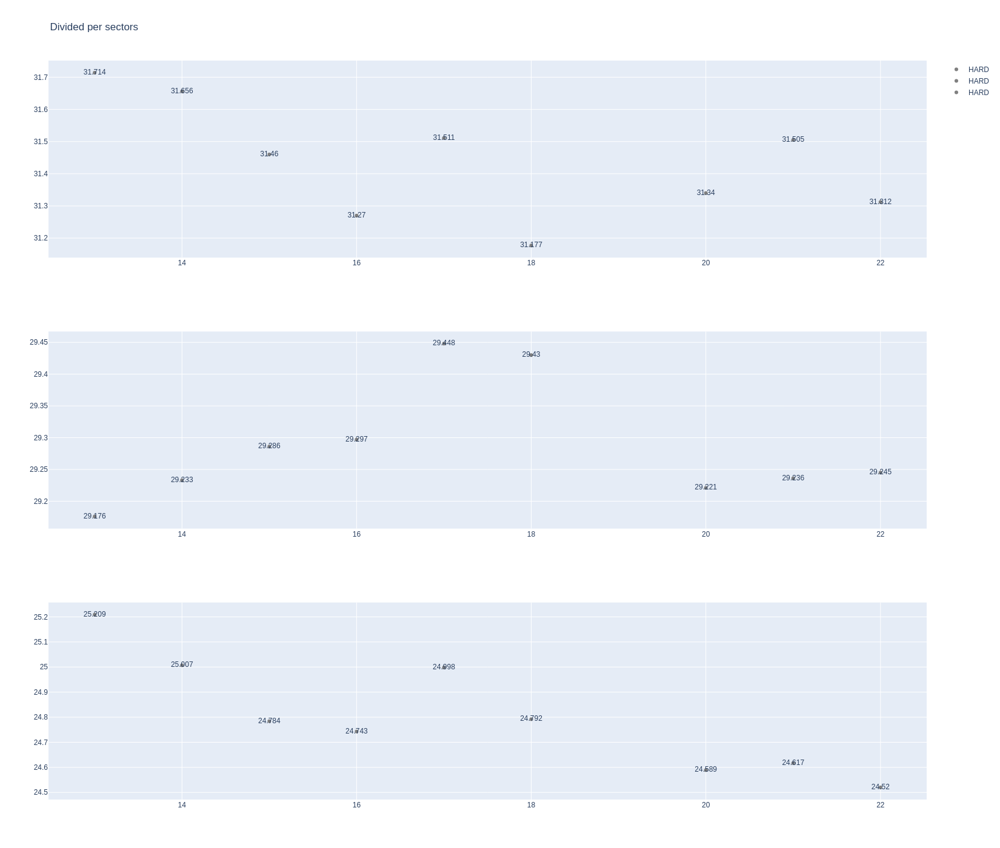

In [40]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [41]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
8,1275,9840,1,4,1,6,HARD,0
9,1275,9840,1,81,1,7,HARD,0
41,1275,9840,2,4,7,19,HARD,6
42,1275,9840,2,81,8,20,HARD,7
75,1275,9840,3,4,20,28,SOFT,0
83,1275,9840,3,81,21,29,SOFT,0


In [42]:
data = libraryDataF1.getinfolongruns(jointables2,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
44,Lando NORRIS,HARD,2025-11-28T13:33:48.179000+00:00,2,30.924,29.178,25.793,85.895
282,Lando NORRIS,HARD,2025-11-28T14:02:20.839000+00:00,14,31.981,28.893,24.278,85.152
332,Lando NORRIS,HARD,2025-11-28T14:06:35.184000+00:00,17,31.349,29.326,24.574,85.249


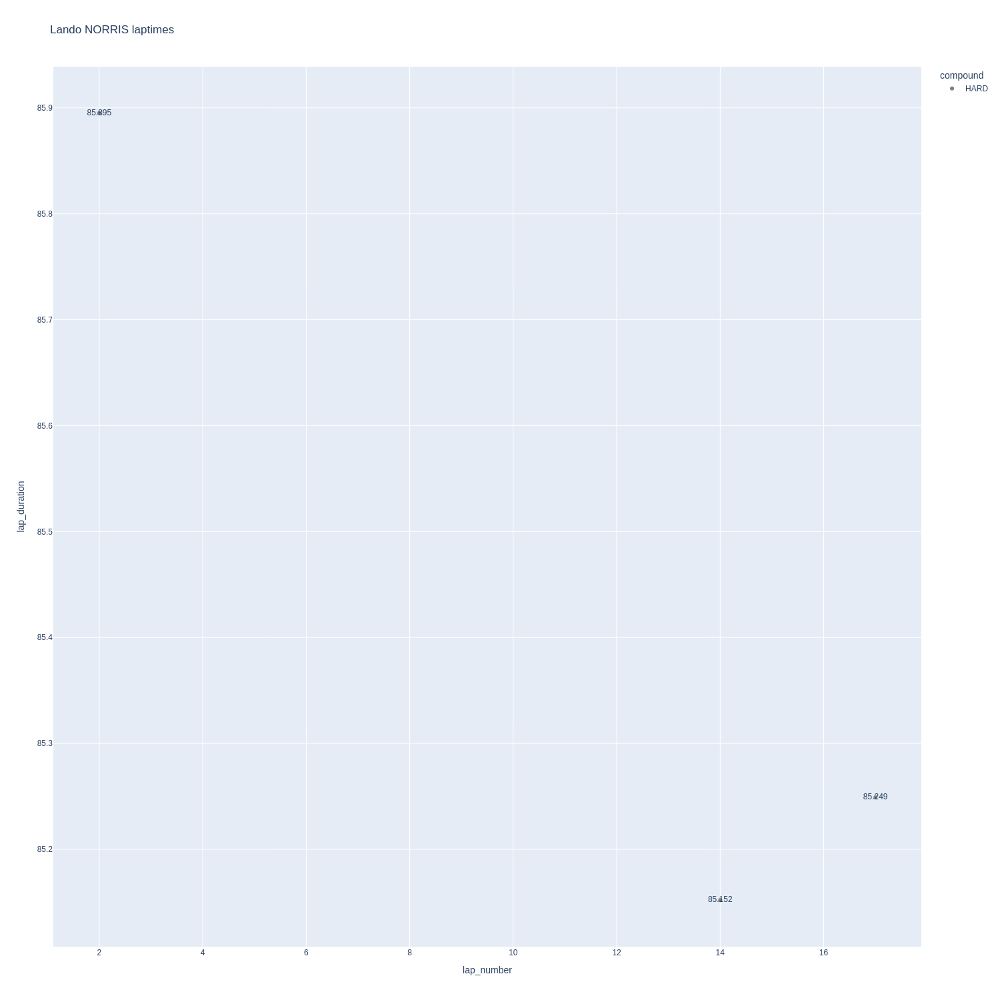

In [43]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

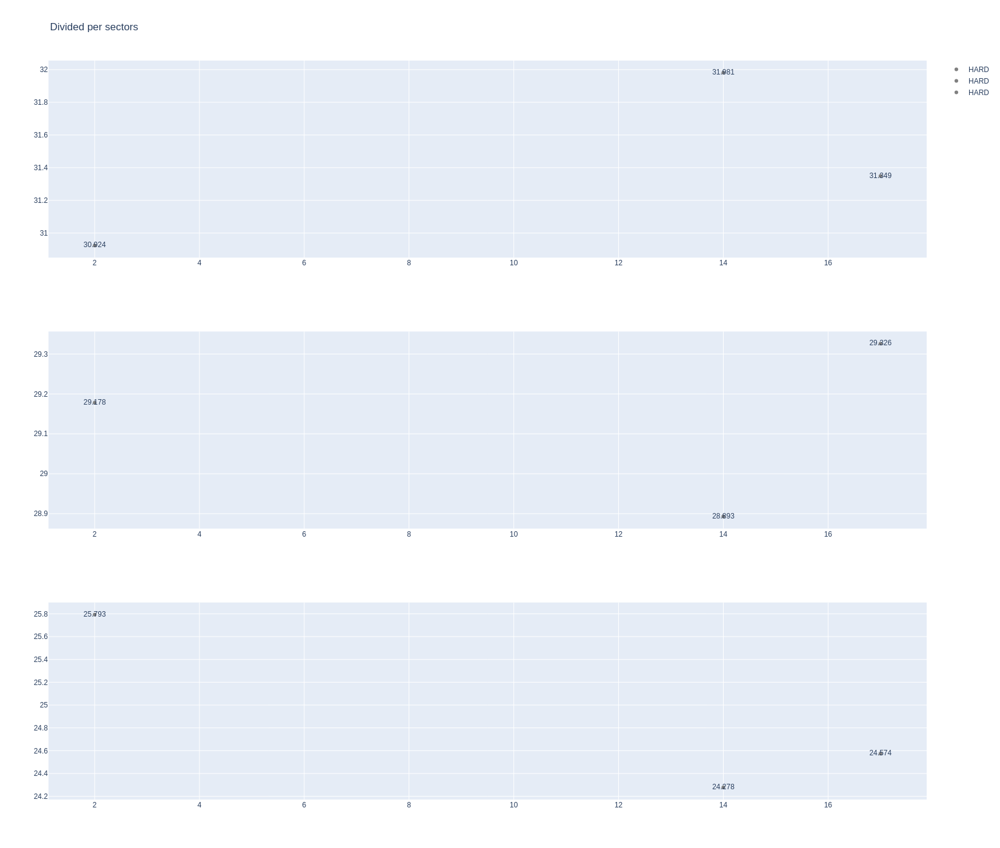

In [44]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [45]:
data = libraryDataF1.getinfolongruns(jointables2,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
37,Oscar PIASTRI,HARD,2025-11-28T13:33:32.026000+00:00,2,31.232,28.855,25.261,85.348
261,Oscar PIASTRI,HARD,2025-11-28T14:00:31.658000+00:00,13,31.164,29.361,24.496,85.021
342,Oscar PIASTRI,HARD,2025-11-28T14:07:34.257000+00:00,18,31.055,29.487,24.577,85.119


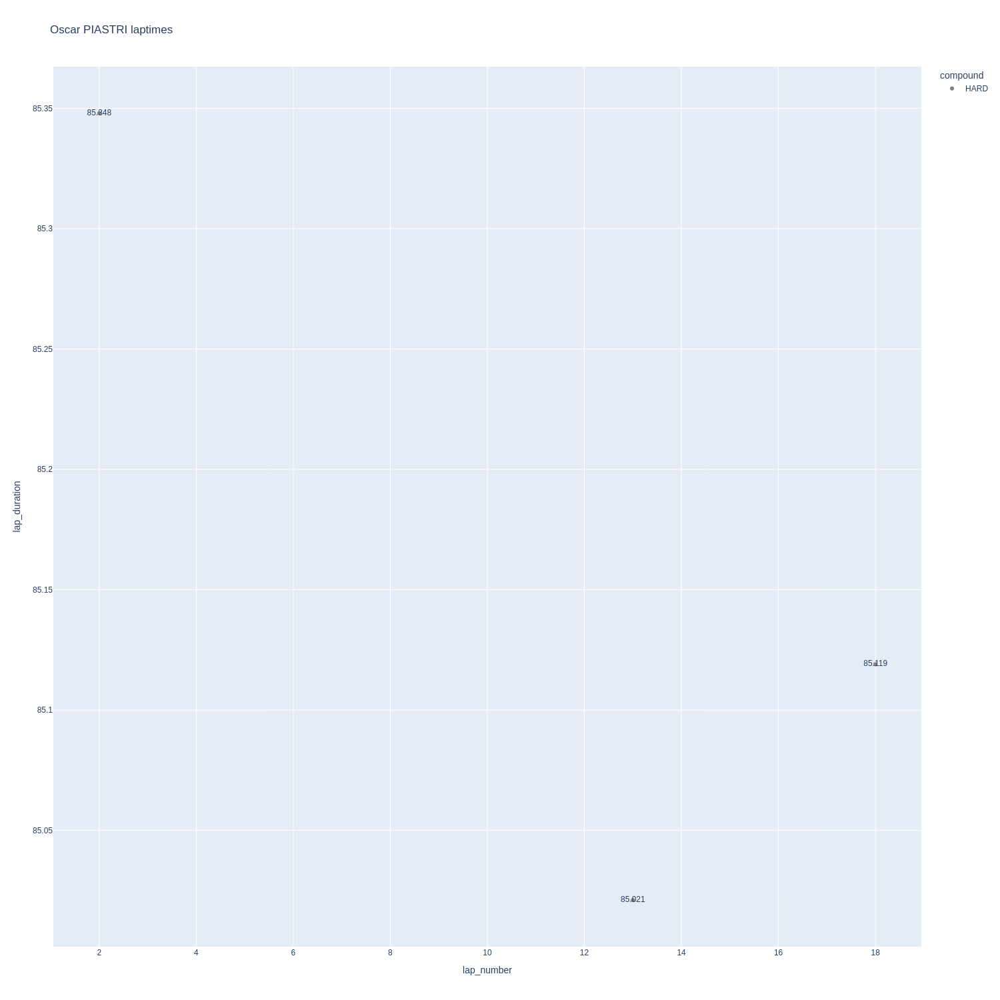

In [46]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

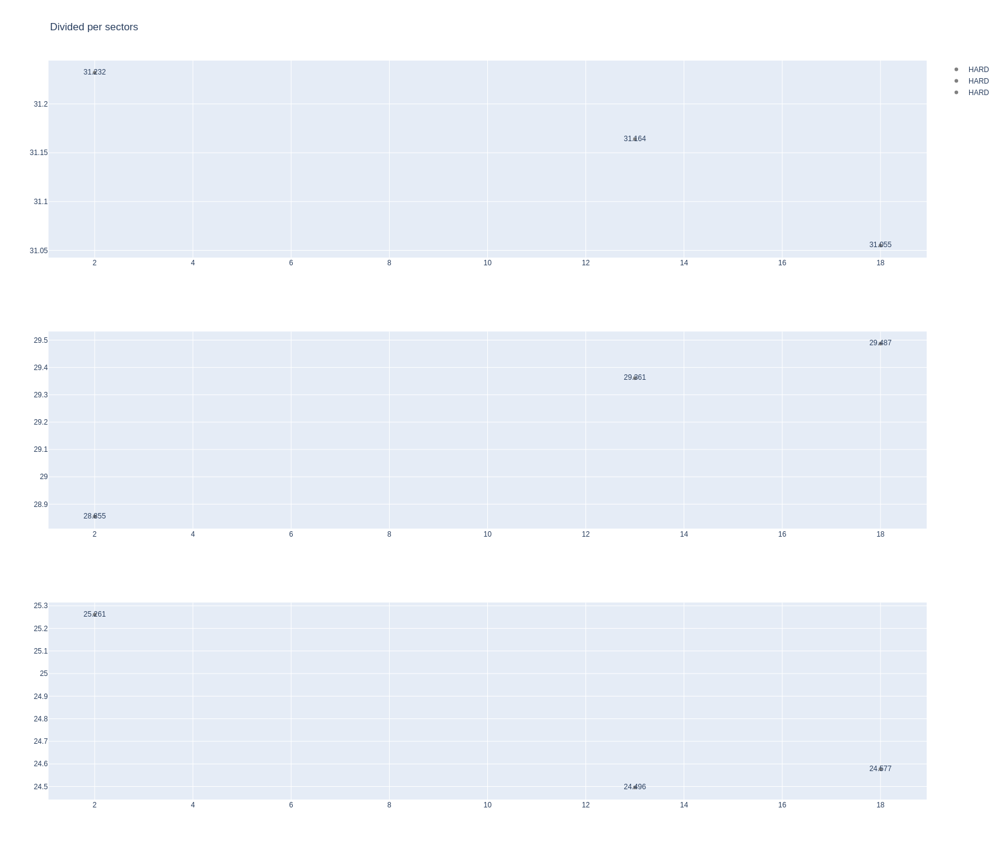

In [47]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [48]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
19,1275,9840,1,14,1,9,HARD,0
23,1275,9840,1,18,1,10,HARD,0
33,1275,9840,2,18,11,16,HARD,10
37,1275,9840,2,14,10,17,HARD,9
63,1275,9840,3,14,18,23,SOFT,0
72,1275,9840,3,18,17,26,SOFT,0
73,1275,9840,4,14,24,26,HARD,17


In [49]:
data = libraryDataF1.getinfolongruns(jointables2,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
286,Fernando ALONSO,HARD,2025-11-28T14:02:57.245000+00:00,13,31.788,28.920,25.029,85.737
304,Fernando ALONSO,HARD,2025-11-28T14:04:23.074000+00:00,14,31.487,29.055,24.853,85.395
321,Fernando ALONSO,HARD,2025-11-28T14:05:48.418000+00:00,15,31.300,29.060,24.878,85.238
337,Fernando ALONSO,HARD,2025-11-28T14:07:13.606000+00:00,16,31.333,29.042,24.800,85.175


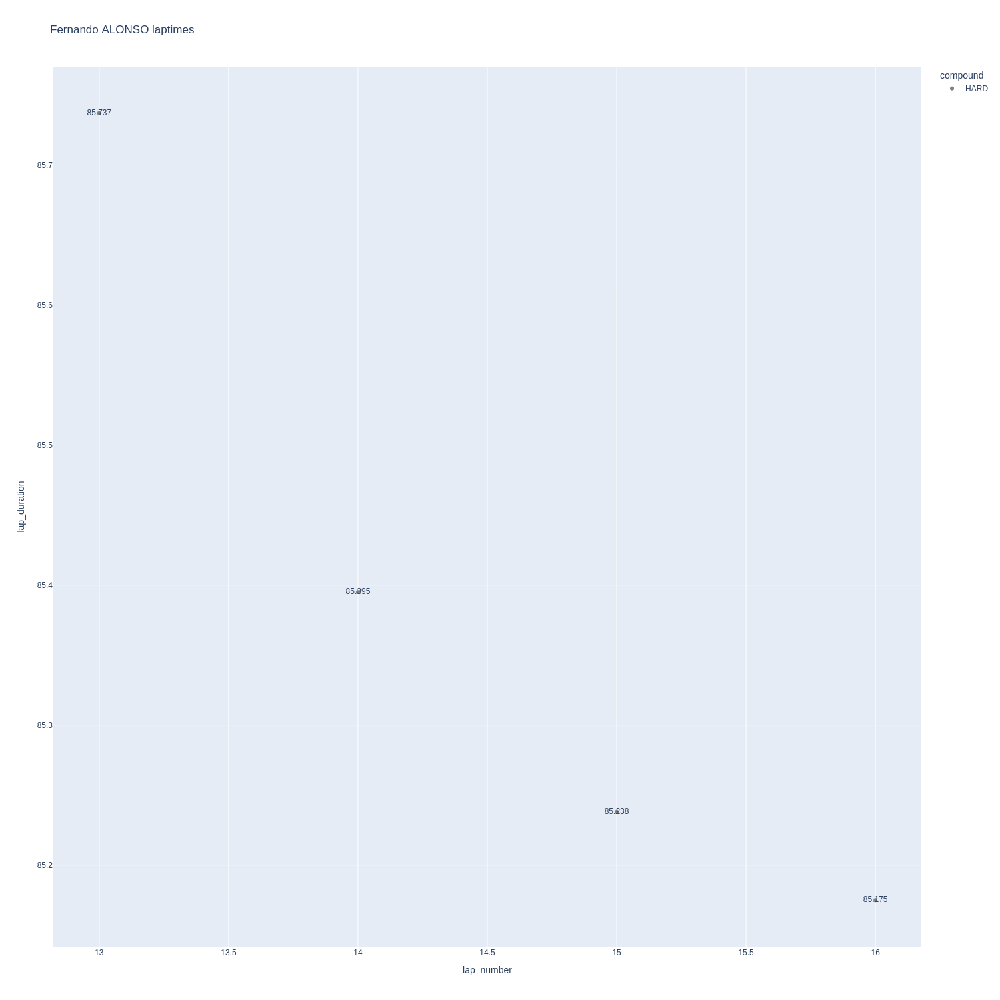

In [50]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

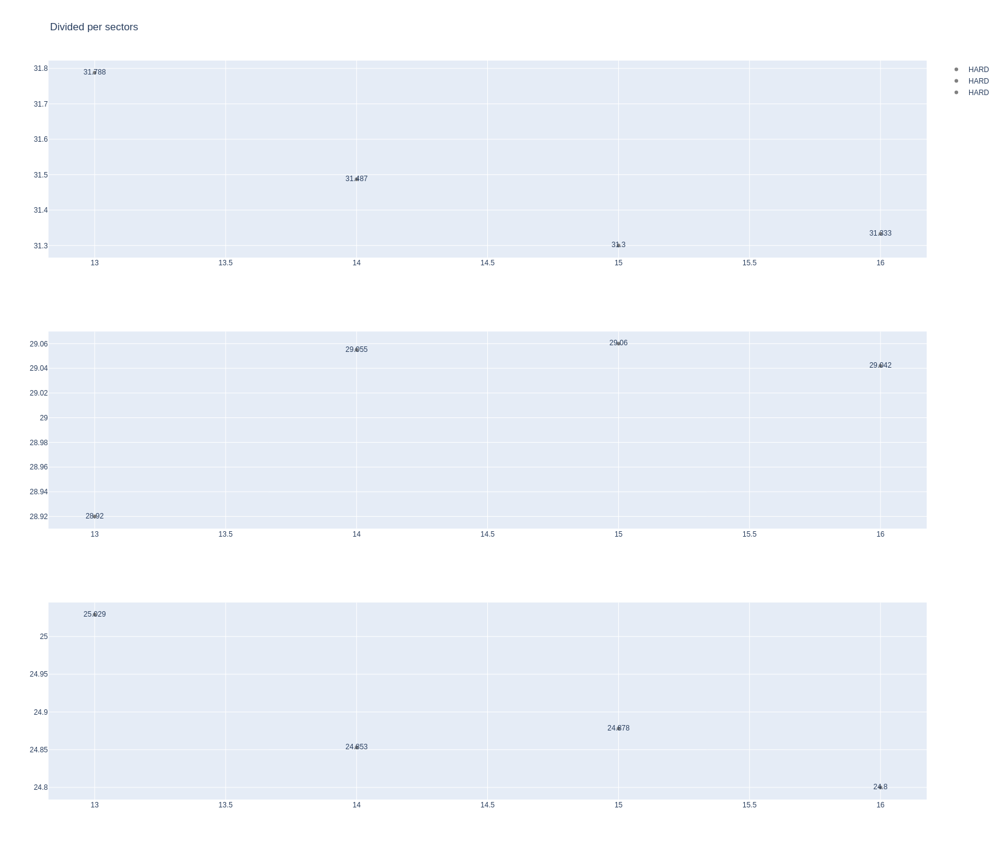

In [51]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [52]:
data = libraryDataF1.getinfolongruns(jointables2,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
53,Lance STROLL,HARD,2025-11-28T13:34:49.050000+00:00,2,31.637,28.834,25.036,85.507
340,Lance STROLL,HARD,2025-11-28T14:07:30.340000+00:00,15,31.395,29.200,24.667,85.262


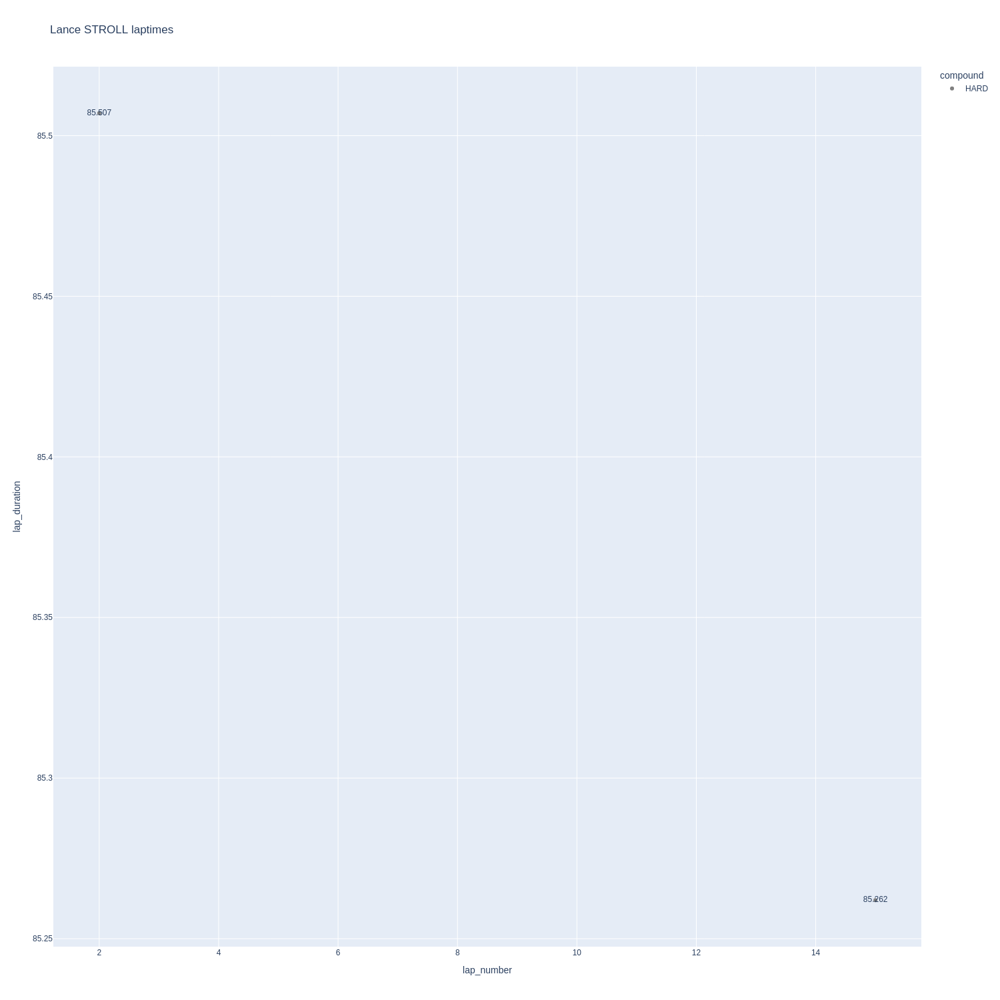

In [53]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

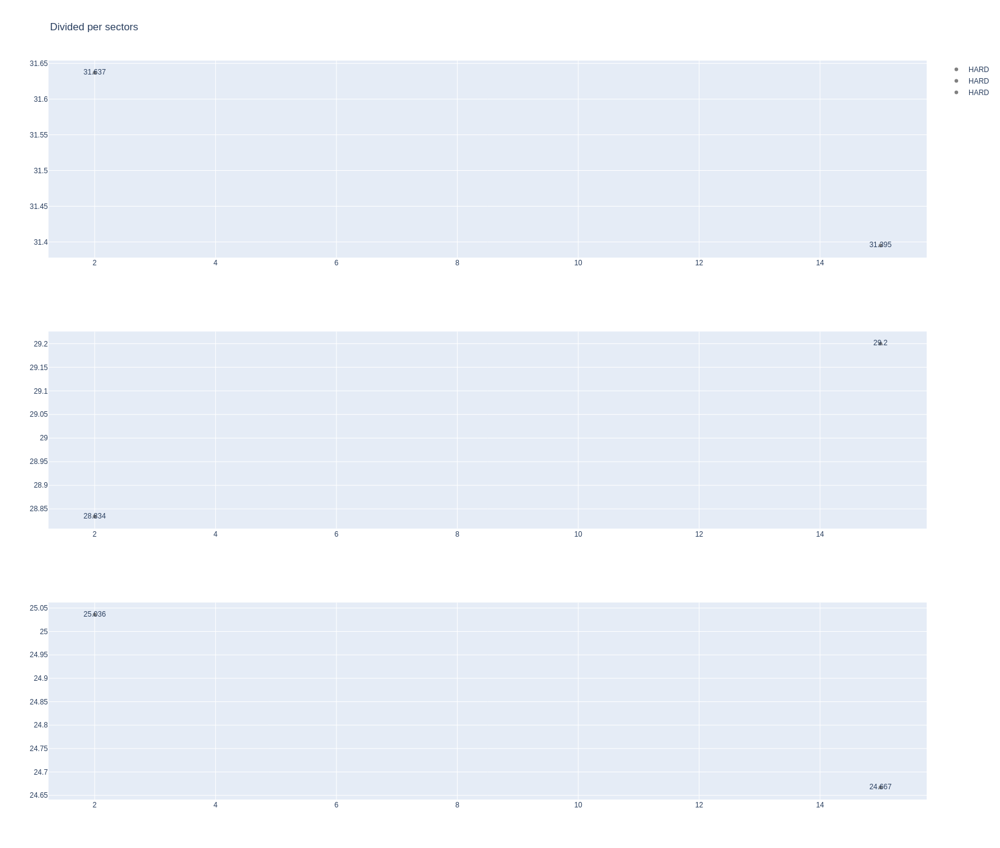

In [54]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [55]:
stintInformation.query('driver_number == 30 or driver_number == 6')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1275,9840,1,30,1,4,HARD,0
2,1275,9840,1,6,1,4,HARD,0
5,1275,9840,2,30,5,9,HARD,4
11,1275,9840,2,6,5,11,HARD,4
17,1275,9840,3,30,10,12,HARD,9
34,1275,9840,3,6,12,21,HARD,11
35,1275,9840,4,30,13,22,HARD,0
50,1275,9840,5,30,23,25,SOFT,0
54,1275,9840,4,6,22,24,SOFT,0
64,1275,9840,6,30,26,27,SOFT,0


In [56]:
data = libraryDataF1.getinfolongruns(jointables2,30,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
19,Liam LAWSON,HARD,2025-11-28T13:31:52.773000+00:00,2,32.246,29.316,25.301,86.863
34,Liam LAWSON,HARD,2025-11-28T13:33:19.588000+00:00,3,31.464,29.003,24.912,85.379
244,Liam LAWSON,HARD,2025-11-28T13:58:50.935000+00:00,14,31.777,29.183,25.138,86.098
259,Liam LAWSON,HARD,2025-11-28T14:00:16.951000+00:00,15,31.831,29.124,24.997,85.952
274,Liam LAWSON,HARD,2025-11-28T14:01:42.876000+00:00,16,31.731,29.292,25.050,86.073
290,Liam LAWSON,HARD,2025-11-28T14:03:09.027000+00:00,17,31.630,29.766,25.214,86.610
307,Liam LAWSON,HARD,2025-11-28T14:04:35.715000+00:00,18,31.654,29.095,24.774,85.523
323,Liam LAWSON,HARD,2025-11-28T14:06:01.090000+00:00,19,31.527,29.233,24.803,85.563
339,Liam LAWSON,HARD,2025-11-28T14:07:26.792000+00:00,20,31.464,29.223,24.744,85.431
354,Liam LAWSON,HARD,2025-11-28T14:08:52.227000+00:00,21,31.521,29.221,24.733,85.475


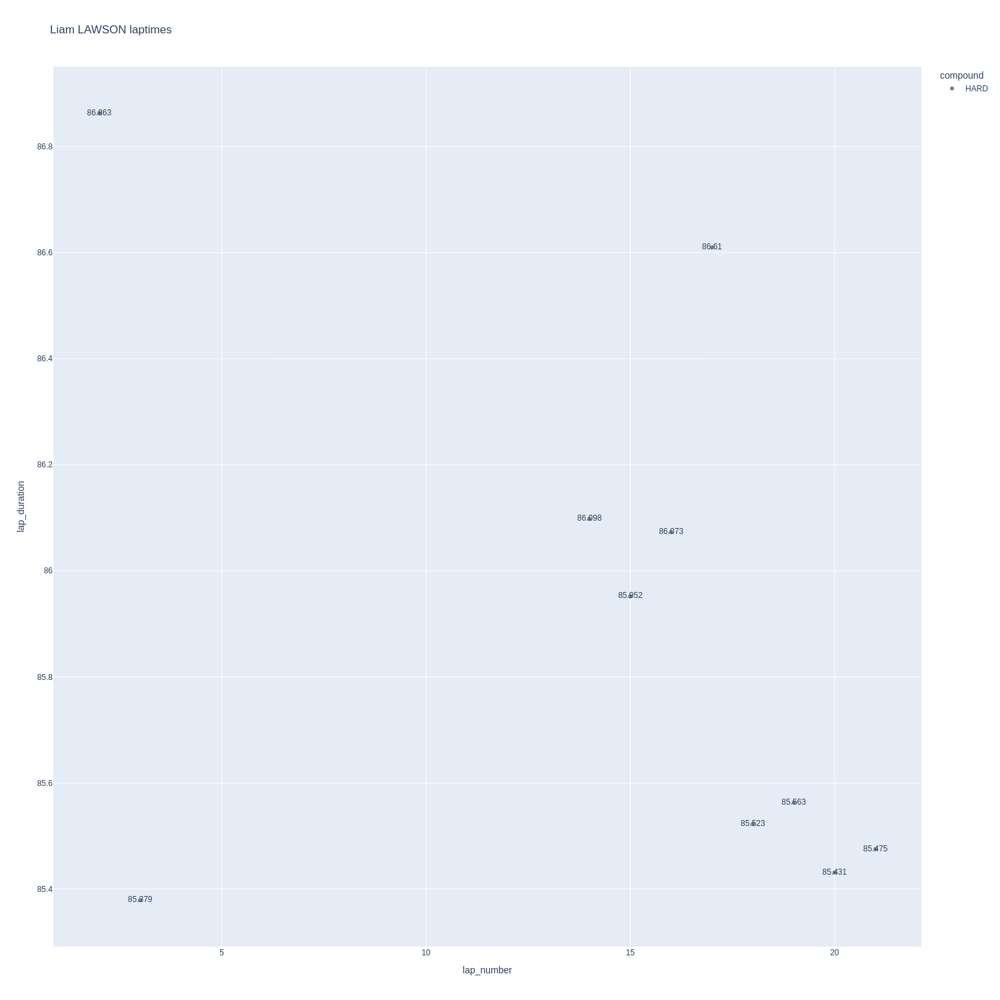

In [57]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

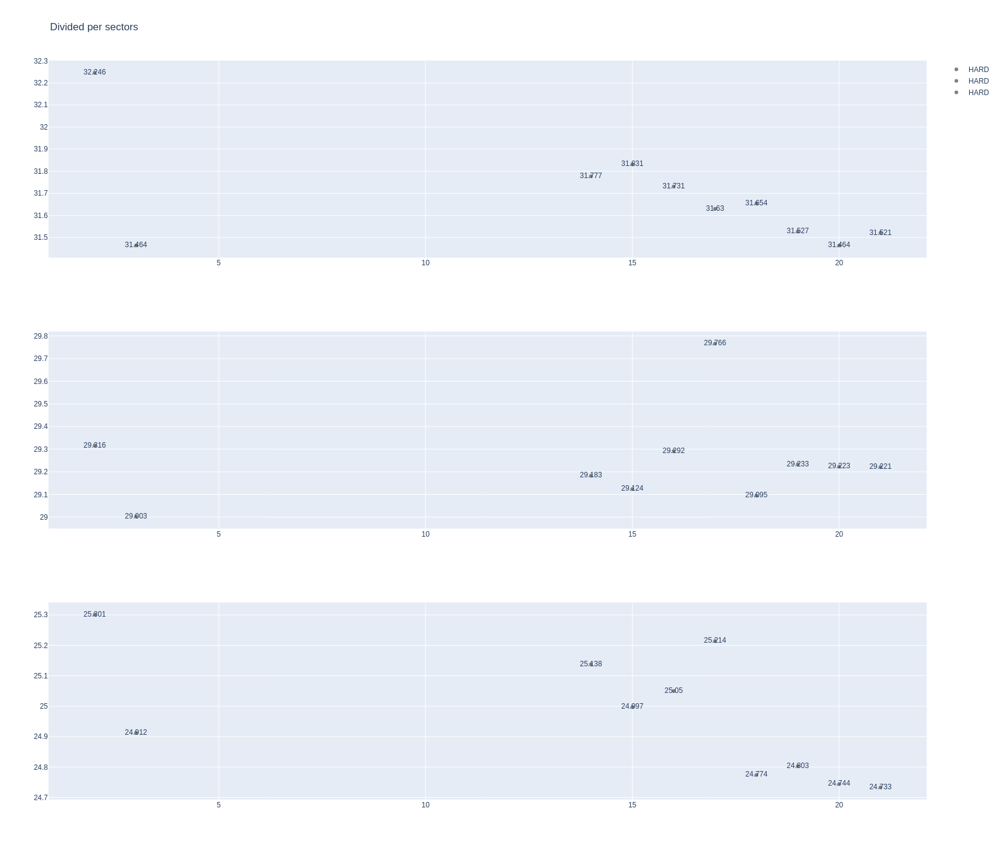

In [58]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [59]:
data = libraryDataF1.getinfolongruns(jointables2,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
21,Isack HADJAR,HARD,2025-11-28T13:31:59.420000+00:00,2,32.212,29.266,25.519,86.997
36,Isack HADJAR,HARD,2025-11-28T13:33:26.245000+00:00,3,31.263,28.963,25.104,85.330
223,Isack HADJAR,HARD,2025-11-28T13:55:46.178000+00:00,13,32.078,29.483,25.825,87.386
231,Isack HADJAR,HARD,2025-11-28T13:57:13.481000+00:00,14,31.929,29.264,25.647,86.840
243,Isack HADJAR,HARD,2025-11-28T13:58:40.396000+00:00,15,31.725,29.023,25.377,86.125
257,Isack HADJAR,HARD,2025-11-28T14:00:06.389000+00:00,16,31.739,29.063,25.206,86.008
273,Isack HADJAR,HARD,2025-11-28T14:01:32.469000+00:00,17,31.531,29.242,25.354,86.127
305,Isack HADJAR,HARD,2025-11-28T14:04:27.668000+00:00,19,31.500,29.021,25.002,85.523
322,Isack HADJAR,HARD,2025-11-28T14:05:53.137000+00:00,20,31.443,29.055,24.888,85.386


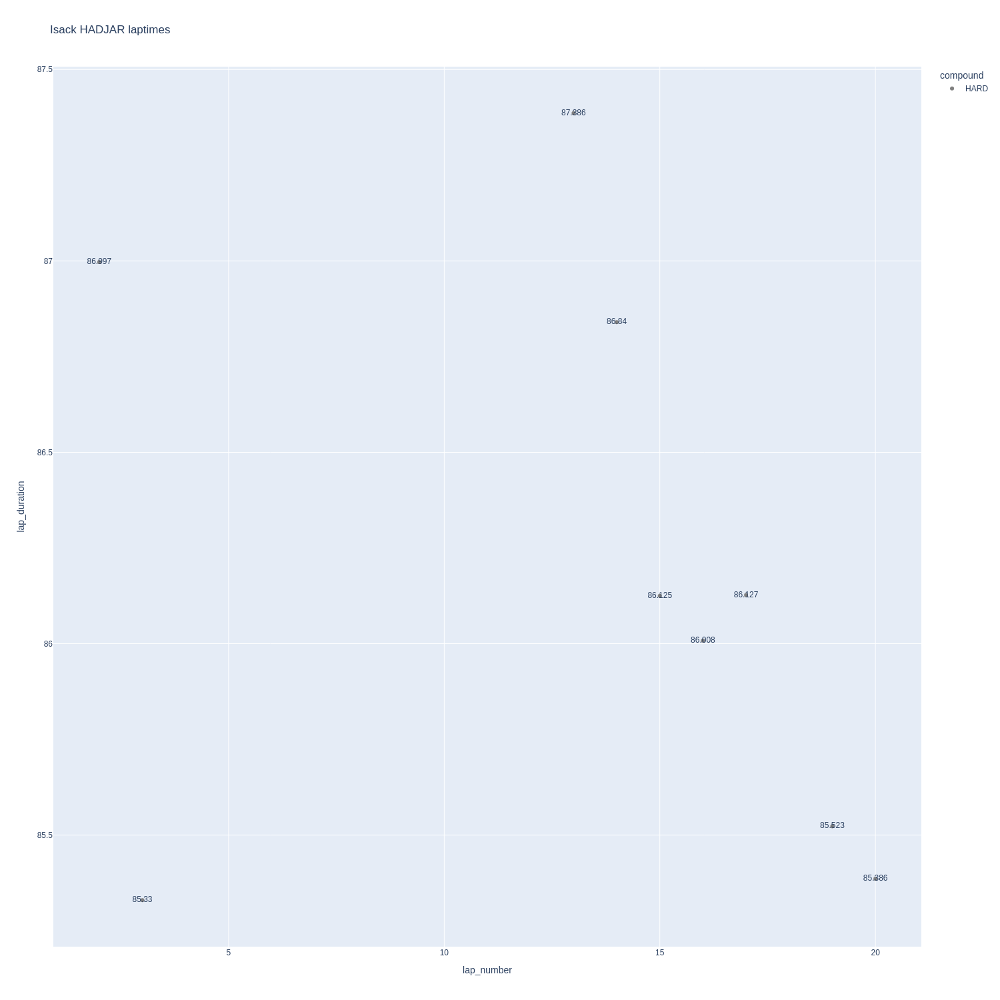

In [60]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

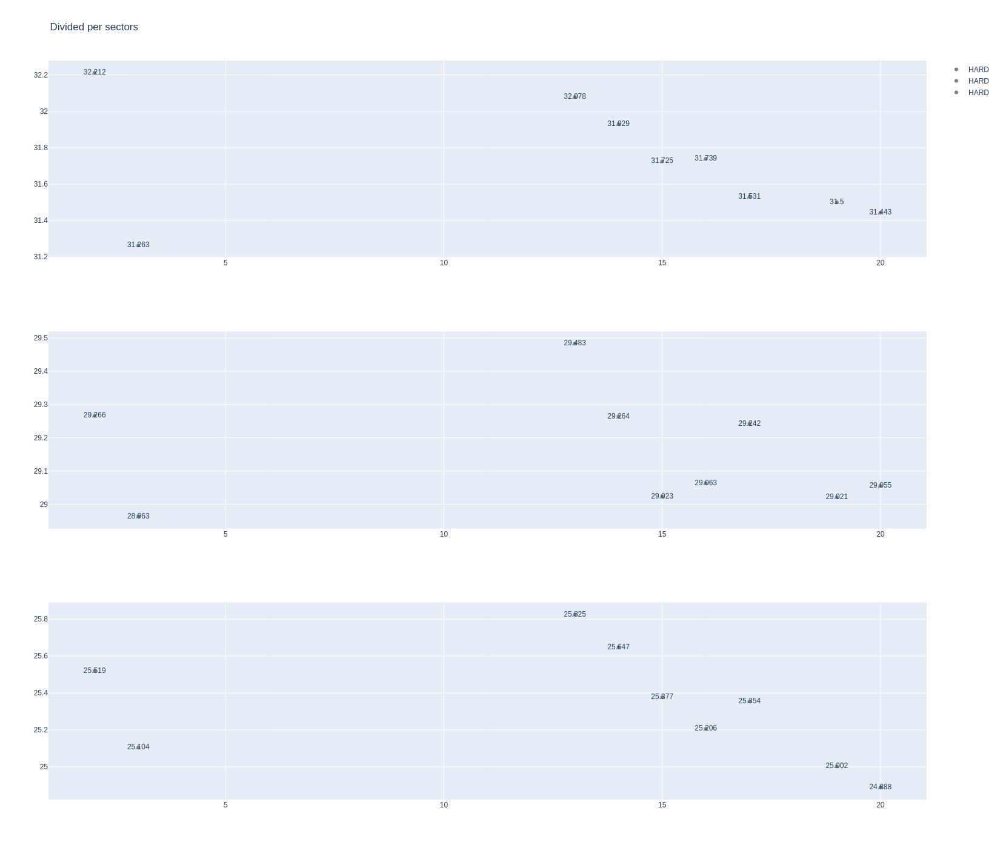

In [61]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [62]:
stintInformation.query('driver_number == 31 or driver_number == 87')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
10,1275,9840,1,87,1,9,HARD,0
15,1275,9840,1,31,1,10,HARD,0
30,1275,9840,2,31,11,20,HARD,10
31,1275,9840,2,87,10,16,HARD,9
47,1275,9840,3,31,21,23,SOFT,0
48,1275,9840,3,87,17,19,SOFT,0
70,1275,9840,4,31,24,30,SOFT,3
71,1275,9840,4,87,20,26,SOFT,3


In [63]:
data = libraryDataF1.getinfolongruns(jointables2,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
22,Esteban OCON,HARD,2025-11-28T13:32:09.007000+00:00,2,32.052,29.629,25.802,87.483
38,Esteban OCON,HARD,2025-11-28T13:33:36.416000+00:00,3,31.247,28.990,25.143,85.380
230,Esteban OCON,HARD,2025-11-28T13:56:35.483000+00:00,12,31.441,28.768,24.930,85.139
240,Esteban OCON,HARD,2025-11-28T13:58:00.671000+00:00,13,31.752,28.939,25.140,85.831
251,Esteban OCON,HARD,2025-11-28T13:59:26.494000+00:00,14,31.541,28.953,24.966,85.460
265,Esteban OCON,HARD,2025-11-28T14:00:51.985000+00:00,15,31.556,28.924,24.892,85.372
281,Esteban OCON,HARD,2025-11-28T14:02:17.464000+00:00,16,31.687,29.100,24.913,85.700
298,Esteban OCON,HARD,2025-11-28T14:03:43.027000+00:00,17,31.769,29.107,25.320,86.196
316,Esteban OCON,HARD,2025-11-28T14:05:09.168000+00:00,18,31.403,29.171,24.836,85.410
331,Esteban OCON,HARD,2025-11-28T14:06:34.622000+00:00,19,31.339,29.065,24.924,85.328


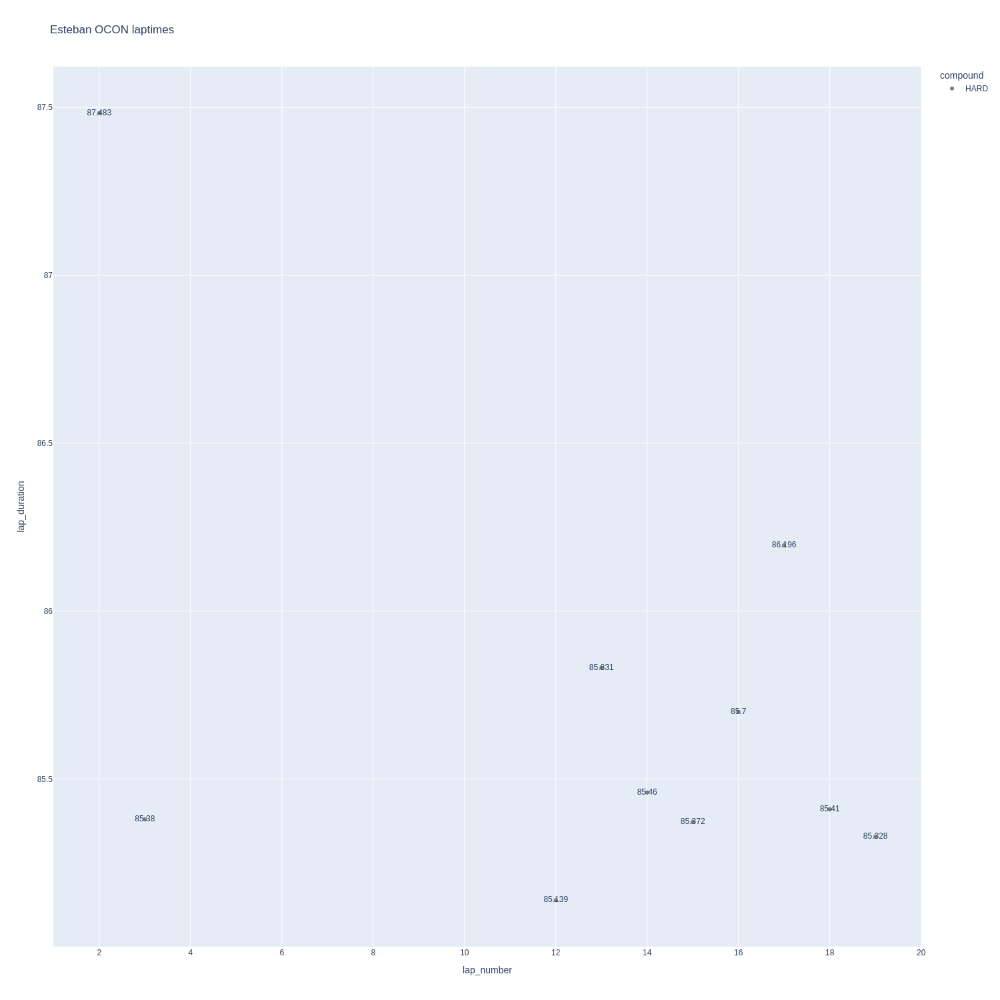

In [64]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

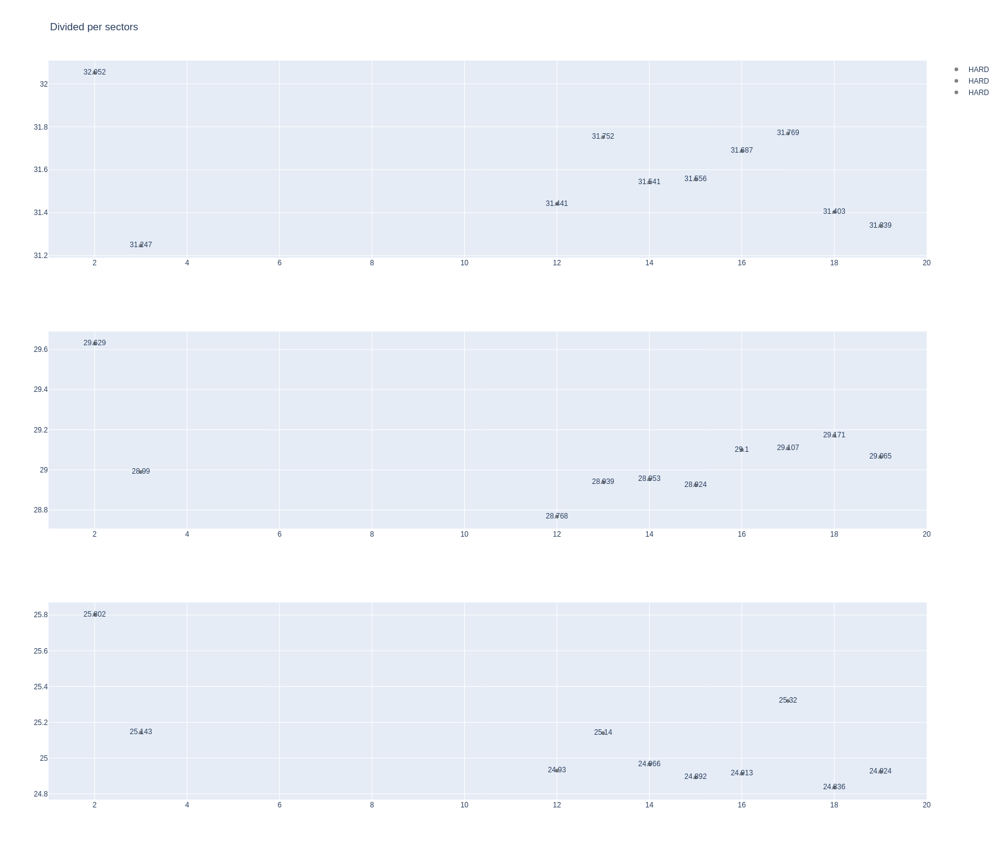

In [65]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [66]:
data = libraryDataF1.getinfolongruns(jointables2,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
24,Oliver BEARMAN,HARD,2025-11-28T13:32:21.158000+00:00,2,31.688,29.218,25.265,86.171
43,Oliver BEARMAN,HARD,2025-11-28T13:33:46.733000+00:00,3,31.351,29.369,25.092,85.812
219,Oliver BEARMAN,HARD,2025-11-28T13:55:04.817000+00:00,11,31.773,29.024,24.944,85.741
228,Oliver BEARMAN,HARD,2025-11-28T13:56:30.585000+00:00,12,31.503,29.023,25.131,85.657
239,Oliver BEARMAN,HARD,2025-11-28T13:57:56.284000+00:00,13,31.628,29.265,25.113,86.006
250,Oliver BEARMAN,HARD,2025-11-28T13:59:22.213000+00:00,14,31.550,29.116,24.869,85.535
264,Oliver BEARMAN,HARD,2025-11-28T14:00:47.729000+00:00,15,31.635,29.513,25.141,86.289


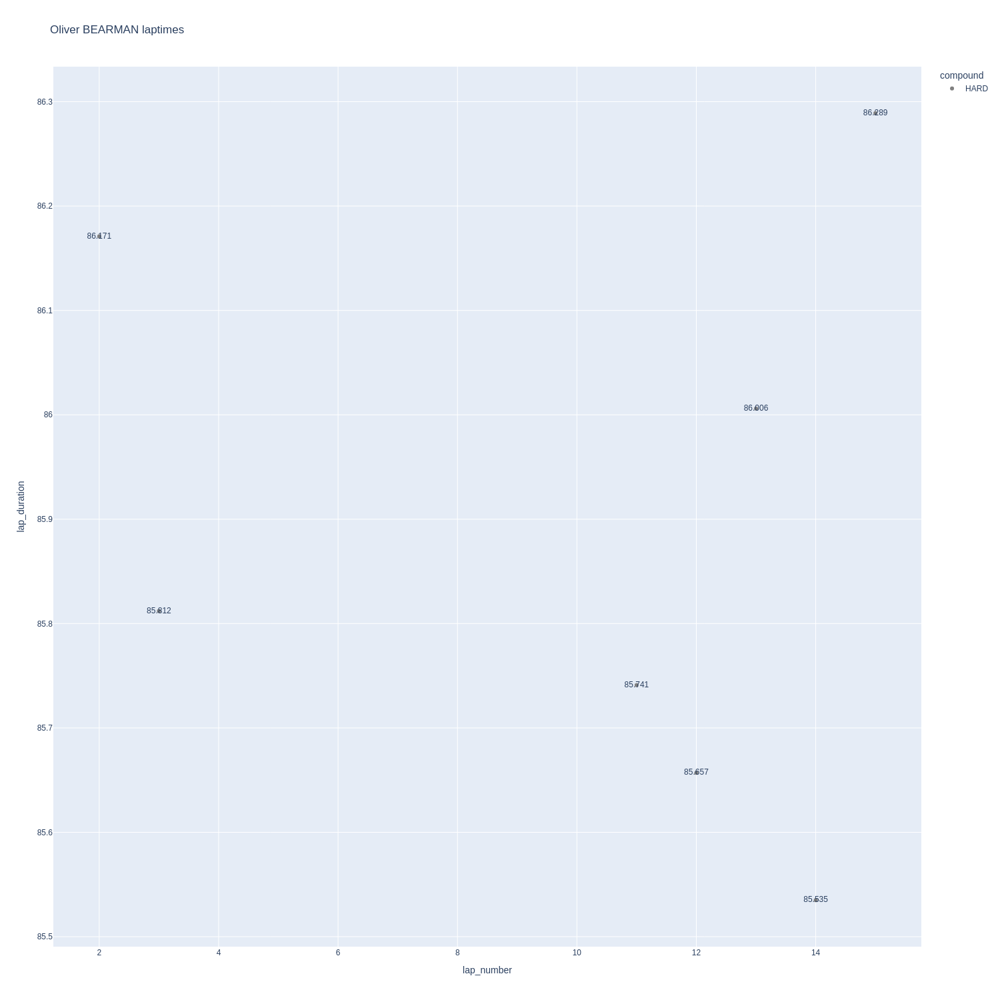

In [67]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

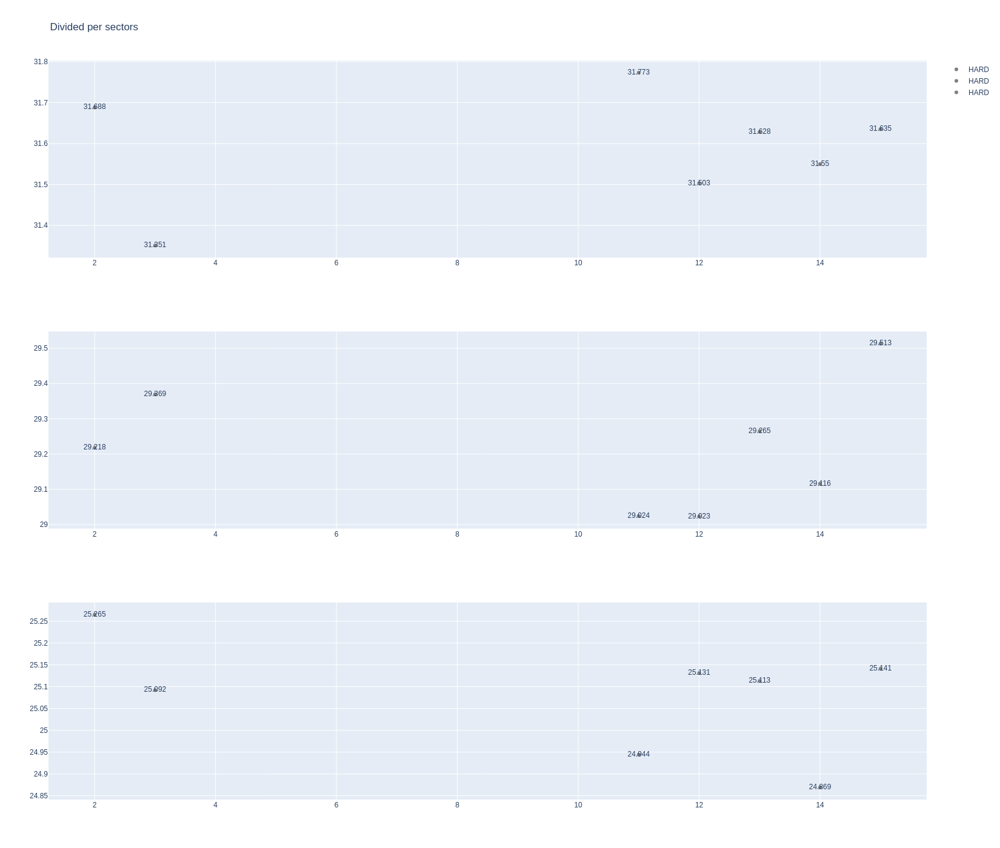

In [68]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [69]:
stintInformation.query('driver_number == 10 or driver_number == 43')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
20,1275,9840,1,10,1,11,HARD,0
24,1275,9840,1,43,1,11,HARD,0
26,1275,9840,2,10,12,13,HARD,11
38,1275,9840,3,10,14,17,HARD,0
40,1275,9840,2,43,12,17,HARD,11
61,1275,9840,4,10,18,22,SOFT,0
66,1275,9840,3,43,18,23,SOFT,0
69,1275,9840,5,10,23,25,HARD,17
81,1275,9840,4,43,24,26,HARD,17


In [70]:
data =libraryDataF1.getinfolongruns(jointables2,43,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
27,Franco COLAPINTO,HARD,2025-11-28T13:32:48.781000+00:00,2,32.050,29.585,25.737,87.372
47,Franco COLAPINTO,HARD,2025-11-28T13:34:15.972000+00:00,3,31.332,29.392,24.975,85.699
319,Franco COLAPINTO,HARD,2025-11-28T14:05:31.152000+00:00,14,32.184,29.091,24.925,86.200
335,Franco COLAPINTO,HARD,2025-11-28T14:06:57.356000+00:00,15,31.500,29.029,24.762,85.291
351,Franco COLAPINTO,HARD,2025-11-28T14:08:22.628000+00:00,16,31.407,29.148,25.743,86.298


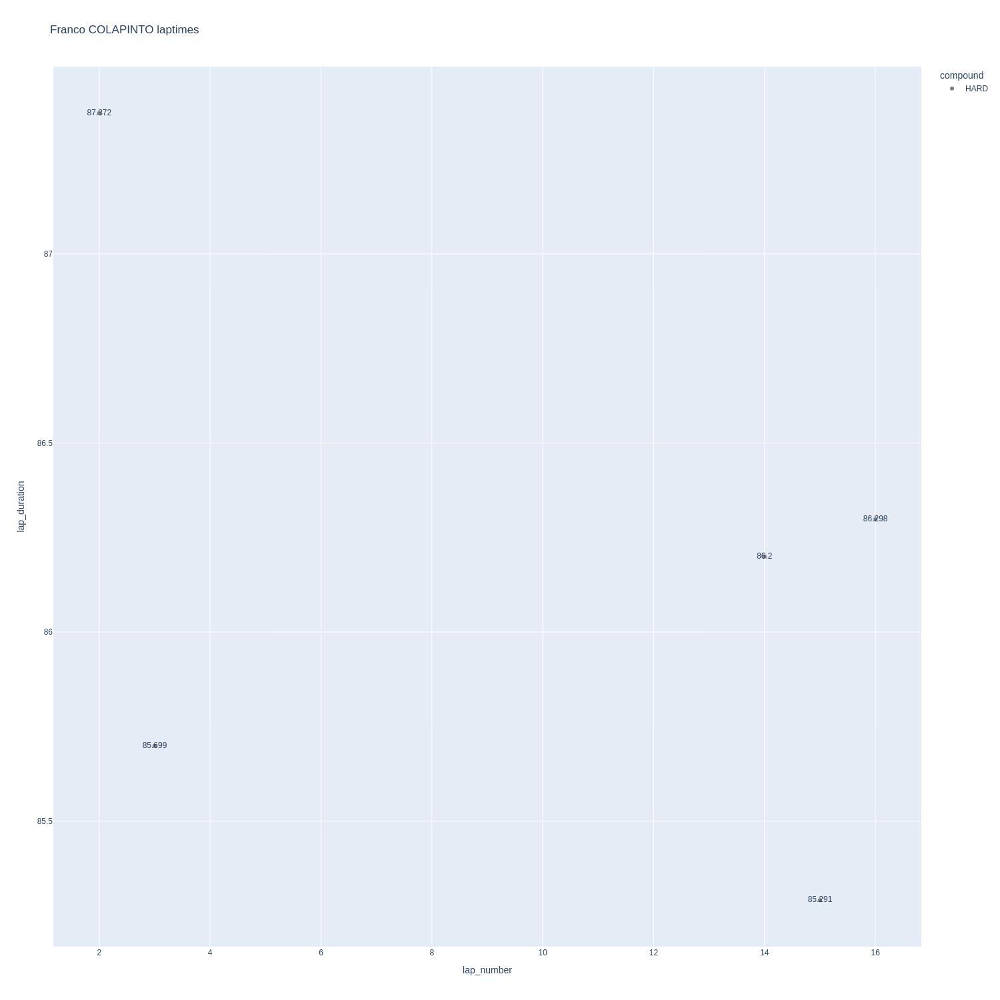

In [71]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

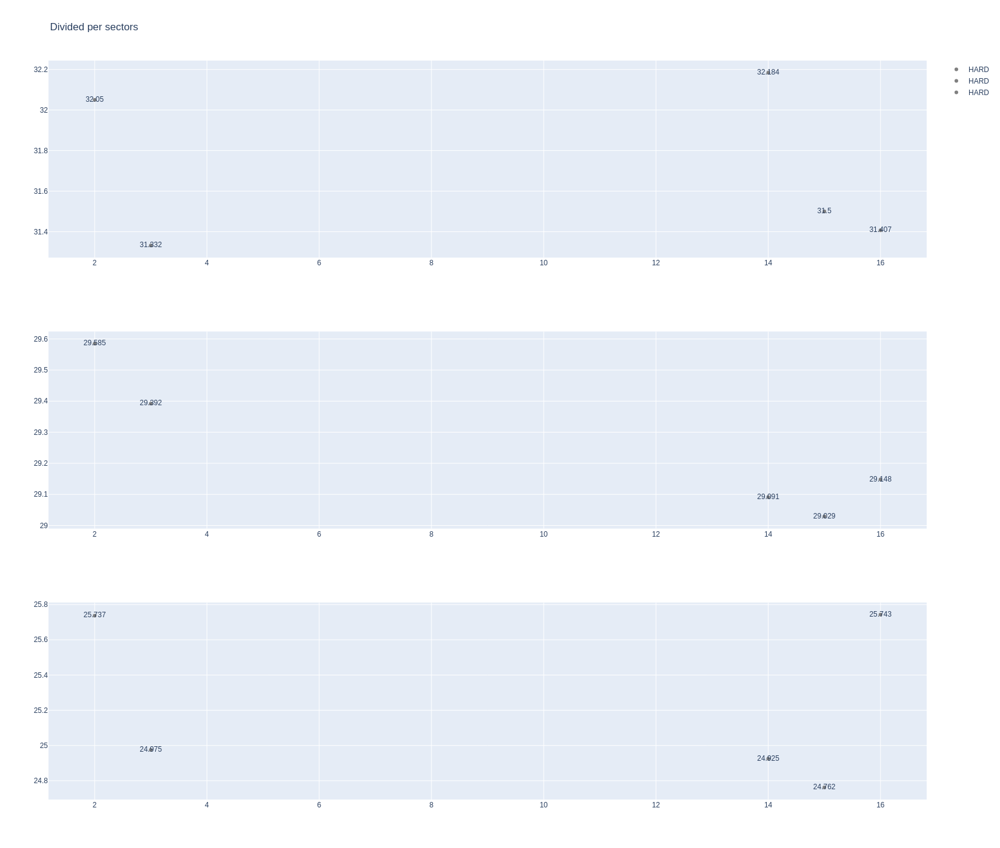

In [72]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [73]:
data = libraryDataF1.getinfolongruns(jointables2,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
49,Pierre GASLY,HARD,2025-11-28T13:34:31.909000+00:00,3,31.365,28.958,24.786,85.109
311,Pierre GASLY,HARD,2025-11-28T14:04:48.371000+00:00,15,31.509,29.149,24.720,85.378
327,Pierre GASLY,HARD,2025-11-28T14:06:13.668000+00:00,16,31.539,28.985,24.663,85.187


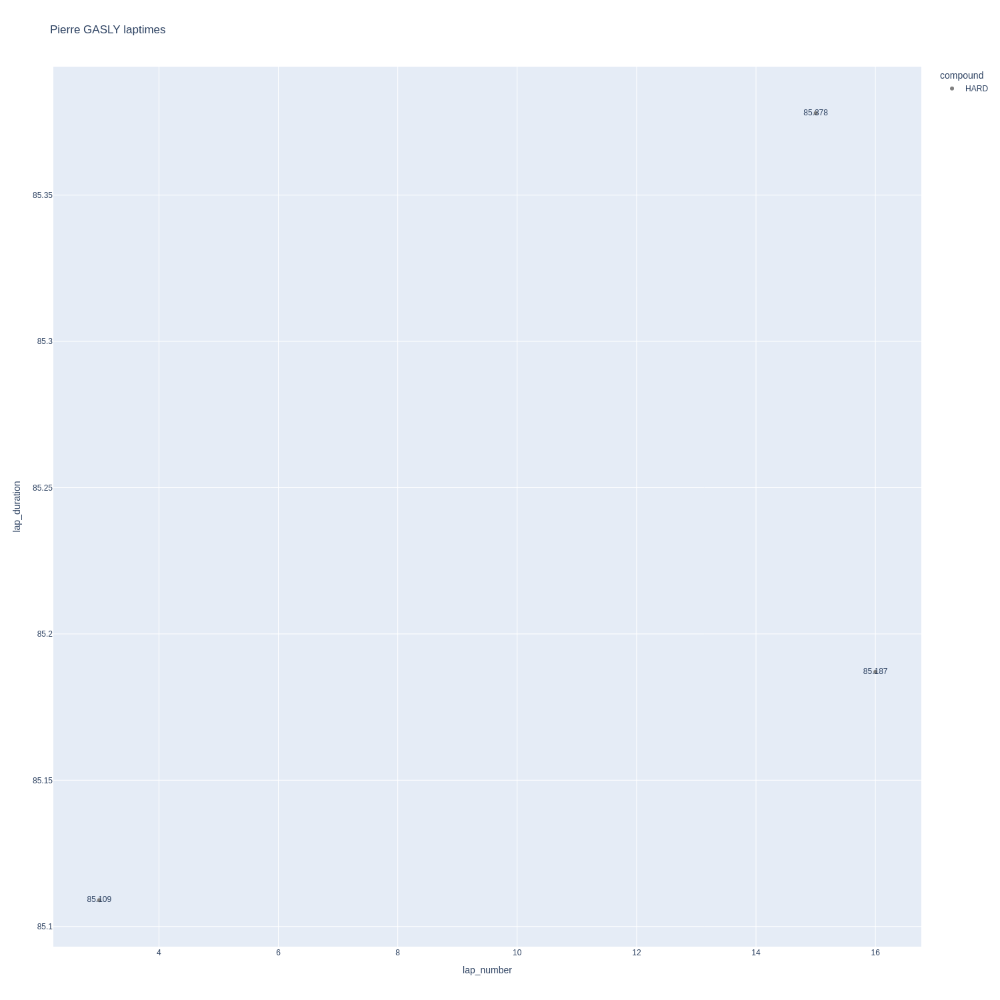

In [74]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

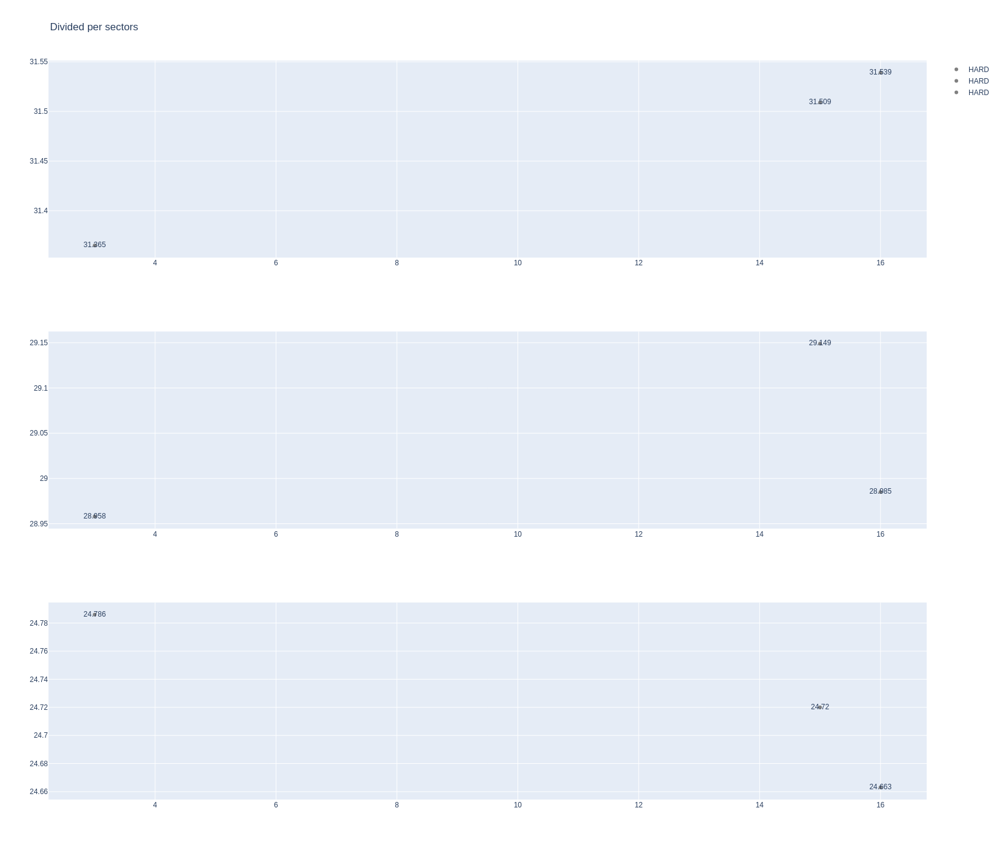

In [75]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [76]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1275,9840,1,23,1,7,HARD,0
6,1275,9840,1,55,1,9,HARD,0
27,1275,9840,2,23,8,13,HARD,7
32,1275,9840,2,55,10,13,HARD,9
36,1275,9840,3,55,14,14,HARD,13
39,1275,9840,3,23,14,21,HARD,13
55,1275,9840,4,55,15,17,SOFT,0
57,1275,9840,5,55,18,20,SOFT,3
62,1275,9840,4,23,22,26,SOFT,0
68,1275,9840,5,23,27,29,HARD,21


In [77]:
data = libraryDataF1.getinfolongruns(jointables2,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
62,Alexander ALBON,HARD,2025-11-28T13:35:17.833000+00:00,3,31.409,28.792,25.004,85.205
213,Alexander ALBON,HARD,2025-11-28T13:54:10.156000+00:00,13,30.350,28.092,29.455,87.897
312,Alexander ALBON,HARD,2025-11-28T14:04:51.090000+00:00,15,31.283,28.877,27.058,87.218
344,Alexander ALBON,HARD,2025-11-28T14:07:43.126000+00:00,17,31.319,28.891,24.926,85.136


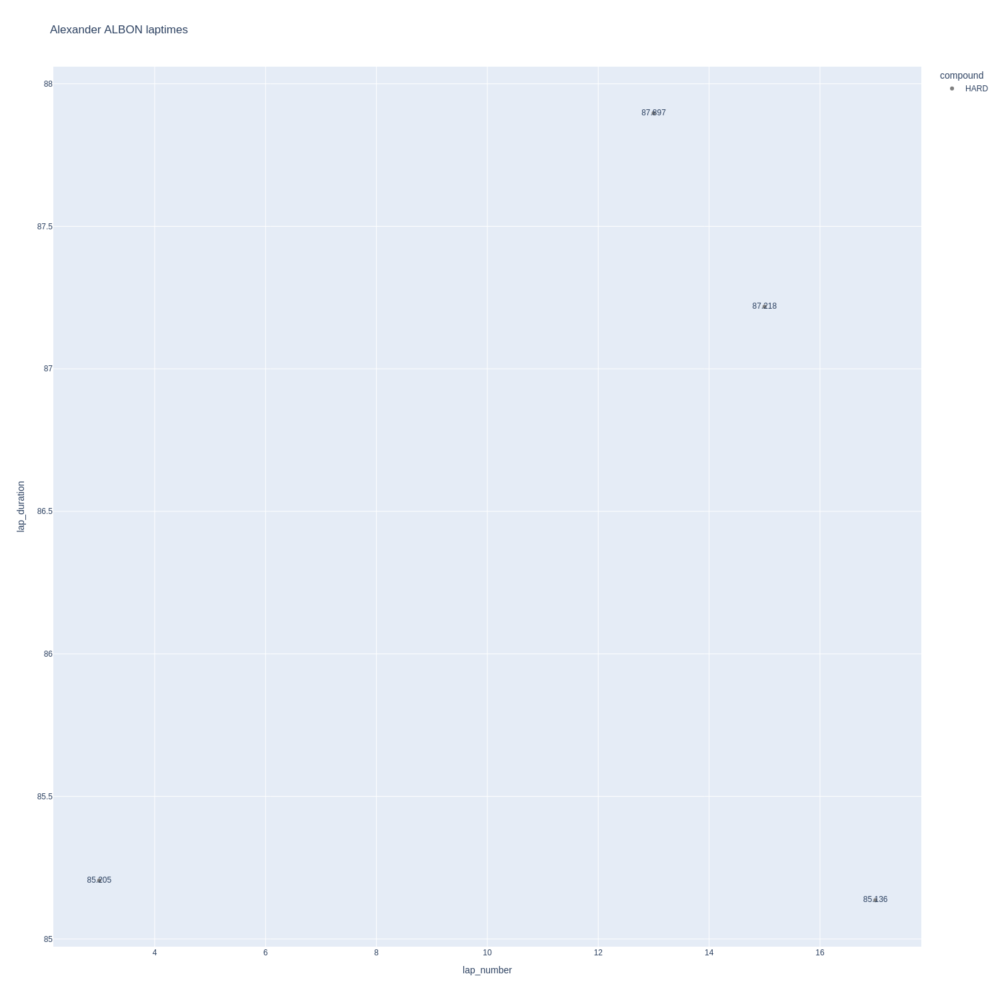

In [78]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

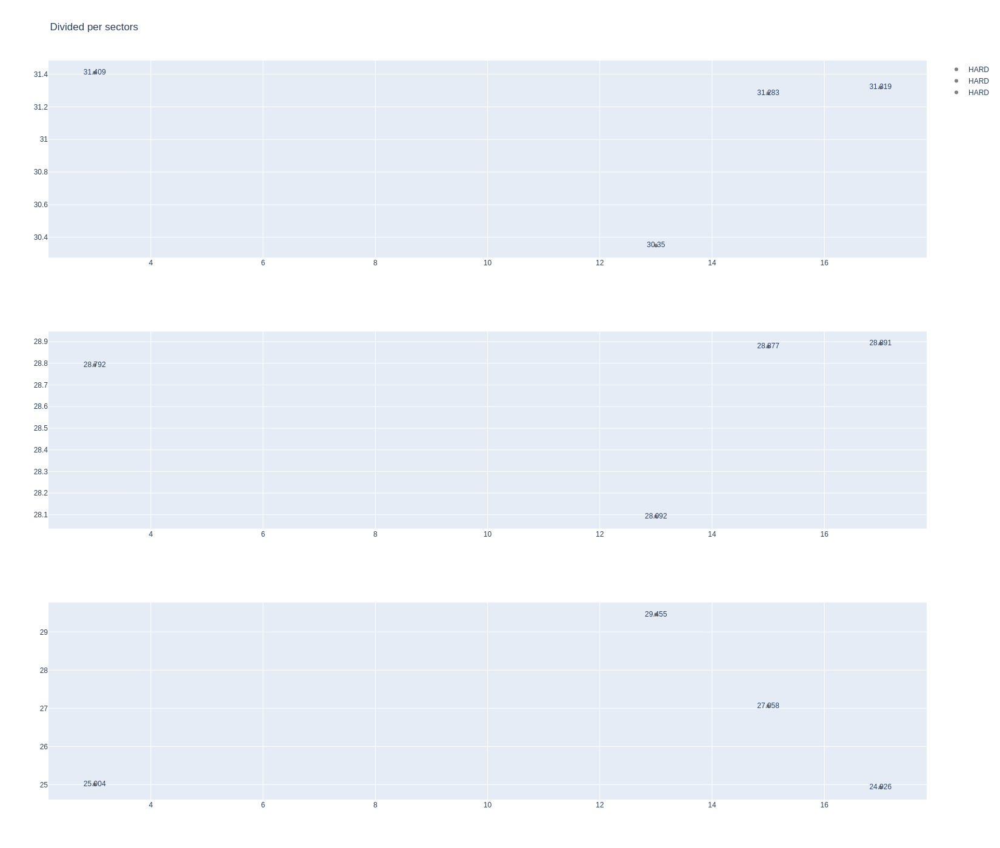

In [79]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [80]:
data= libraryDataF1.getinfolongruns(jointables2,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
28,Carlos SAINZ,HARD,2025-11-28T13:32:54.168000+00:00,2,31.625,29.291,27.046,87.962
208,Carlos SAINZ,HARD,2025-11-28T13:52:46.396000+00:00,13,30.343,28.199,29.420,87.962


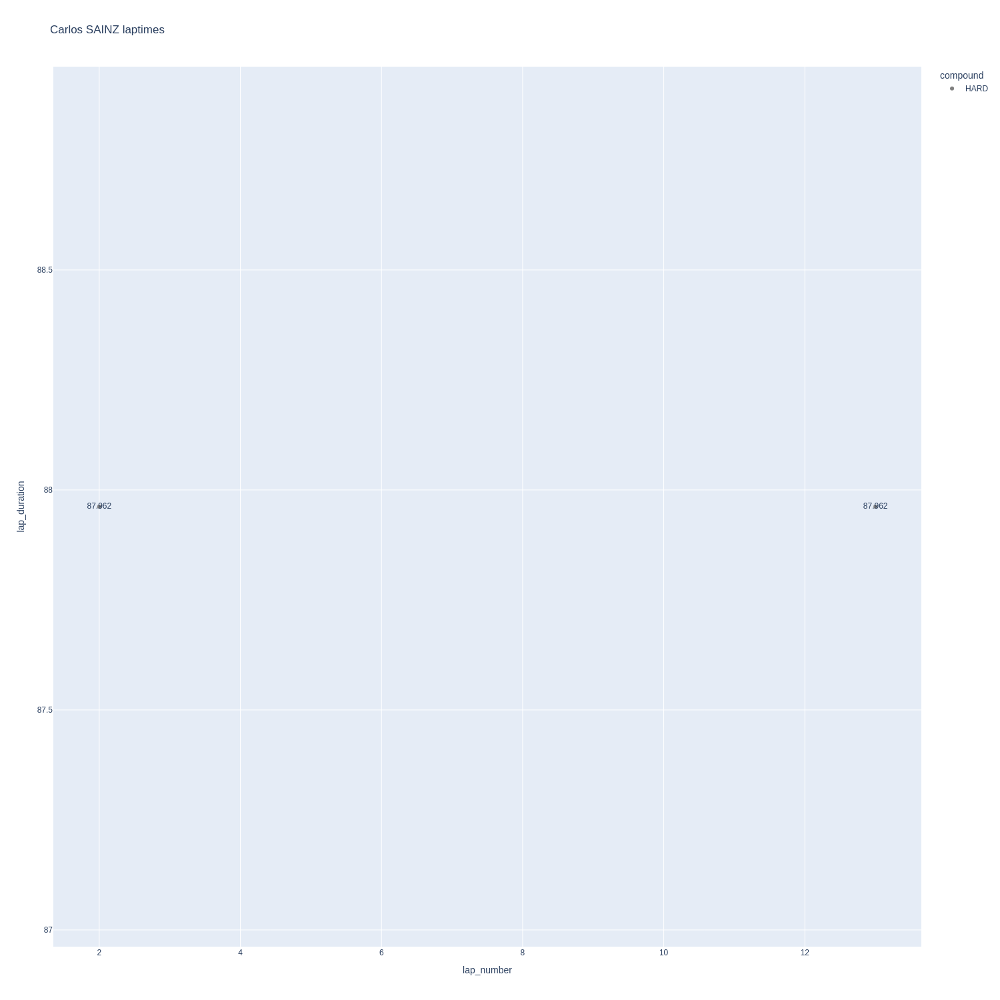

In [81]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

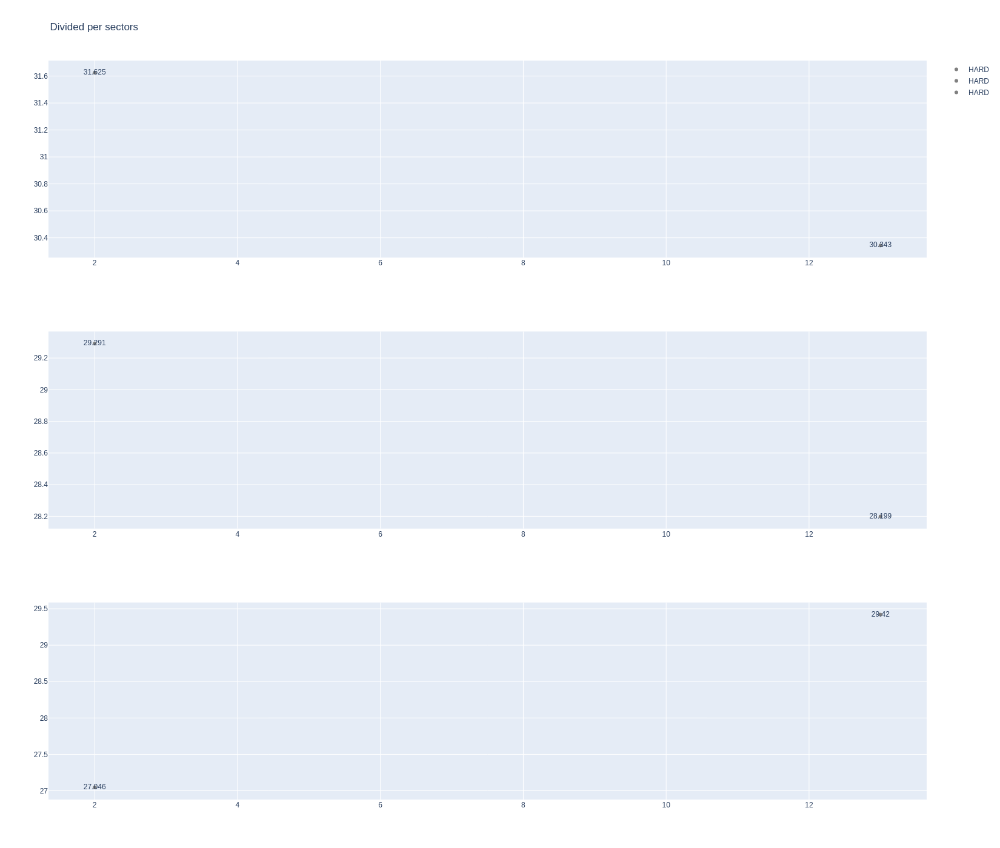

In [82]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [83]:
stintInformation.query('driver_number == 27 or driver_number == 5')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1275,9840,1,5,1,5,HARD,0
12,1275,9840,1,27,1,8,HARD,0
18,1275,9840,2,5,6,11,HARD,0
29,1275,9840,2,27,9,15,HARD,8
49,1275,9840,3,27,16,18,HARD,15
51,1275,9840,3,5,12,22,HARD,11
58,1275,9840,4,5,23,25,SOFT,0
59,1275,9840,4,27,19,23,SOFT,0
74,1275,9840,5,5,26,29,SOFT,3


In [84]:
data = libraryDataF1.getinfolongruns(jointables2,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
16,Nico HULKENBERG,HARD,2025-11-28T13:31:41.920000+00:00,2,31.975,29.132,25.416,86.523
284,Nico HULKENBERG,HARD,2025-11-28T14:02:34.589000+00:00,14,31.431,28.591,25.037,85.059
486,Nico HULKENBERG,SOFT,2025-11-28T14:26:40.489000+00:00,22,29.785,27.686,28.336,85.807


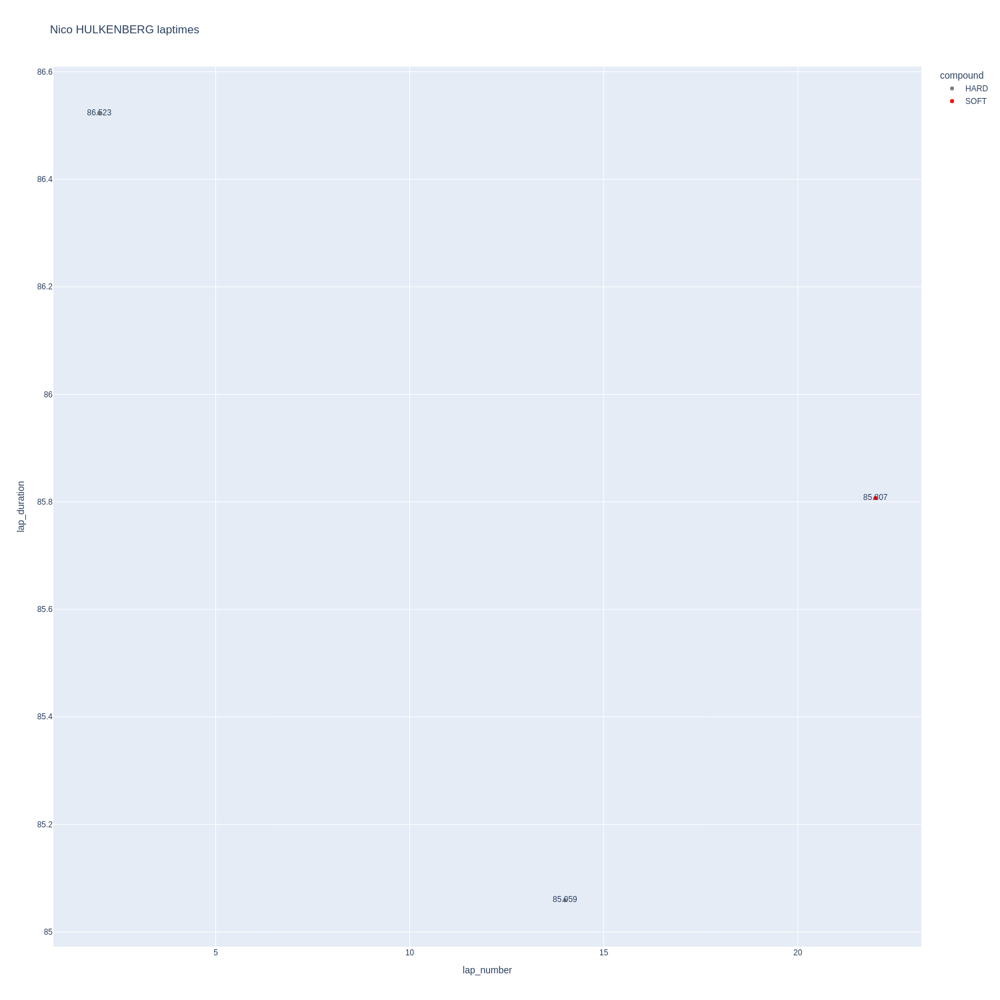

In [85]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

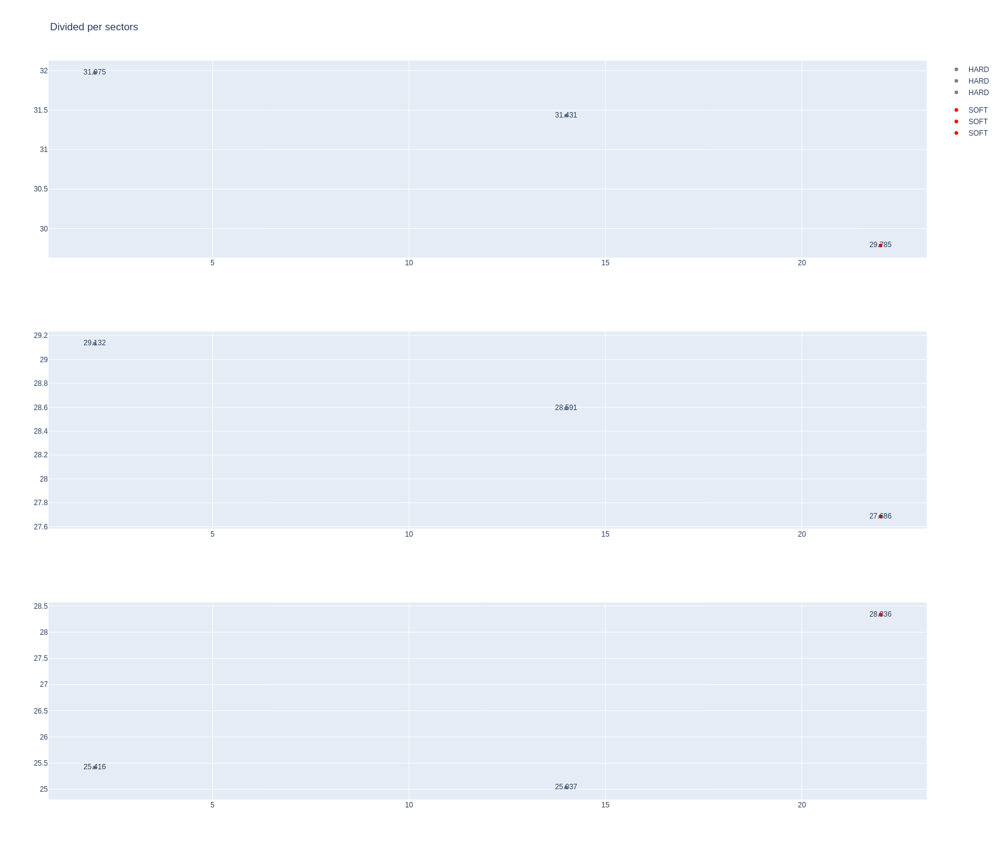

In [86]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [87]:
data = libraryDataF1.getinfolongruns(jointables2,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
59,Gabriel BORTOLETO,HARD,2025-11-28T13:35:11.490000+00:00,3,31.561,29.073,25.649,86.283
330,Gabriel BORTOLETO,HARD,2025-11-28T14:06:27.450000+00:00,17,31.681,29.200,25.560,86.441
346,Gabriel BORTOLETO,HARD,2025-11-28T14:07:53.841000+00:00,18,31.638,28.962,25.399,85.999
360,Gabriel BORTOLETO,HARD,2025-11-28T14:09:19.790000+00:00,19,31.564,28.842,25.253,85.659
371,Gabriel BORTOLETO,HARD,2025-11-28T14:10:46.306000+00:00,20,31.490,28.760,25.079,85.329
380,Gabriel BORTOLETO,HARD,2025-11-28T14:12:10.865000+00:00,21,31.326,28.864,25.087,85.277


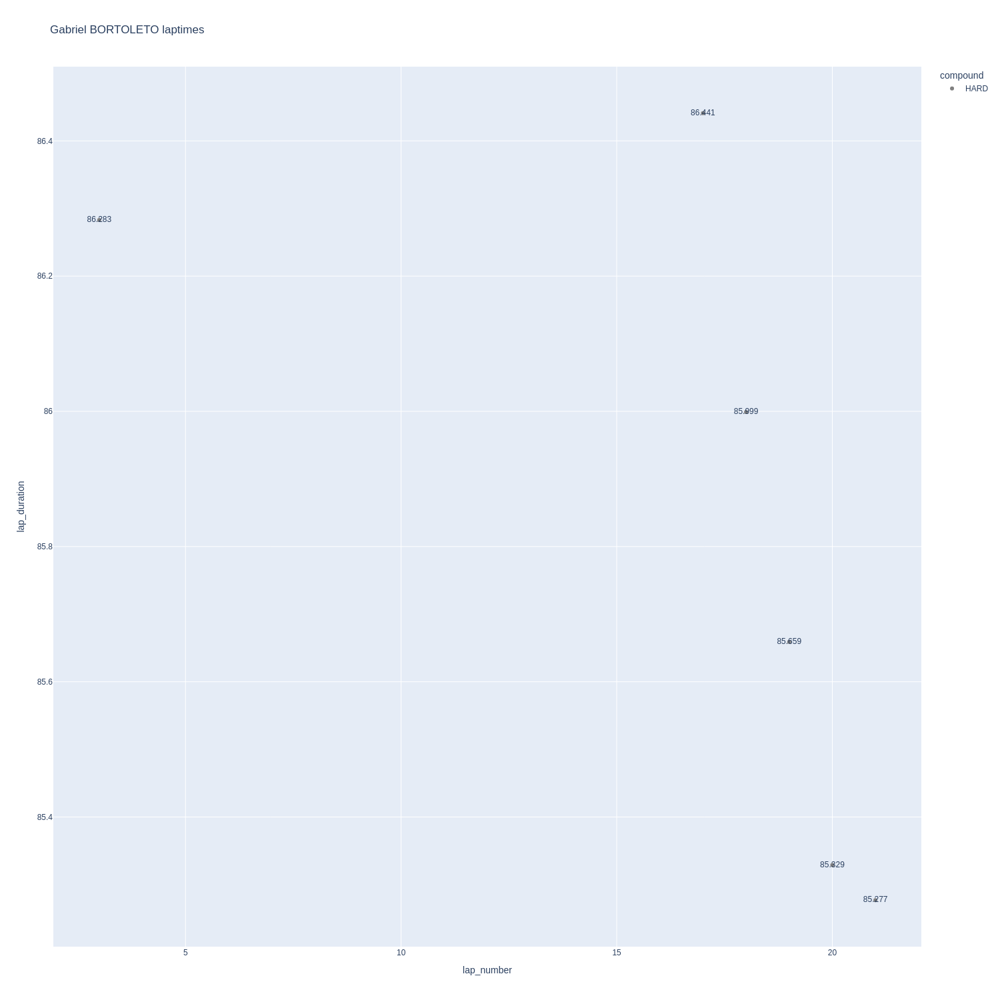

In [88]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

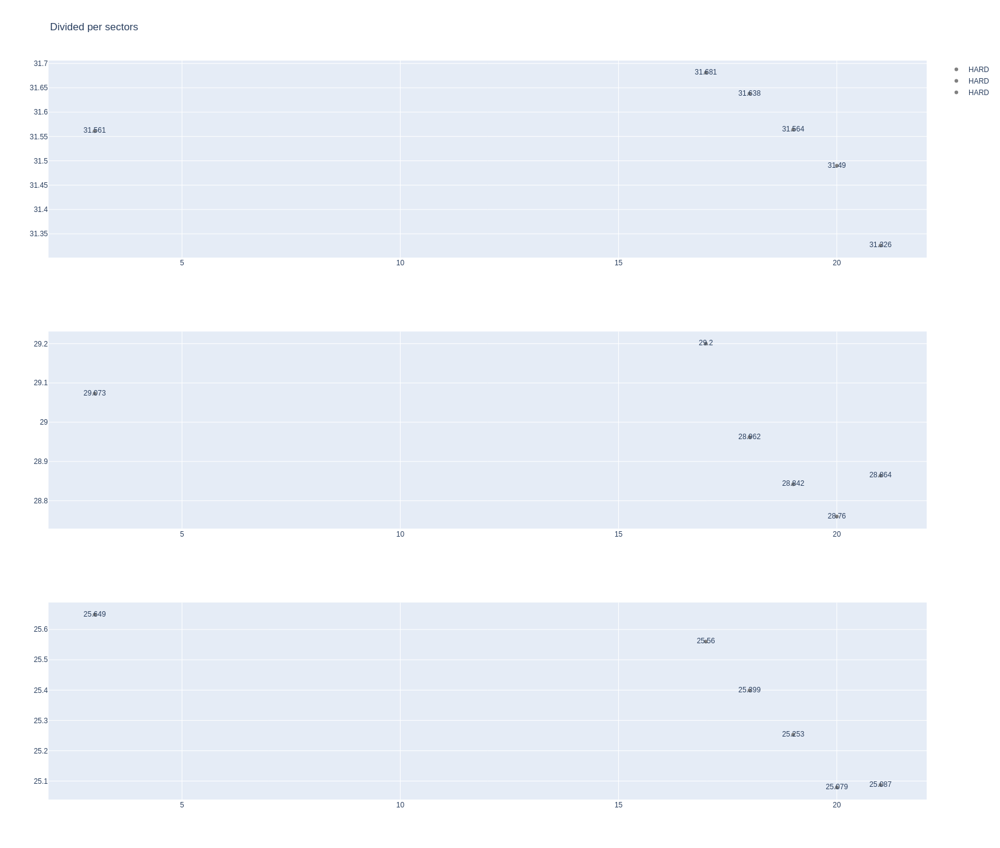

In [89]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Long runs mean for each driver

In [90]:
longrun_data = libraryDataF1.obtainLongRunData(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Sorted by lap duration

In [91]:
sorted_laps = pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3'])

In [92]:
sorted_laps.sort_values(by='lap_duration',ascending=True)

,driver,compound,lap_duration,sector1,sector2,sector3
18,Oscar PIASTRI,HARD,85.162667,31.150333,29.234333,24.778000
4,Pierre GASLY,HARD,85.224667,31.471000,29.030667,24.723000
8,Lance STROLL,HARD,85.384500,31.516000,29.017000,24.851500
6,Fernando ALONSO,HARD,85.386250,31.477000,29.019250,24.890000
1,Lando NORRIS,HARD,85.432000,31.418000,29.132333,24.881667
17,George RUSSELL,HARD,85.530667,31.438333,29.285778,24.806556
7,Charles LECLERC,HARD,85.594000,30.310500,28.940000,26.343500
0,Max VERSTAPPEN,HARD,85.618778,31.458111,29.242111,24.918556
13,Esteban OCON,HARD,85.729900,31.578700,29.064600,25.086600
5,Kimi ANTONELLI,HARD,85.754000,31.464000,29.244400,25.045600


##### Sorted by sector 1

In [93]:
sorted_laps.sort_values(by='sector1',ascending=True)[['driver','compound','sector1']]

,driver,compound,sector1
7,Charles LECLERC,HARD,30.310500
16,Carlos SAINZ,HARD,30.984000
11,Nico HULKENBERG,HARD,31.063667
10,Alexander ALBON,HARD,31.090250
18,Oscar PIASTRI,HARD,31.150333
1,Lando NORRIS,HARD,31.418000
17,George RUSSELL,HARD,31.438333
0,Max VERSTAPPEN,HARD,31.458111
5,Kimi ANTONELLI,HARD,31.464000
4,Pierre GASLY,HARD,31.471000


##### Sorted by sector 2

In [94]:
sorted_laps.sort_values(by='sector2',ascending=True)[['driver','compound','sector2']]

,driver,compound,sector2
11,Nico HULKENBERG,HARD,28.469667
10,Alexander ALBON,HARD,28.663000
16,Carlos SAINZ,HARD,28.745000
7,Charles LECLERC,HARD,28.940000
2,Gabriel BORTOLETO,HARD,28.950167
8,Lance STROLL,HARD,29.017000
6,Fernando ALONSO,HARD,29.019250
4,Pierre GASLY,HARD,29.030667
13,Esteban OCON,HARD,29.064600
1,Lando NORRIS,HARD,29.132333


##### Sorted by sector 3

In [95]:
sorted_laps.sort_values(by='sector3',ascending=True)[['driver','compound','sector3']]

,driver,compound,sector3
4,Pierre GASLY,HARD,24.723000
18,Oscar PIASTRI,HARD,24.778000
17,George RUSSELL,HARD,24.806556
8,Lance STROLL,HARD,24.851500
1,Lando NORRIS,HARD,24.881667
6,Fernando ALONSO,HARD,24.890000
0,Max VERSTAPPEN,HARD,24.918556
12,Liam LAWSON,HARD,24.966600
5,Kimi ANTONELLI,HARD,25.045600
19,Oliver BEARMAN,HARD,25.079286


#### Long runs mean

In [96]:
longruns_summary = libraryDataF1.obtainMeanLongRuns(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Mean pace per compound

In [97]:
#libraryDataF1.showDataLongRuns(longruns_summary,"INTERMEDIATE","mean_lap_time",['driver','mean_lap_time'])

In [98]:
libraryDataF1.showDataLongRuns(longruns_summary,"SOFT","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time


In [99]:
libraryDataF1.showDataLongRuns(longruns_summary,"MEDIUM","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time


In [100]:
libraryDataF1.showDataLongRuns(longruns_summary,"HARD","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
18,O PIASTRI,85.163
4,P GASLY,85.225
8,L STROLL,85.384
6,F ALONSO,85.386
1,L NORRIS,85.432
17,G RUSSELL,85.531
7,C LECLERC,85.594
0,M VERSTAPPEN,85.619
13,E OCON,85.730
5,K ANTONELLI,85.754


## Sprint Qualyfing
### Race control
This section has been added in order to know which laps has been deleted and knowing what happened on track during this session as well.

In [3]:
libraryDataF1.obtain_information('race_control',session_key=9841)

,meeting_key,session_key,date,driver_number,lap_number,category,flag,scope,sector,message
0,1275,9841,2025-11-28T17:30:00+00:00,None,None,Flag,GREEN,Track,None,GREEN LIGHT - PIT EXIT OPEN
1,1275,9841,2025-11-28T17:42:00+00:00,None,None,Flag,CHEQUERED,Track,None,CHEQUERED FLAG
2,1275,9841,2025-11-28T17:42:15+00:00,None,None,Other,None,None,None,FIRST CAR TO TAKE THE FLAG - CAR 44 (HAM)
3,1275,9841,2025-11-28T17:44:03+00:00,None,None,Other,None,None,None,CAR 18 (STR) LAP DELETED - TRACK LIMITS AT TUR...
4,1275,9841,2025-11-28T17:44:32+00:00,None,None,Other,None,None,None,TURN 1 INCIDENT INVOLVING CARS 1 (VER) AND 4 (...
5,1275,9841,2025-11-28T17:45:28+00:00,None,None,Other,None,None,None,TURN 16 INCIDENT INVOLVING CARS 4 (NOR) AND 1 ...
6,1275,9841,2025-11-28T17:47:27+00:00,None,None,Other,None,None,None,FIA STEWARDS: SQ1 INCIDENT INVOLVING CARS 10 (...
7,1275,9841,2025-11-28T17:48:46+00:00,None,None,Other,None,None,None,FIA STEWARDS: TURN 16 INCIDENT INVOLVING CARS ...
8,1275,9841,2025-11-28T17:49:00+00:00,None,None,Flag,GREEN,Track,None,GREEN LIGHT - PIT EXIT OPEN
9,1275,9841,2025-11-28T17:50:38+00:00,None,None,Other,None,None,None,FIA STEWARDS: SQ1 - TURN 1 INCIDENT INVOLVING ...


### Obtain setup

In [4]:
qualyfing = libraryDataF1.obtain_information('laps',session_key=9841)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9841)
drivers = libraryDataF1.obtain_information('drivers',session_key=9841)
libraryDataF1.obtain_drivers_colours(drivers)

In race control dataset, I can see a lot of laptimes deleted, principally for track limits. Those laps deleted ,within the 107%, were deleted from dataset in order to obtain only the valid laps for the analysis.

In [7]:
laptimes_deleted = [81.980,81.277]
driver_number_lap_deleted = [27,6]

for ltime_deleted, dn_time_deleted in zip(laptimes_deleted,driver_number_lap_deleted):
    try:
        id_deleted = qualyfing.query("driver_number == @dn_time_deleted and lap_duration == @ltime_deleted").index[0]
        qualyfing = qualyfing.drop(id_deleted)
    except:
        print("Laptime deleted associated with the selected driver does not exist. Please, check again the order of the arrays")

Laptime deleted associated with the selected driver does not exist. Please, check again the order of the arrays


In [12]:
bestlap = qualyfing.loc[qualyfing.groupby(['driver_number'])['lap_duration'].idxmin()].sort_values(by=['lap_duration'],ascending=True)


The fastest lap is 80.055 seconds (1.20.055= so that to obtain the competitve laps the fastest lap will be multiplied by 1.07 (86.68 seconds) due to, according to the rules all the drivers have to do unless one lap within this gap.

In [13]:
allowedlaps = 80.055*1.07
competitiveLaps = qualyfing.query("is_pit_out_lap == False and lap_duration < @allowedlaps")

In [14]:
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()

#### Best lap per driver compared with the best lap of the session

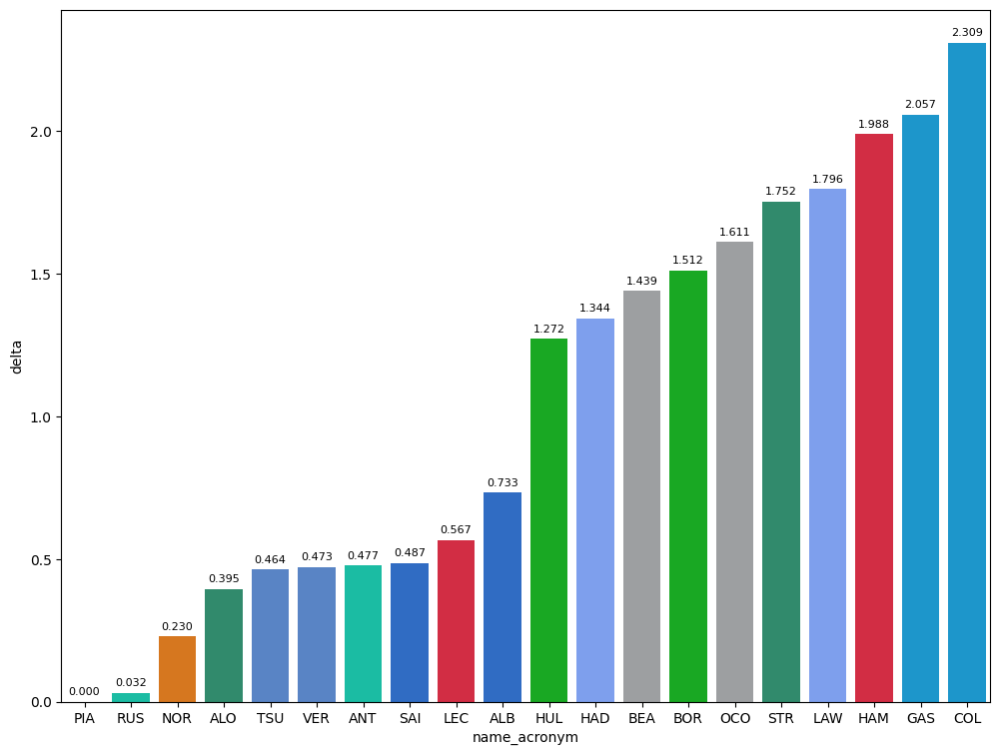

In [15]:
libraryDataF1.obtainchart("name_acronym","delta",jointables.sort_values(by=['fastest_lap'],ascending=True))

In [16]:
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])

In [17]:
# In order to know when each session finished, race control dataset will be consulted.
maximumDateQ1 = "date_start <'2025-11-28T17:49:00+00:00'"
maximumDateQ2 = "date_start <'2025-11-28T18:06:00+00:00' and date_start >='2025-11-28T17:49:00+00:00'"
maximumDateQ3 = "date_start >'2025-11-28T18:06:00+00:00'"

### Speed trap

#### Maximum speed per drivers

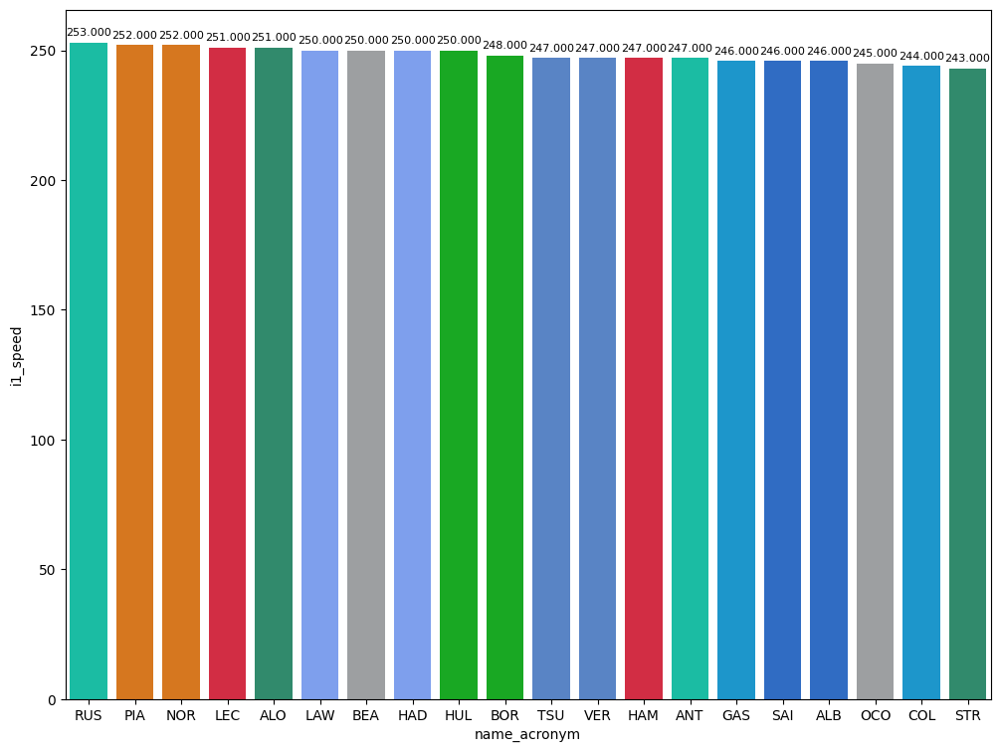

In [18]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

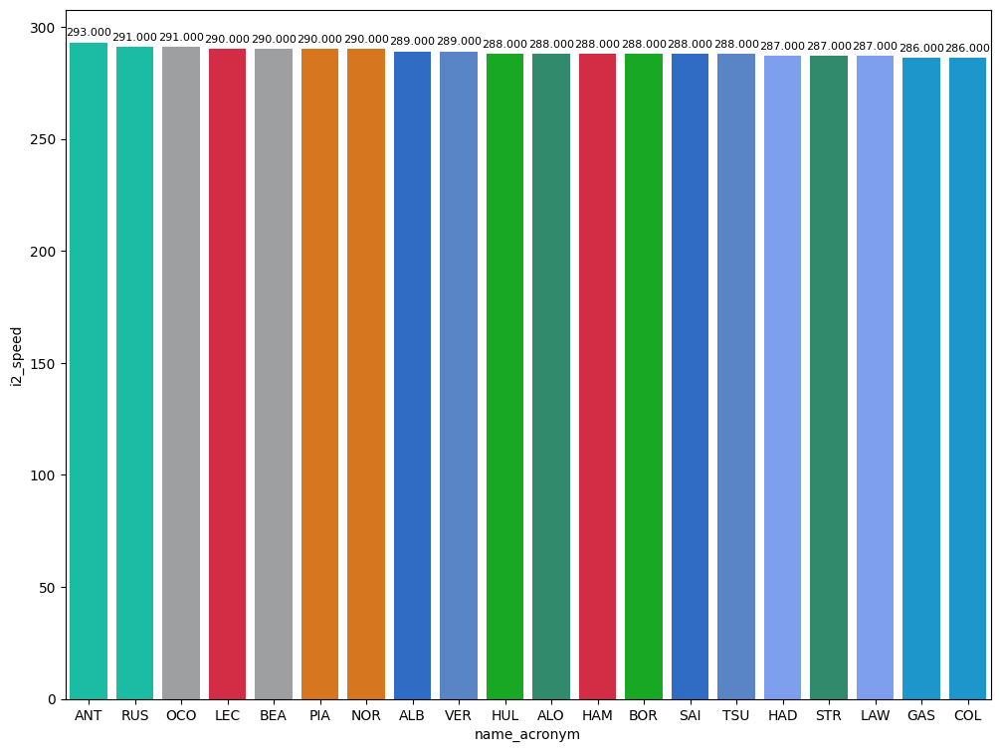

In [19]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

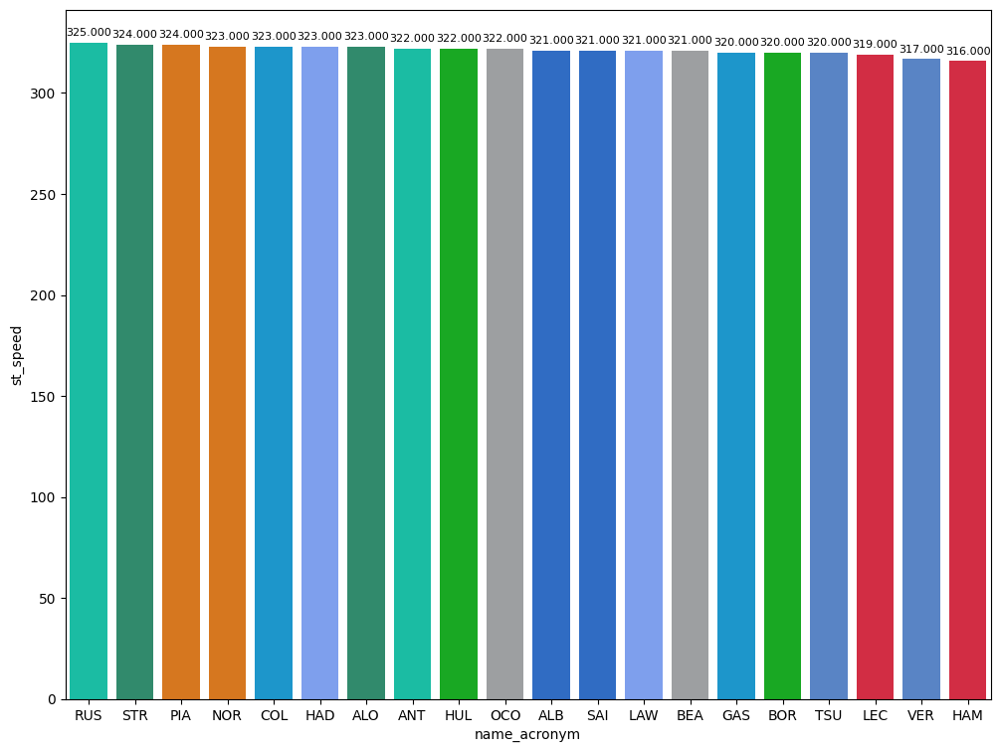

In [20]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

### Sprint Qualyfing 1

In [21]:
q1Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [22]:
#Reference
P15 = q1Data[14:15]

In [23]:
print(
"Driver:",P15.full_name.to_string(index=False),
"Sector 1: ",P15.duration_sector_1.to_string(index=False),
"Sector 2: ",P15.duration_sector_2.to_string(index=False),
"Sector 3: ",P15.duration_sector_3.to_string(index=False)
)

Driver: Esteban OCON Sector 1:  30.096 Sector 2:  27.551 Sector 3:  24.126


In [24]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[15::].iterrows():
    newdataset2 =  libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,18,0.034,0.064,0.113,-0.143,STR
1,30,0.078,0.068,0.094,-0.084,LAW
2,44,0.270,0.097,0.092,0.081,HAM
3,10,0.339,0.348,0.165,-0.174,GAS
4,43,0.591,0.110,0.460,0.021,COL


#### Best sector per driver

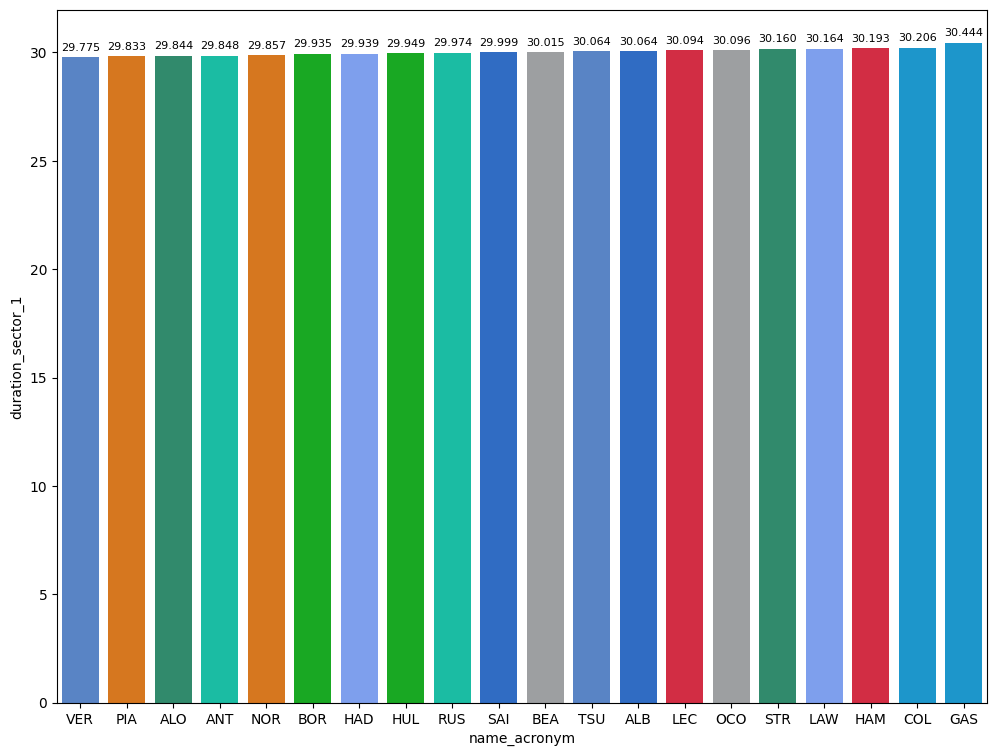

In [25]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

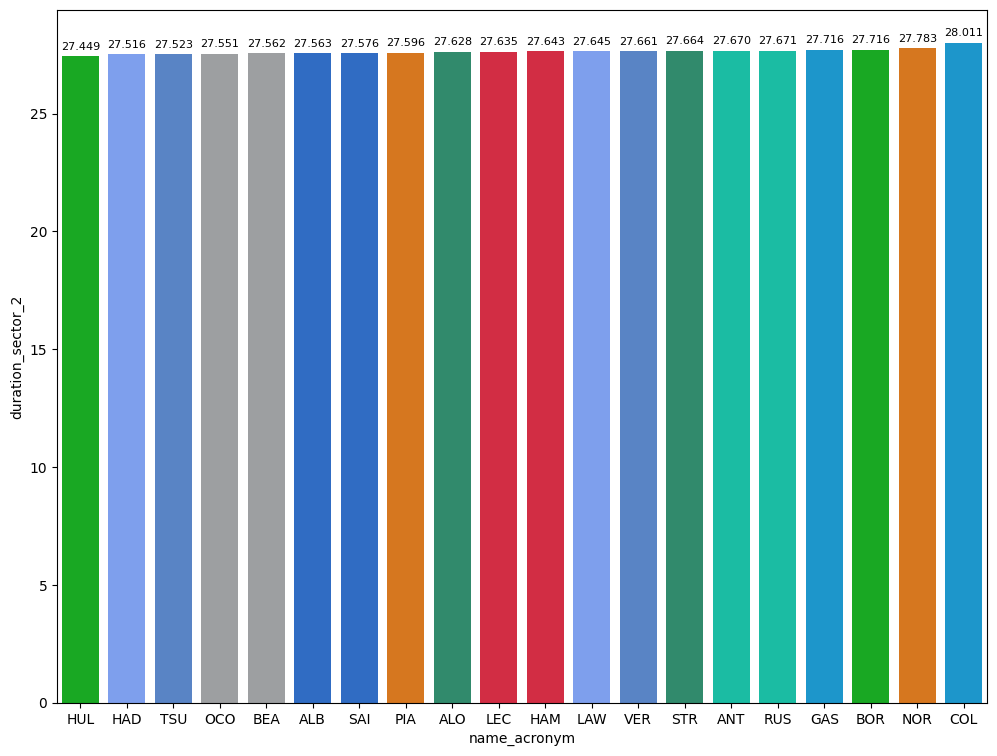

In [26]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

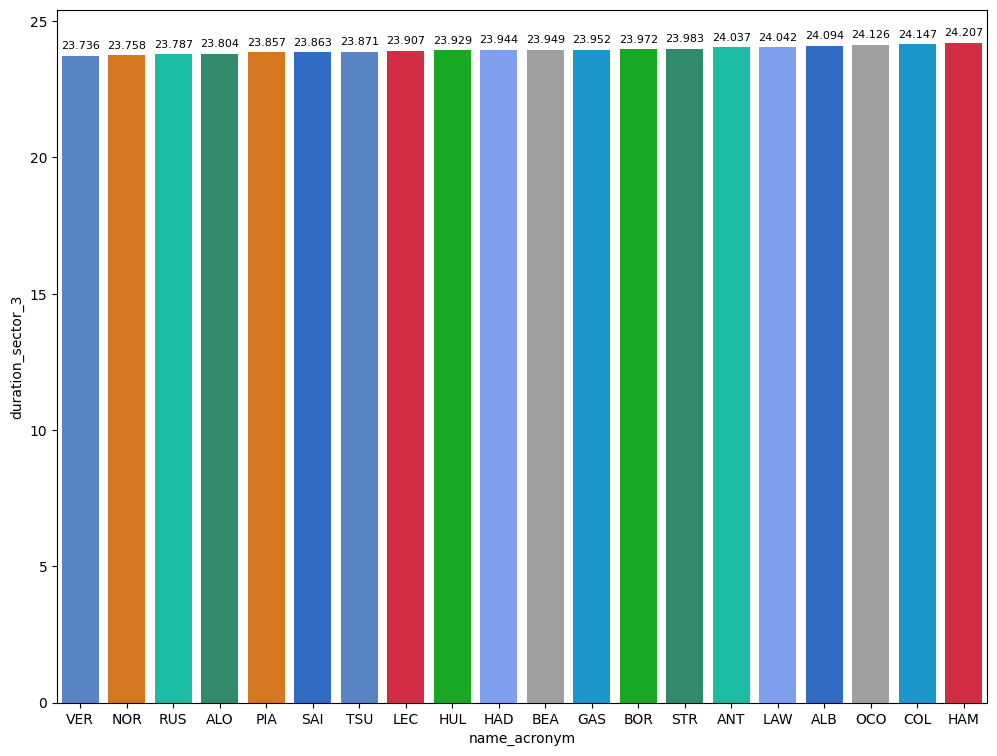

In [27]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

### Sprint Qualyfing 2

In [28]:
q2Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [29]:
#Reference
P10 = q2Data[9:10]
print(
"Driver:",P10.full_name.to_string(index=False),
"Sector 1: ",P10.duration_sector_1.to_string(index=False),
"Sector 2: ",P10.duration_sector_2.to_string(index=False),
"Sector 3: ",P10.duration_sector_3.to_string(index=False)
)

Driver: Kimi ANTONELLI Sector 1:  29.882 Sector 2:  27.554 Sector 3:  23.94


In [30]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[10::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,6,0.057,0.129,-0.054,-0.018,HAD
1,87,0.118,-0.048,0.029,0.137,BEA
2,5,0.191,0.051,0.029,0.111,BOR
3,27,0.255,0.138,0.061,0.056,HUL
4,31,0.290,0.102,0.028,0.160,OCO


#### Best sector per driver

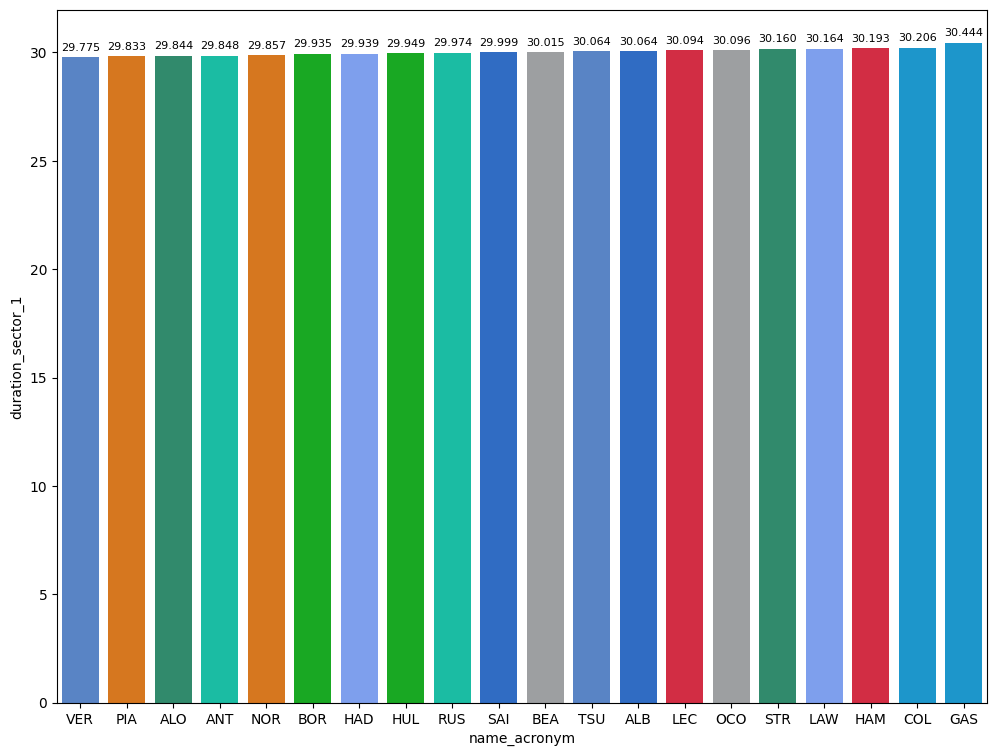

In [31]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

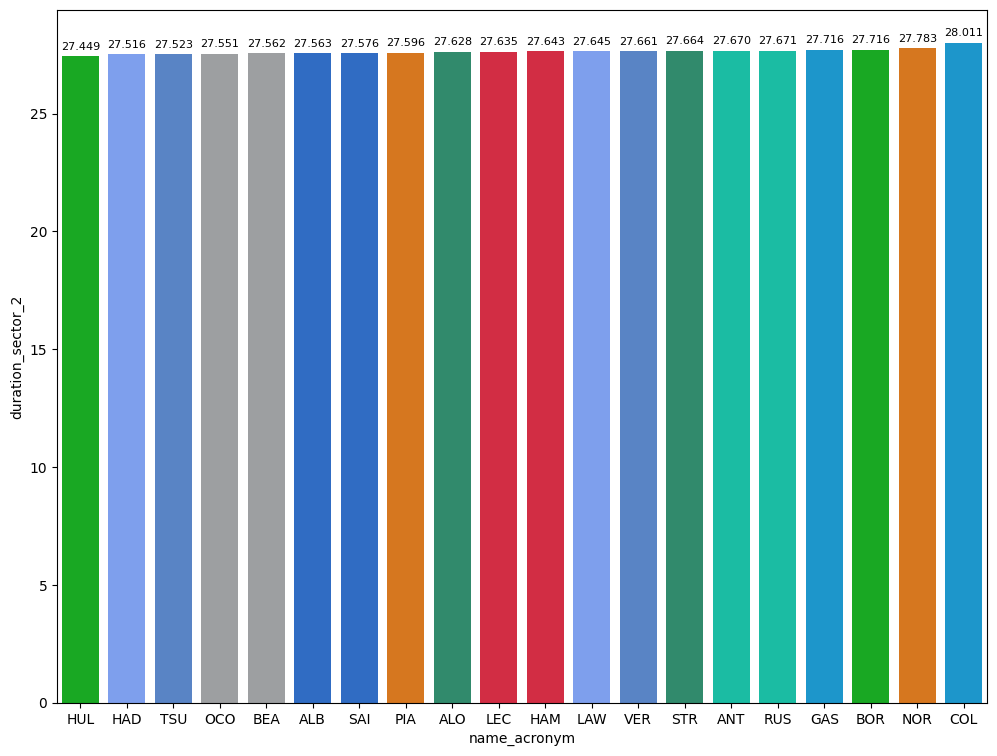

In [32]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

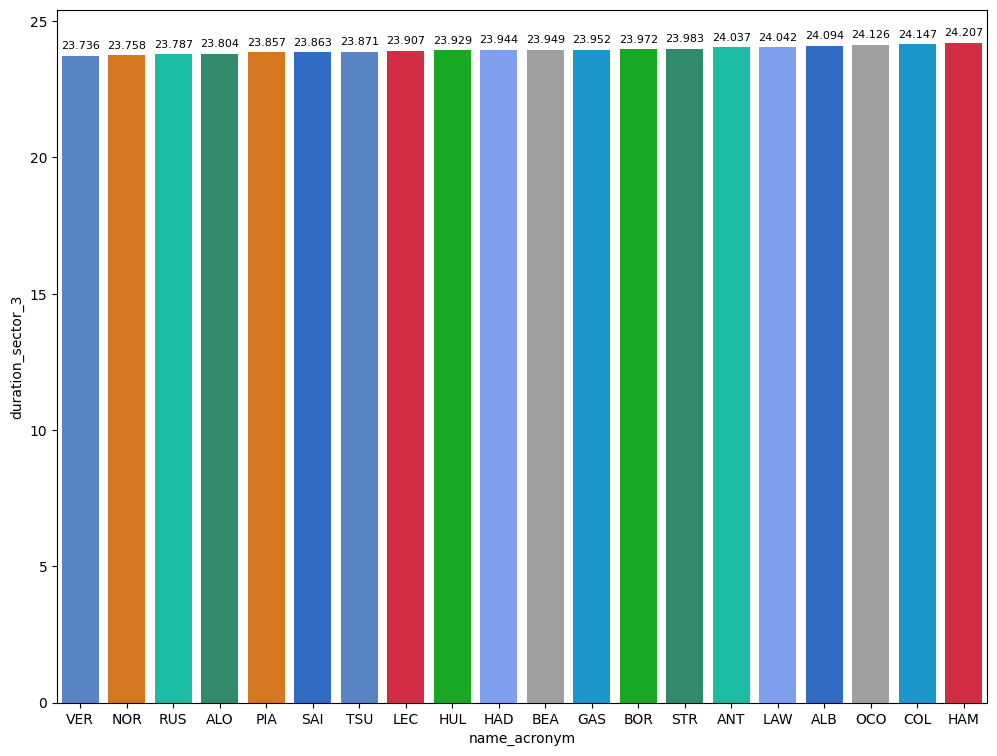

In [33]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

### Sprint Qualyfing 3

In [34]:
q3Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

In [35]:
#Reference
P1 = q3Data[:1]
print(
"Driver:",P1.full_name.to_string(index=False),
"Sector 1: ",P1.duration_sector_1.to_string(index=False),
"Sector 2: ",P1.duration_sector_2.to_string(index=False),
"Sector 3: ",P1.duration_sector_3.to_string(index=False)
)

Driver: Oscar PIASTRI Sector 1:  29.558 Sector 2:  27.074 Sector 3:  23.423


##### Comparaison with poleman
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [36]:
newdataset2 = pd.DataFrame()
for index,row in q3Data[1::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P1,newdataset2)
newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,63,0.032,-0.155,0.067,0.120,RUS
1,4,0.230,-0.106,0.263,0.073,NOR
2,14,0.395,-0.032,0.245,0.182,ALO
3,22,0.464,0.064,0.157,0.243,TSU
4,1,0.473,0.111,0.218,0.144,VER
5,12,0.477,-0.007,0.182,0.302,ANT
6,55,0.487,0.126,0.175,0.186,SAI
7,16,0.567,0.210,0.126,0.231,LEC
8,23,0.733,0.173,0.267,0.293,ALB


#### Best sector per driver

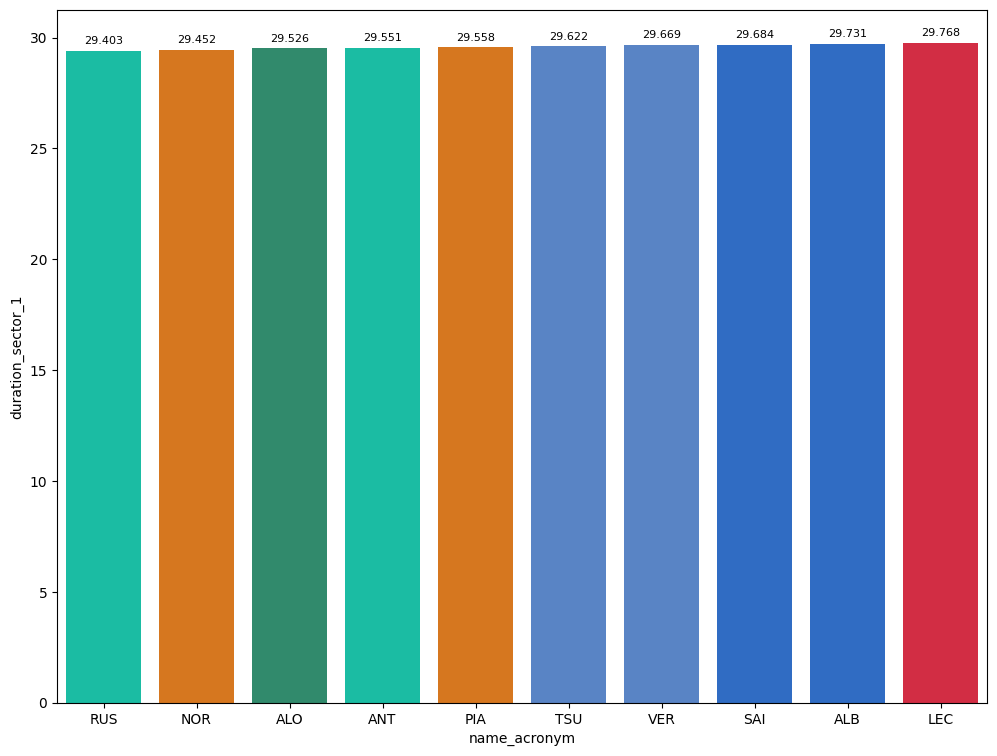

In [37]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q3Data.sort_values(by=['duration_sector_1'],ascending=True))

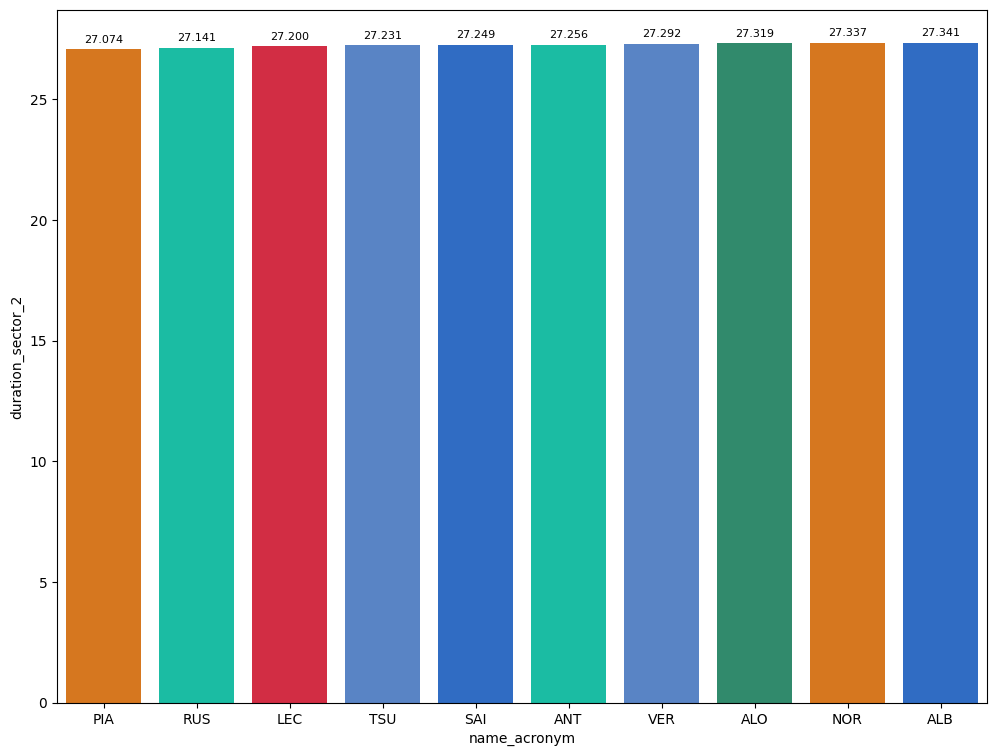

In [38]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q3Data.sort_values(by=['duration_sector_2'],ascending=True))

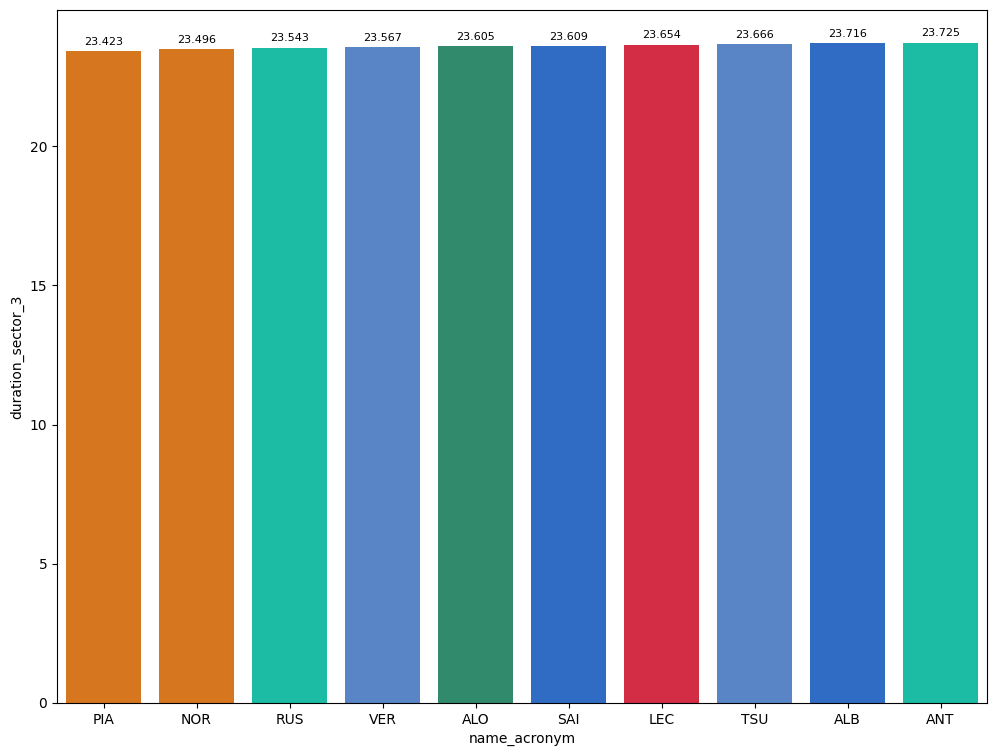

In [39]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q3Data.sort_values(by=['duration_sector_3'],ascending=True))

### Best sector in the session

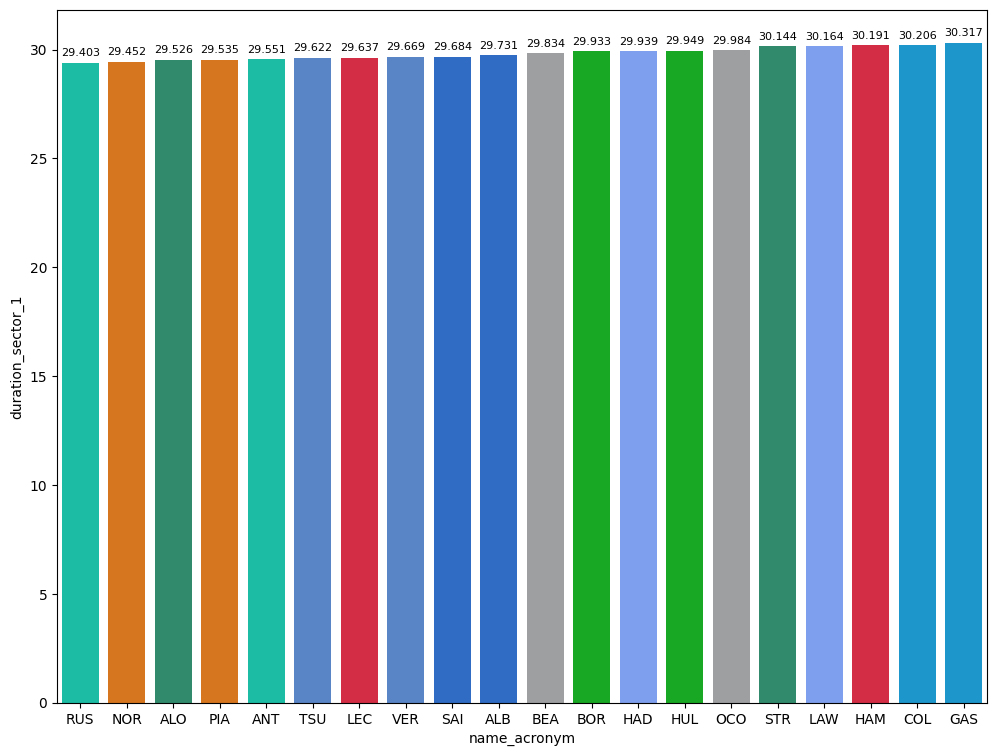

In [40]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_1'].min().sort_values(ascending=True)).reset_index())

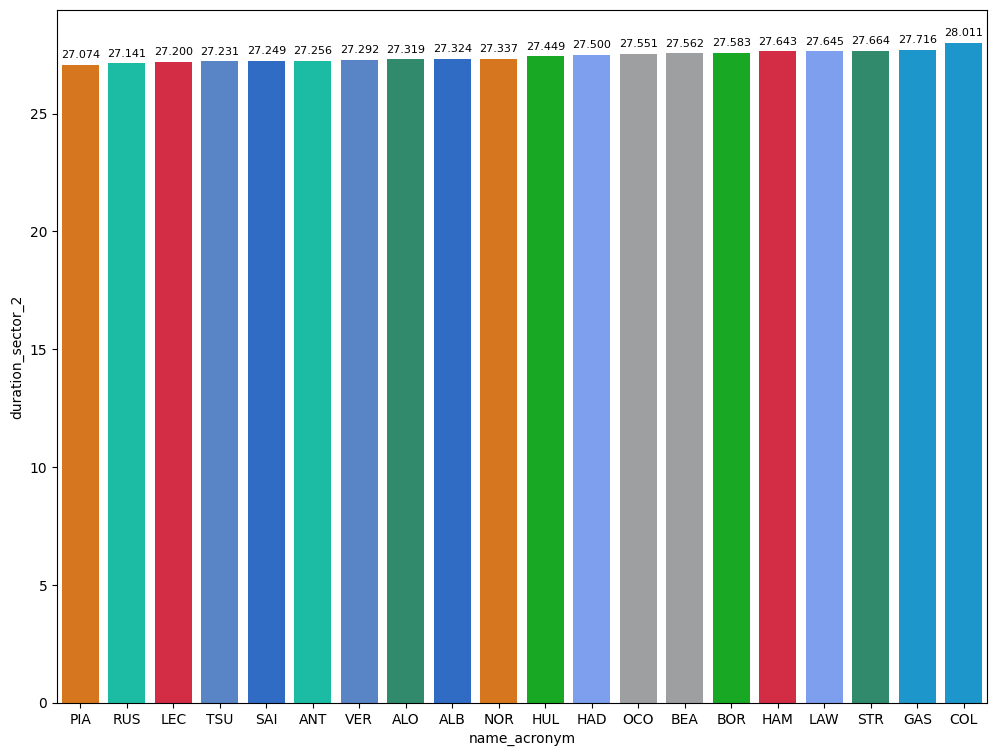

In [41]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_2'].min().sort_values(ascending=True)).reset_index())

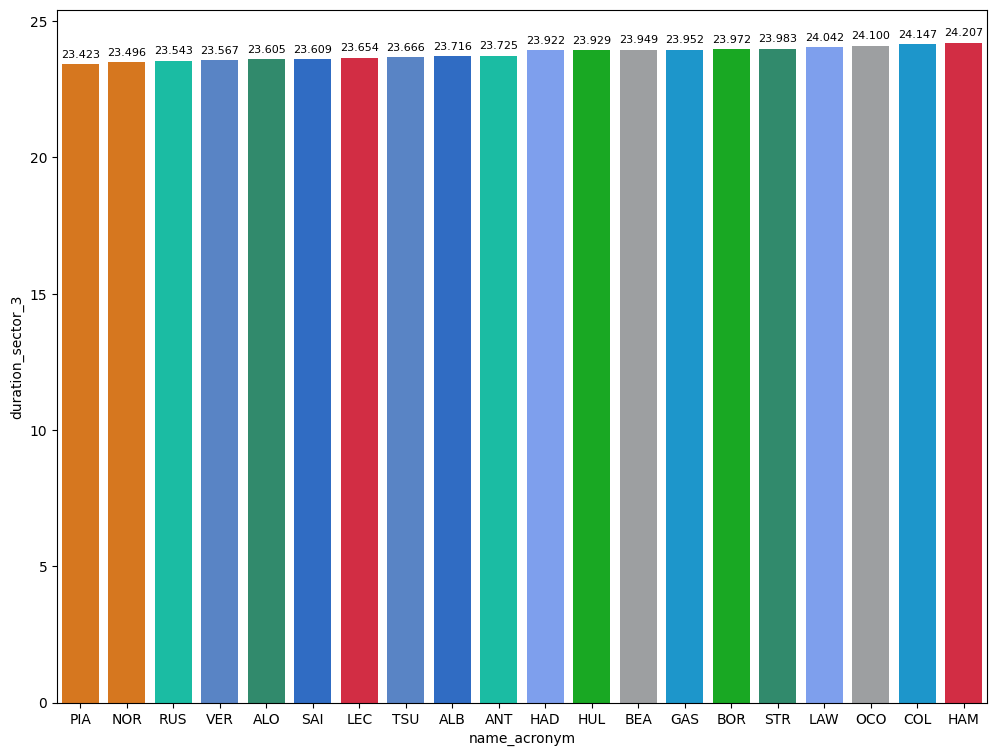

In [42]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_3'].min().sort_values(ascending=True)).reset_index())

## Predictions

In [ ]:
# Free Practice 1
practice = libraryDataF1.obtain_information('laps',session_key=9650)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9650)
drivers = libraryDataF1.obtain_information('drivers',session_key=9650)

stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointablesfreepractice1 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])

# Free Practice 2
# practice = libraryDataF1.obtain_information('laps',session_key=9600)
# stintInformation = libraryDataF1.obtain_information('stints',session_key=9600)
# drivers = libraryDataF1.obtain_information('drivers',session_key=9600)


# stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
# jointablesfreepractice2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])

# Free Practice 3
# practice = libraryDataF1.obtain_information('laps',session_key=9591)
# stintInformation = libraryDataF1.obtain_information('stints',session_key=9591)
# drivers = libraryDataF1.obtain_information('drivers',session_key=9591)

# stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
# jointablesfreepractice1 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])


### Qualyfing prediction

In [ ]:
qualy_simulation = libraryDataF1.qualyfing_prediction([jointablesfreepractice1,jointablesfreepractice1],drivers,0.05,0.07,0.08)
qualy_simulation.sort_values(by='qualy_lap_time')

### Race prediction

In [ ]:
race_simulation = libraryDataF1.race_prediction(jointablesfreepractice1,drivers,83,89)
race_simulation.groupby('team').mean().sort_values(by='mean_lap_duration')

## Sprint

In [43]:
race = libraryDataF1.obtain_information('laps',session_key=9845)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9845)
drivers = libraryDataF1.obtain_information('drivers',session_key=9845)

In [44]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables = pd.merge(race,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Top speed captured in the speed trap

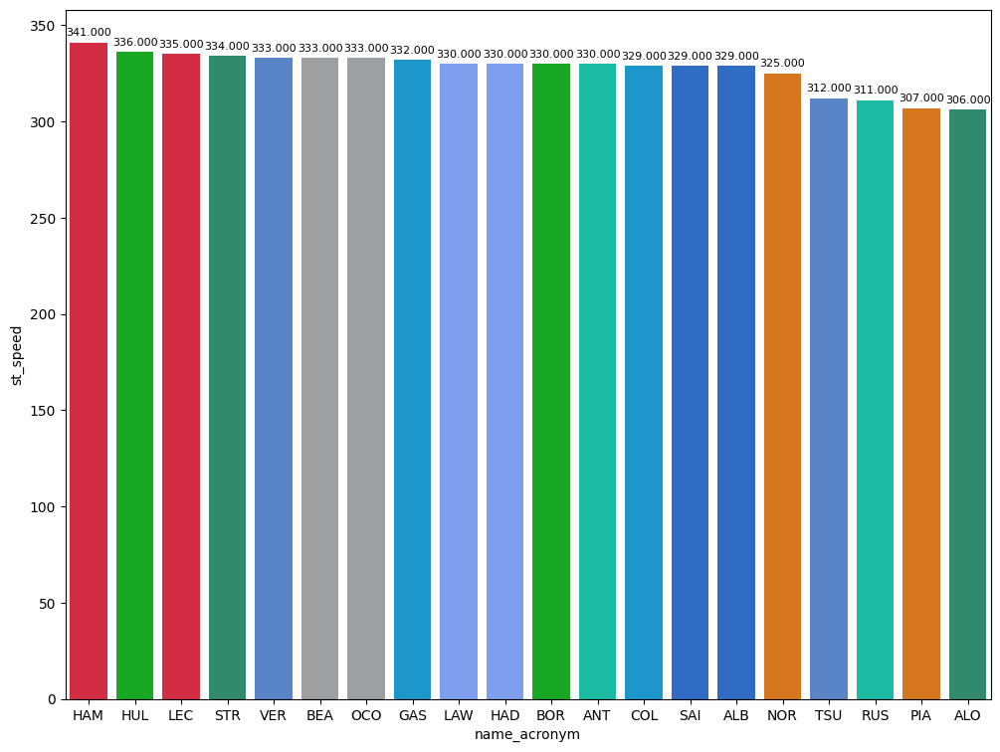

In [45]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

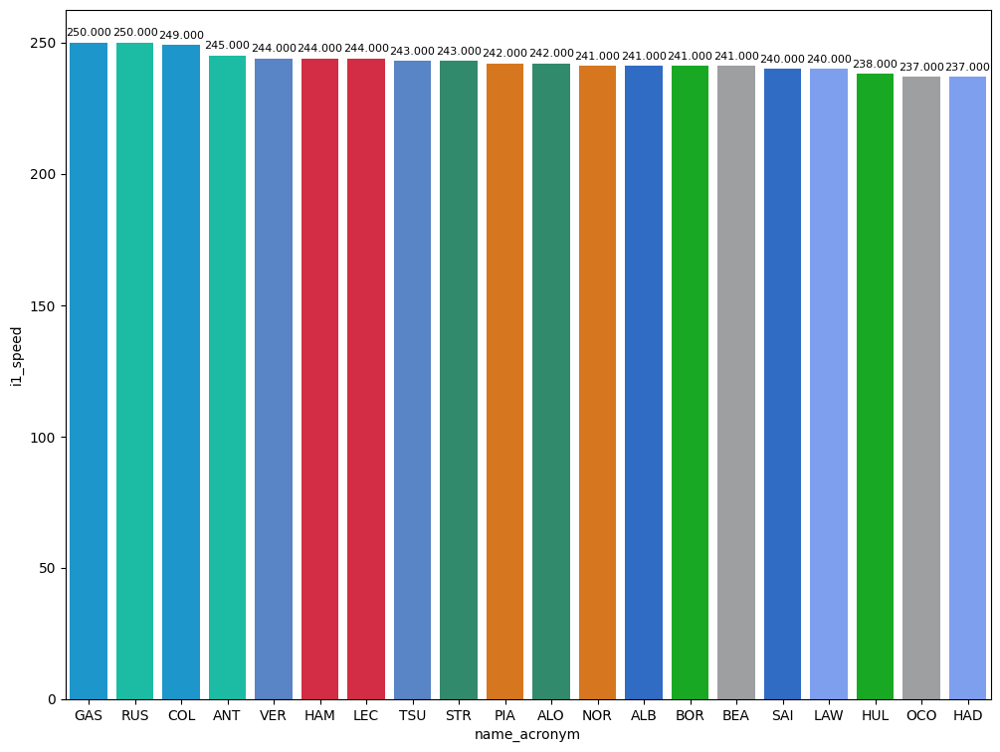

In [46]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

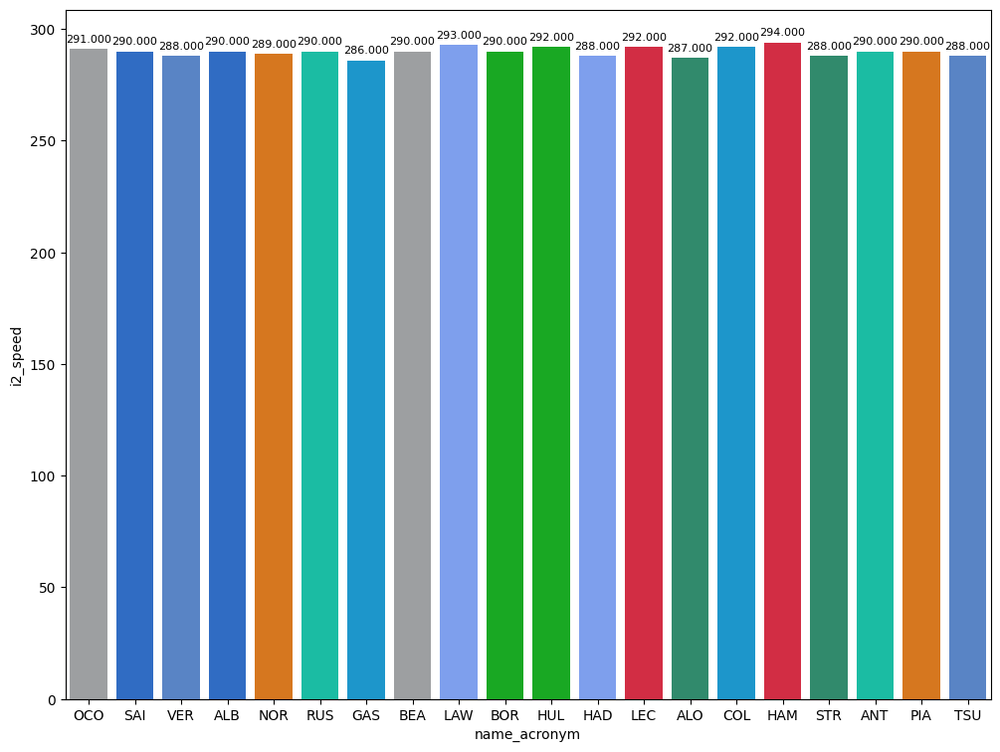

In [47]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

In [49]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <=89").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
team_name,
McLaren,84.897154
Red Bull Racing,85.237409
Mercedes,85.238857
Aston Martin,85.855364
Williams,85.965192
Racing Bulls,86.198000
Kick Sauber,86.242792
Haas F1 Team,86.290286
Ferrari,86.517621


### Race pace per teams

In [50]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <=89").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

,duration_sector_1
team_name,
Mercedes,31.334190
McLaren,31.341846
Red Bull Racing,31.473727
Aston Martin,31.675909
Williams,31.745654
Kick Sauber,31.748625
Haas F1 Team,31.815714
Ferrari,31.854690
Racing Bulls,31.892273


In [51]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <=89").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

,duration_sector_2
team_name,
McLaren,29.009385
Red Bull Racing,29.189364
Mercedes,29.227333
Aston Martin,29.317227
Williams,29.391308
Racing Bulls,29.446182
Kick Sauber,29.492250
Haas F1 Team,29.517857
Alpine,29.603200


In [52]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <=89").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

,duration_sector_3
team_name,
McLaren,24.545923
Red Bull Racing,24.574318
Mercedes,24.677333
Williams,24.828231
Racing Bulls,24.859545
Aston Martin,24.862227
Ferrari,24.936414
Haas F1 Team,24.956714
Alpine,24.995650


#### Mean race pace per sector
In this section, we can see the pace shown per each team in each sector sorted ascending.

##### Sector 1
General explanation

In [56]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

,duration_sector_1
team_name,
Mercedes,31.334190
McLaren,31.341846
Red Bull Racing,31.473727
Aston Martin,31.684391
Williams,31.745654
Kick Sauber,31.748625
Haas F1 Team,31.815714
Ferrari,31.854690
Racing Bulls,31.892273


##### Sector 2
General explanation

In [57]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

,duration_sector_2
team_name,
McLaren,29.009385
Red Bull Racing,29.189364
Mercedes,29.227333
Aston Martin,29.335217
Williams,29.391308
Racing Bulls,29.446182
Kick Sauber,29.492250
Haas F1 Team,29.517857
Alpine,29.661286


##### Sector 3
General explanation

In [58]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

,duration_sector_3
team_name,
McLaren,24.545923
Red Bull Racing,24.574318
Mercedes,24.677333
Williams,24.828231
Racing Bulls,24.859545
Ferrari,24.936414
Haas F1 Team,24.956714
Kick Sauber,25.001917
Aston Martin,25.083739


### Long runs

In [59]:
MINIMUN_SECONDS = 84
MAXIMUM_SECONDS = 87

#### Red Bull Racing

In [60]:
stintInformation.query('driver_number == 1 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1275,9845,1,22,1,1,MEDIUM,6
2,1275,9845,1,1,1,1,MEDIUM,6
15,1275,9845,2,1,2,19,HARD,0
16,1275,9845,2,22,2,19,HARD,0


In [61]:
data = libraryDataF1.getinfolongruns(jointables,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
23,Max VERSTAPPEN,HARD,2025-11-29T14:05:03.770000+00:00,2,31.491,29.106,24.539,85.136
43,Max VERSTAPPEN,HARD,2025-11-29T14:06:28.686000+00:00,3,31.264,29.267,24.528,85.059
63,Max VERSTAPPEN,HARD,2025-11-29T14:07:53.681000+00:00,4,31.245,29.504,24.498,85.247
83,Max VERSTAPPEN,HARD,2025-11-29T14:09:19.065000+00:00,5,31.232,29.346,24.500,85.078
103,Max VERSTAPPEN,HARD,2025-11-29T14:10:44.031000+00:00,6,31.335,29.358,24.531,85.224
123,Max VERSTAPPEN,HARD,2025-11-29T14:12:09.374000+00:00,7,31.371,29.510,24.688,85.569
143,Max VERSTAPPEN,HARD,2025-11-29T14:13:34.787000+00:00,8,31.691,29.331,24.543,85.565
163,Max VERSTAPPEN,HARD,2025-11-29T14:15:00.516000+00:00,9,31.566,29.349,24.516,85.431
183,Max VERSTAPPEN,HARD,2025-11-29T14:16:25.821000+00:00,10,31.741,29.262,24.516,85.519
203,Max VERSTAPPEN,HARD,2025-11-29T14:17:51.418000+00:00,11,31.589,29.216,24.441,85.246


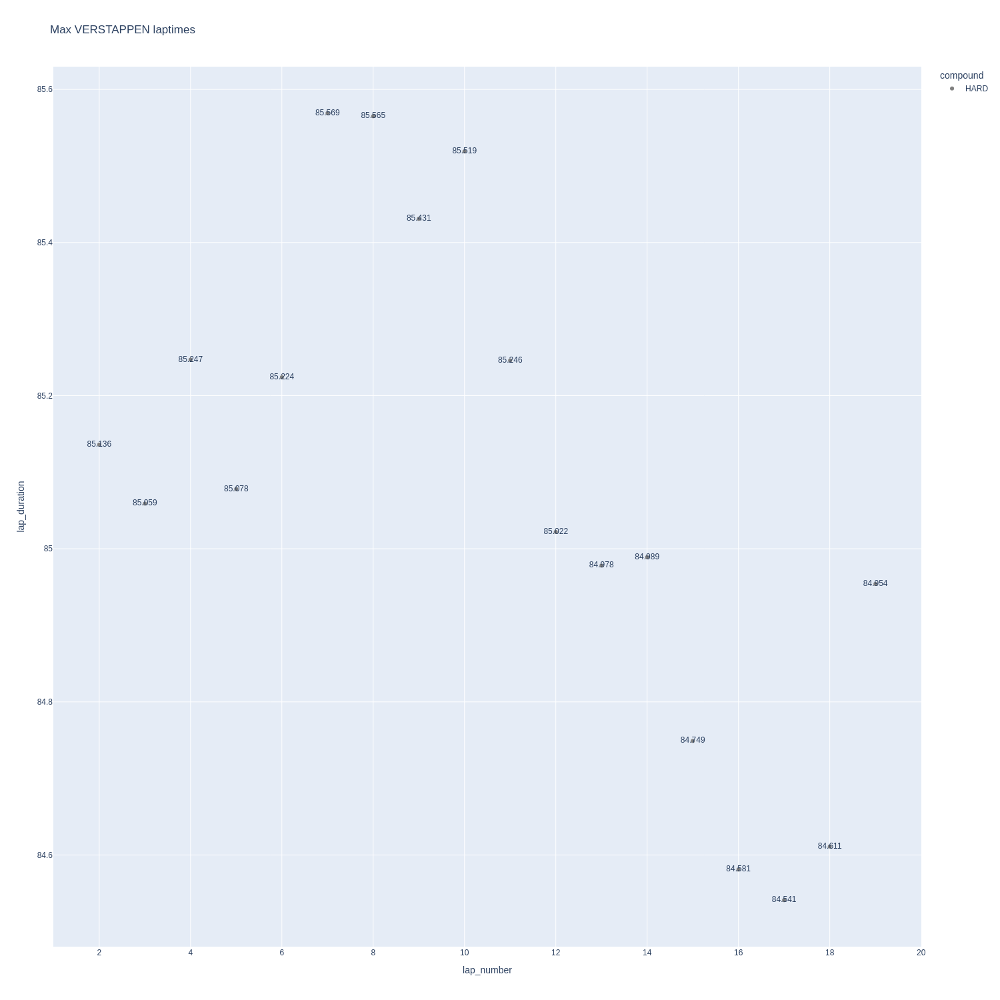

In [62]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

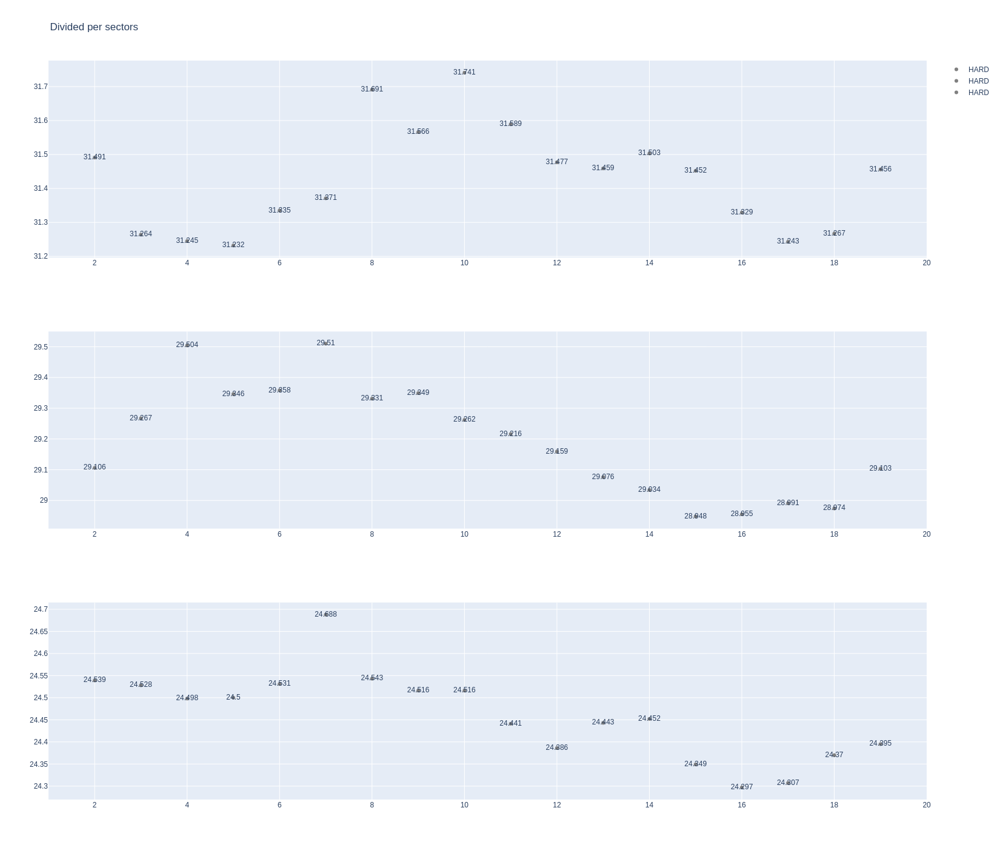

In [63]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [64]:
data = libraryDataF1.getinfolongruns(jointables,22,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
24,Yuki TSUNODA,HARD,2025-11-29T14:05:04.723000+00:00,2,31.647,28.978,24.868,85.493
44,Yuki TSUNODA,HARD,2025-11-29T14:06:30.046000+00:00,3,31.537,29.051,24.556,85.144
64,Yuki TSUNODA,HARD,2025-11-29T14:07:55.219000+00:00,4,31.407,29.089,24.794,85.290
84,Yuki TSUNODA,HARD,2025-11-29T14:09:20.471000+00:00,5,31.223,29.203,24.735,85.161
104,Yuki TSUNODA,HARD,2025-11-29T14:10:45.638000+00:00,6,31.423,29.192,24.646,85.261
124,Yuki TSUNODA,HARD,2025-11-29T14:12:10.953000+00:00,7,31.401,29.344,24.668,85.413
144,Yuki TSUNODA,HARD,2025-11-29T14:13:36.321000+00:00,8,31.541,29.456,24.885,85.882
164,Yuki TSUNODA,HARD,2025-11-29T14:15:02.225000+00:00,9,31.556,29.307,24.827,85.690
184,Yuki TSUNODA,HARD,2025-11-29T14:16:27.946000+00:00,10,31.543,29.318,24.840,85.701
204,Yuki TSUNODA,HARD,2025-11-29T14:17:53.637000+00:00,11,31.697,29.403,24.858,85.958


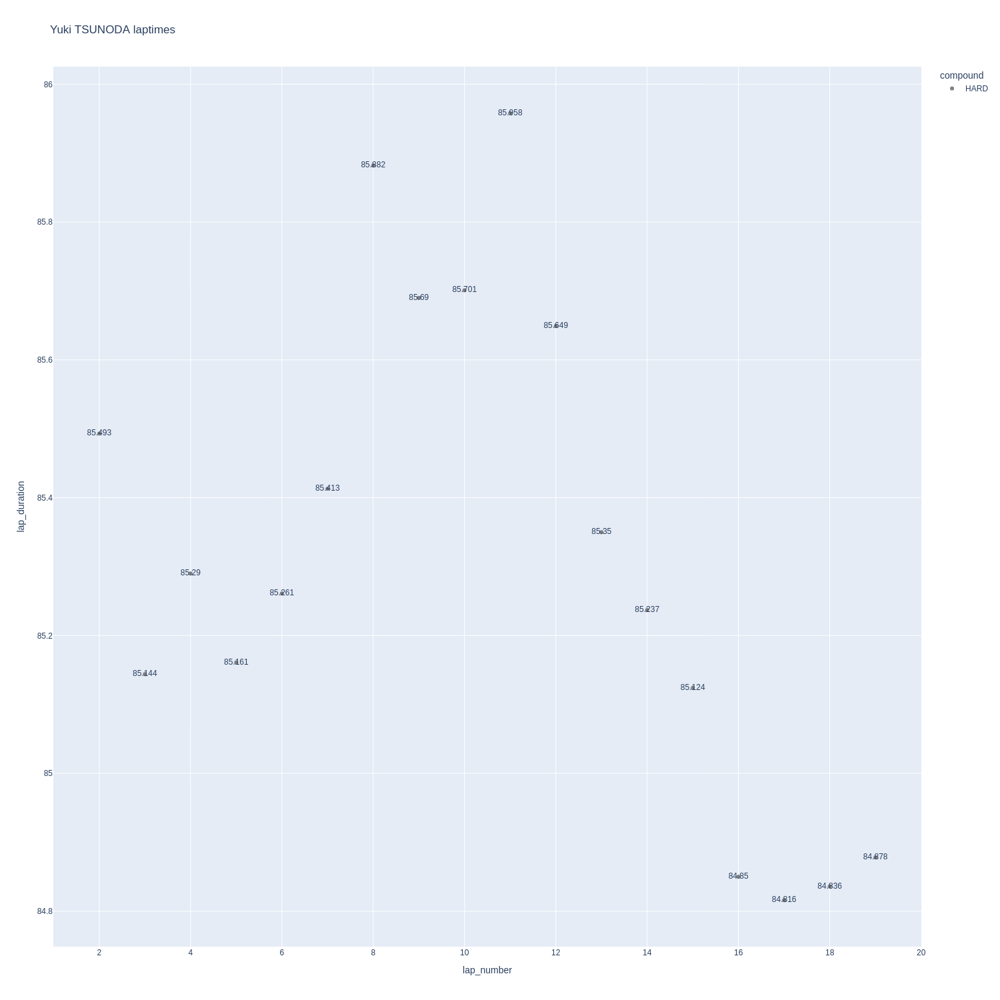

In [65]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

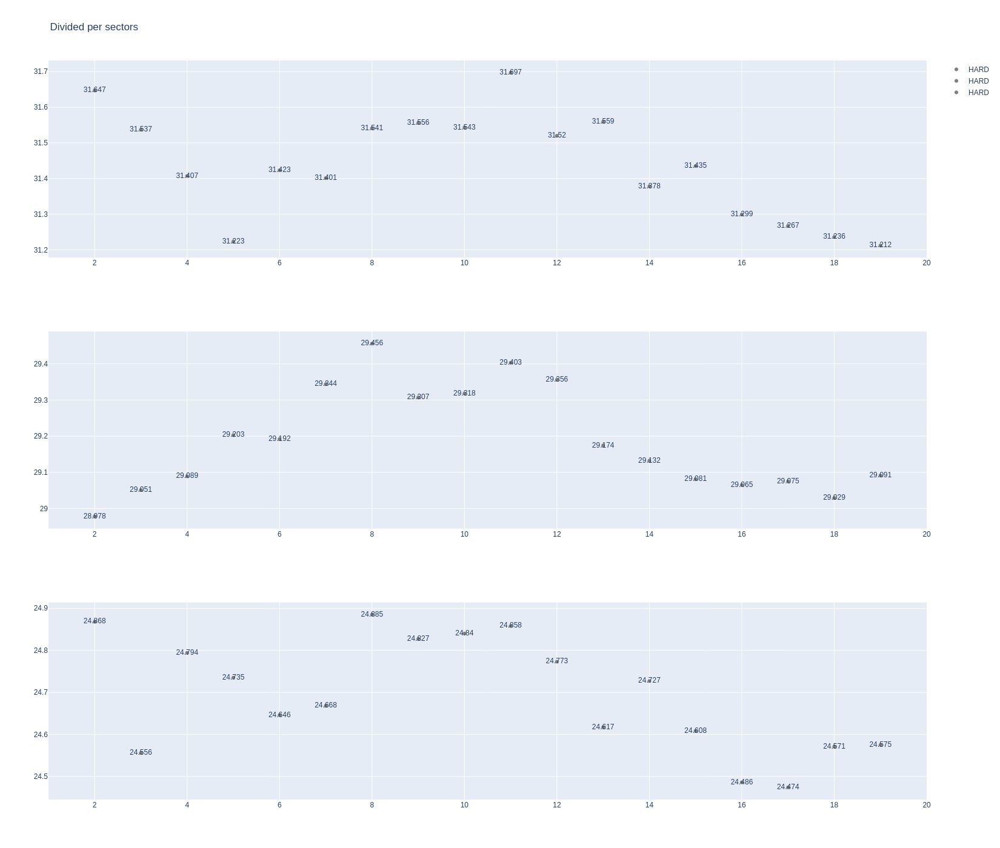

In [66]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [67]:
stintInformation.query('driver_number == 44 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
9,1275,9845,1,16,1,1,MEDIUM,6
24,1275,9845,2,16,2,19,HARD,0
28,1275,9845,1,44,1,19,MEDIUM,0


In [68]:
data = libraryDataF1.getinfolongruns(jointables,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
52,Charles LECLERC,HARD,2025-11-29T14:06:36.249000+00:00,3,31.662,29.626,24.823,86.111
72,Charles LECLERC,HARD,2025-11-29T14:08:02.297000+00:00,4,31.446,29.459,24.733,85.638
92,Charles LECLERC,HARD,2025-11-29T14:09:27.940000+00:00,5,31.480,29.383,24.855,85.718
112,Charles LECLERC,HARD,2025-11-29T14:10:53.689000+00:00,6,31.487,29.637,24.787,85.911
132,Charles LECLERC,HARD,2025-11-29T14:12:19.590000+00:00,7,31.512,29.685,24.891,86.088
152,Charles LECLERC,HARD,2025-11-29T14:13:45.729000+00:00,8,31.864,29.752,24.809,86.425
172,Charles LECLERC,HARD,2025-11-29T14:15:12.103000+00:00,9,31.687,29.839,24.691,86.217
192,Charles LECLERC,HARD,2025-11-29T14:16:38.399000+00:00,10,31.943,29.861,24.821,86.625
233,Charles LECLERC,HARD,2025-11-29T14:19:33.515000+00:00,12,31.640,29.574,24.637,85.851
252,Charles LECLERC,HARD,2025-11-29T14:20:59.483000+00:00,13,31.795,29.586,24.647,86.028


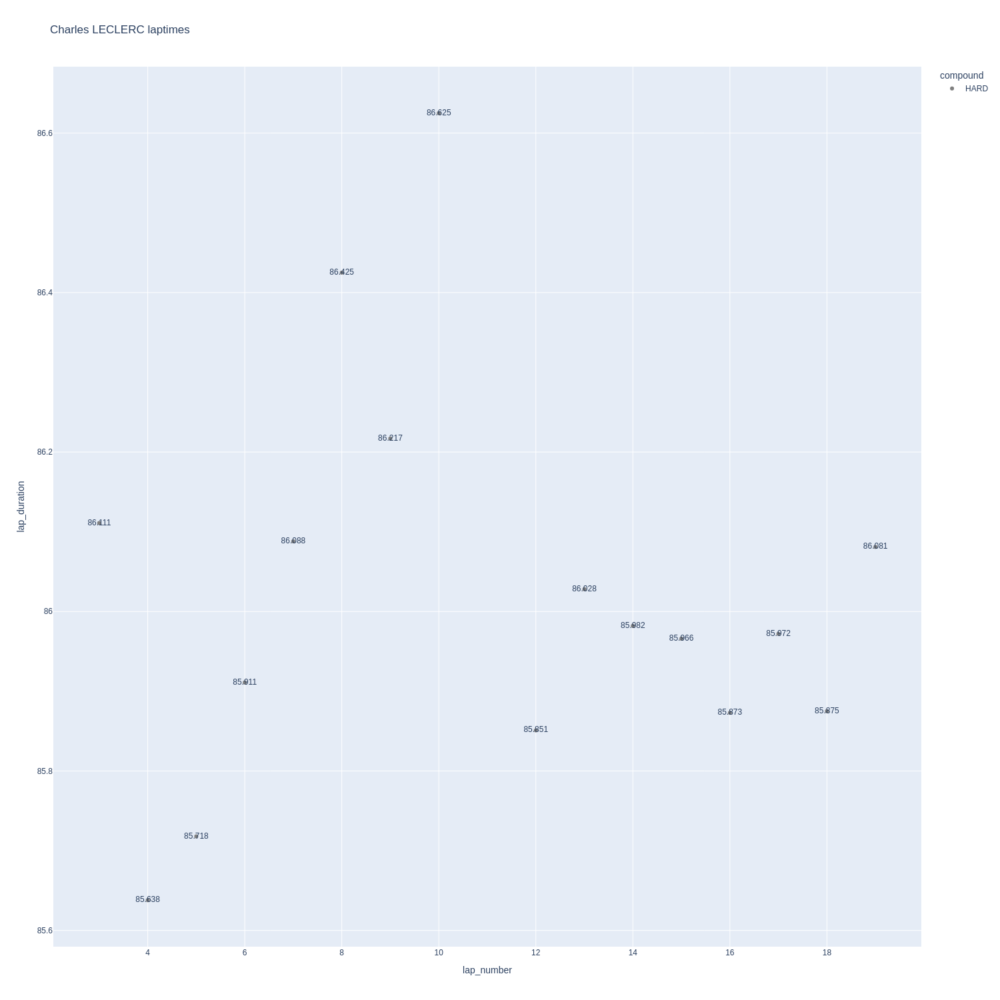

In [69]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

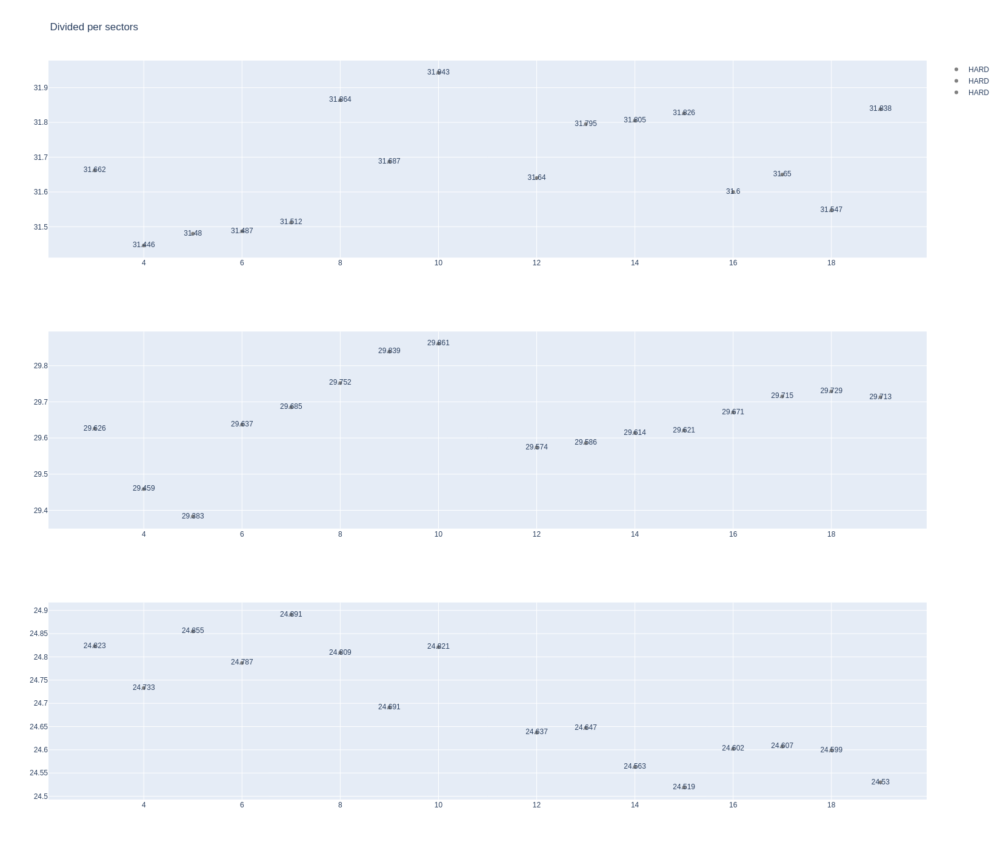

In [70]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [71]:
data = libraryDataF1.getinfolongruns(jointables,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
77,Lewis HAMILTON,MEDIUM,2025-11-29T14:08:05.725000+00:00,4,31.697,29.596,25.100,86.393
97,Lewis HAMILTON,MEDIUM,2025-11-29T14:09:32.190000+00:00,5,31.738,29.593,24.782,86.113
117,Lewis HAMILTON,MEDIUM,2025-11-29T14:10:58.273000+00:00,6,31.569,29.836,24.812,86.217
137,Lewis HAMILTON,MEDIUM,2025-11-29T14:12:24.433000+00:00,7,31.729,29.450,24.850,86.029
157,Lewis HAMILTON,MEDIUM,2025-11-29T14:13:50.507000+00:00,8,31.540,29.494,24.748,85.782
177,Lewis HAMILTON,MEDIUM,2025-11-29T14:15:16.257000+00:00,9,31.671,29.913,25.045,86.629
197,Lewis HAMILTON,MEDIUM,2025-11-29T14:16:42.993000+00:00,10,31.799,29.643,25.039,86.481
217,Lewis HAMILTON,MEDIUM,2025-11-29T14:18:09.401000+00:00,11,31.930,29.769,25.005,86.704
257,Lewis HAMILTON,MEDIUM,2025-11-29T14:21:03.656000+00:00,13,31.888,29.835,25.149,86.872
276,Lewis HAMILTON,MEDIUM,2025-11-29T14:22:30.484000+00:00,14,31.437,29.664,24.947,86.048


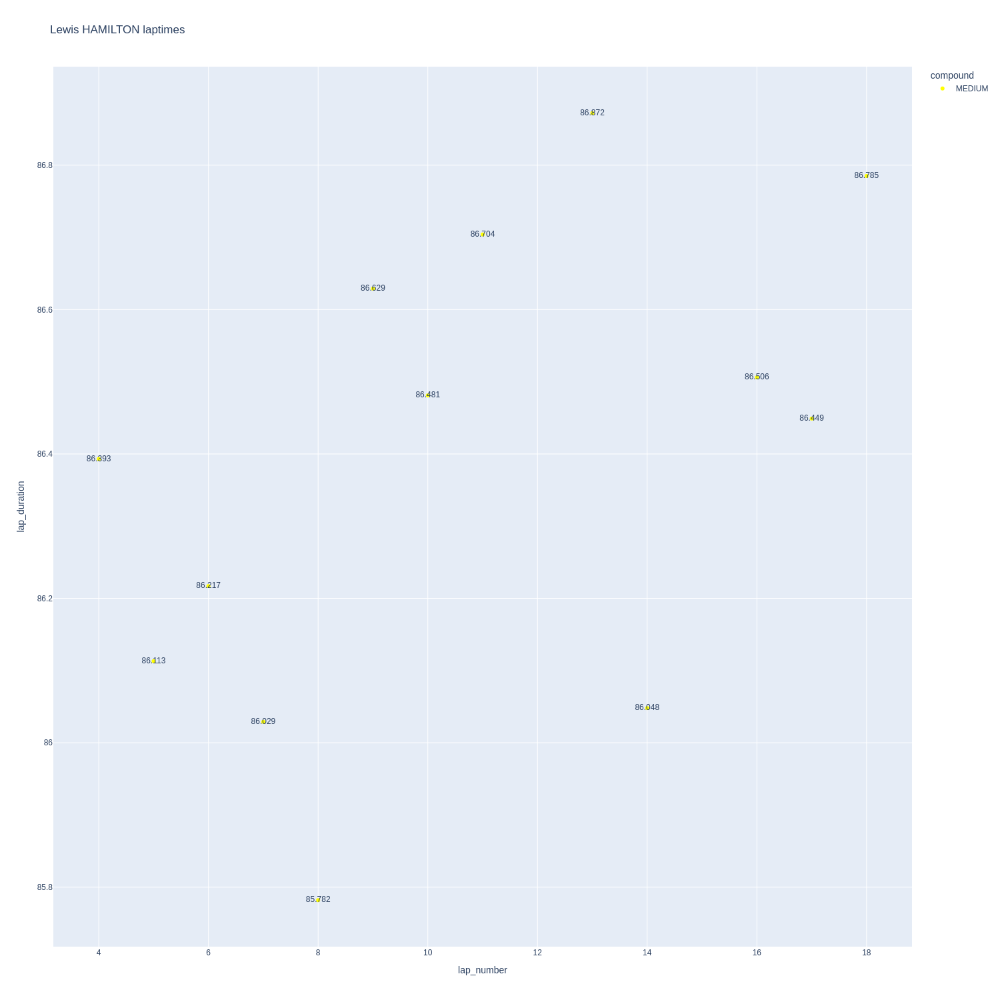

In [72]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

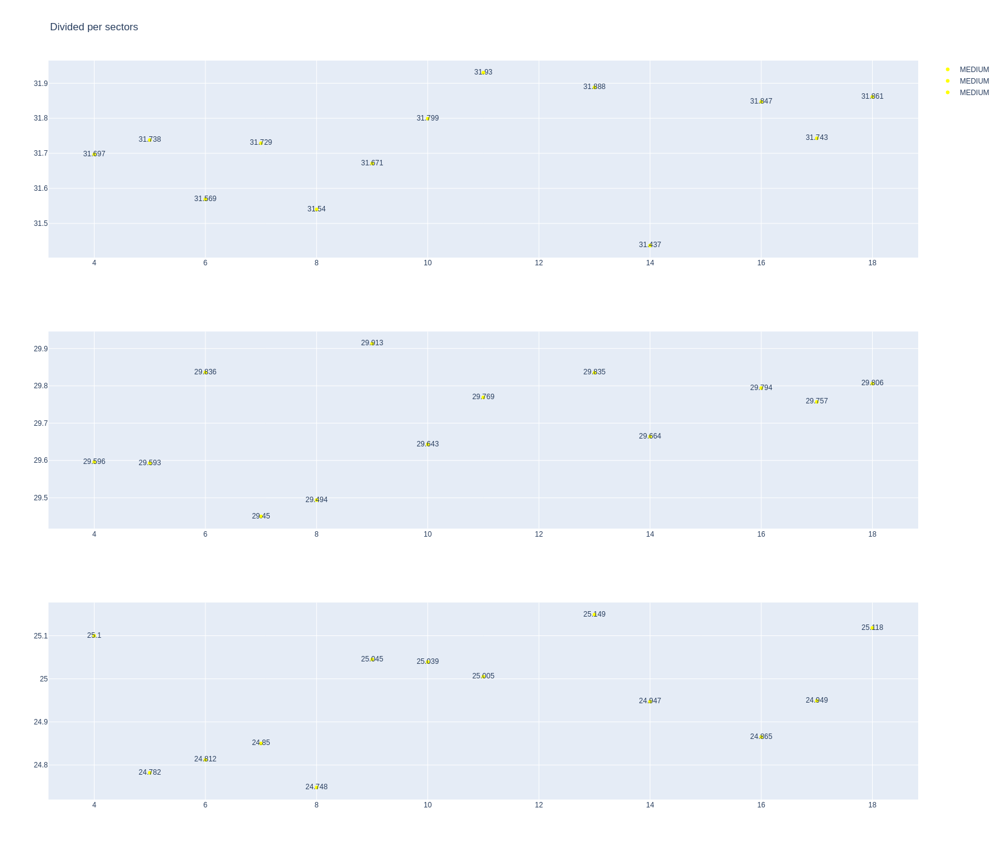

In [73]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [74]:
stintInformation.query('driver_number == 63 or driver_number == 12')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
6,1275,9845,1,12,1,1,MEDIUM,6
13,1275,9845,1,63,1,19,MEDIUM,6
17,1275,9845,2,12,2,19,HARD,0


In [75]:
data = libraryDataF1.getinfolongruns(jointables,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
26,Kimi ANTONELLI,HARD,2025-11-29T14:05:05.951000+00:00,2,31.811,29.087,24.982,85.880
46,Kimi ANTONELLI,HARD,2025-11-29T14:06:31.780000+00:00,3,31.594,29.073,24.869,85.536
66,Kimi ANTONELLI,HARD,2025-11-29T14:07:57.323000+00:00,4,31.550,29.178,24.906,85.634
86,Kimi ANTONELLI,HARD,2025-11-29T14:09:22.909000+00:00,5,31.314,29.346,24.941,85.601
106,Kimi ANTONELLI,HARD,2025-11-29T14:10:48.580000+00:00,6,31.474,29.195,24.905,85.574
126,Kimi ANTONELLI,HARD,2025-11-29T14:12:14.191000+00:00,7,31.433,29.290,24.804,85.527
146,Kimi ANTONELLI,HARD,2025-11-29T14:13:39.751000+00:00,8,31.388,29.307,24.902,85.597
166,Kimi ANTONELLI,HARD,2025-11-29T14:15:05.355000+00:00,9,31.488,29.401,24.796,85.685
186,Kimi ANTONELLI,HARD,2025-11-29T14:16:31.008000+00:00,10,31.400,29.283,24.777,85.460
206,Kimi ANTONELLI,HARD,2025-11-29T14:17:56.465000+00:00,11,31.463,29.469,24.809,85.741


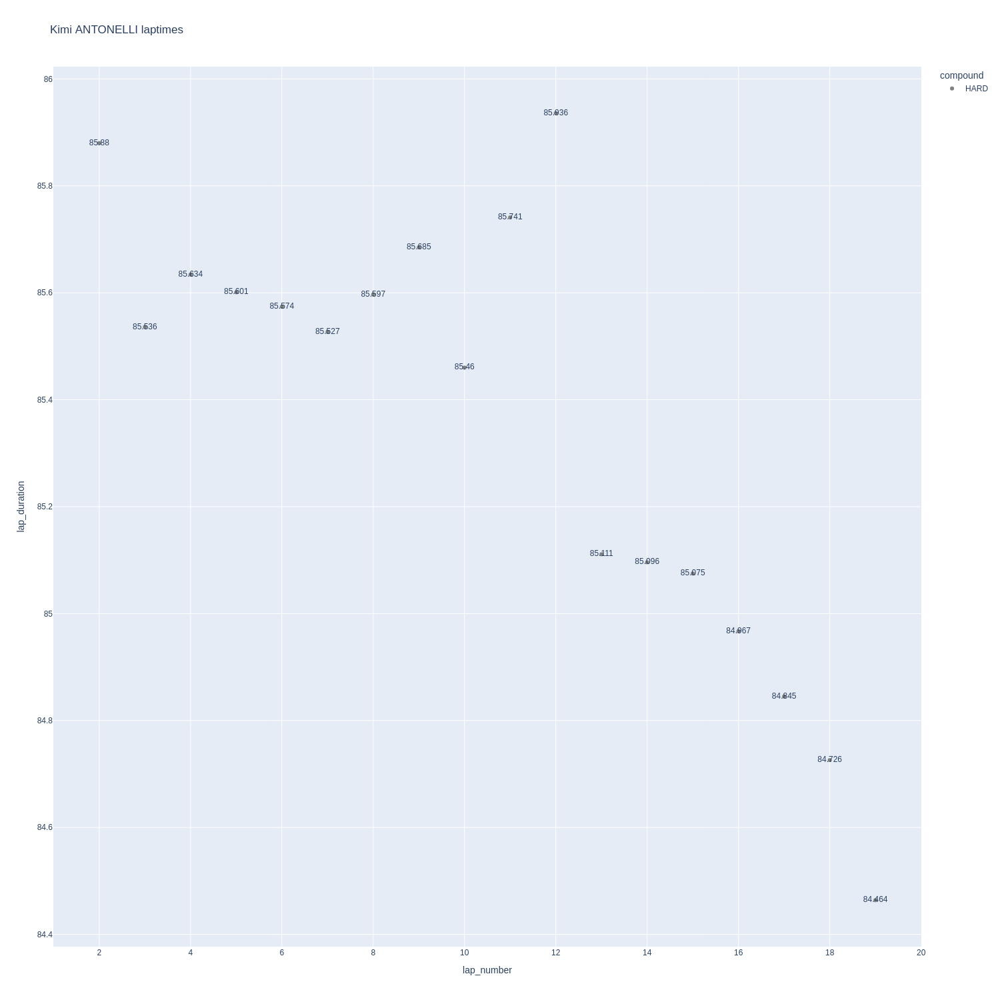

In [76]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

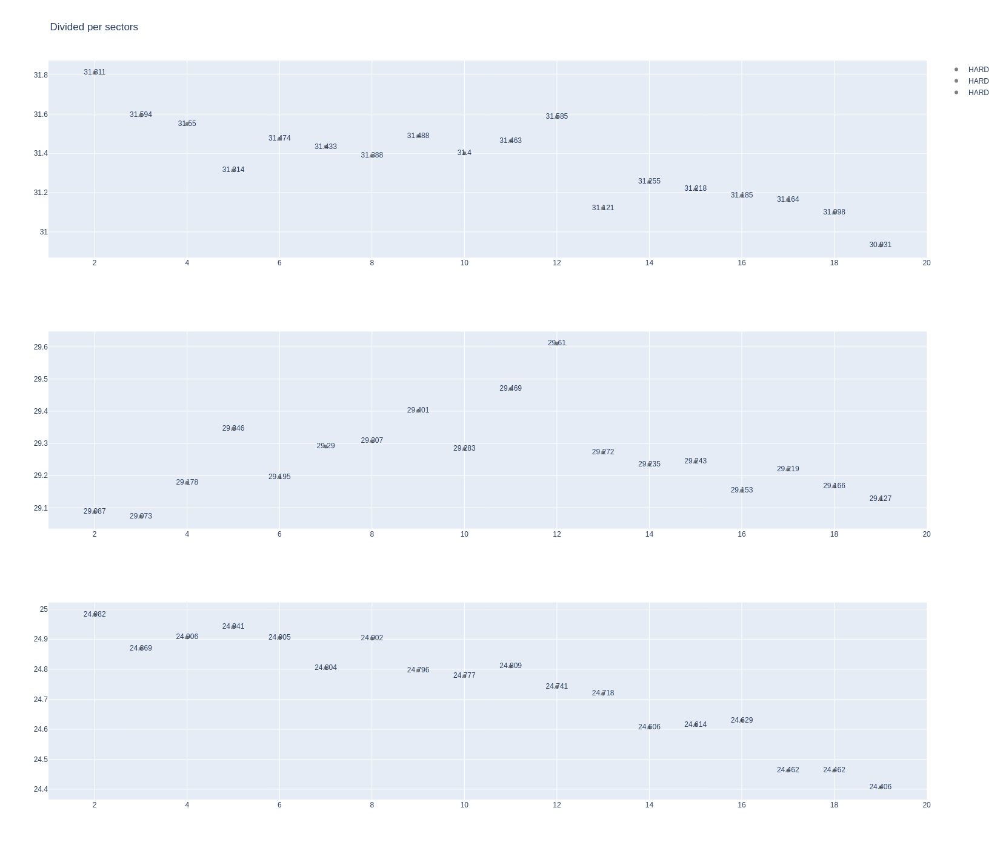

In [77]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [78]:
data = libraryDataF1.getinfolongruns(jointables,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
21,George RUSSELL,MEDIUM,2025-11-29T14:05:01.785000+00:00,2,31.518,28.766,24.801,85.085
41,George RUSSELL,MEDIUM,2025-11-29T14:06:26.749000+00:00,3,31.367,28.988,24.842,85.197
61,George RUSSELL,MEDIUM,2025-11-29T14:07:52.101000+00:00,4,31.355,29.014,24.642,85.011
81,George RUSSELL,MEDIUM,2025-11-29T14:09:17.017000+00:00,5,31.306,29.109,24.510,84.925
101,George RUSSELL,MEDIUM,2025-11-29T14:10:41.984000+00:00,6,31.132,29.184,24.540,84.856
121,George RUSSELL,MEDIUM,2025-11-29T14:12:06.810000+00:00,7,31.240,29.197,24.548,84.985
141,George RUSSELL,MEDIUM,2025-11-29T14:13:31.795000+00:00,8,31.098,29.257,24.479,84.834
161,George RUSSELL,MEDIUM,2025-11-29T14:14:56.734000+00:00,9,31.150,29.229,24.550,84.929
181,George RUSSELL,MEDIUM,2025-11-29T14:16:21.526000+00:00,10,31.197,29.185,24.482,84.864
201,George RUSSELL,MEDIUM,2025-11-29T14:17:46.418000+00:00,11,31.277,29.241,24.527,85.045


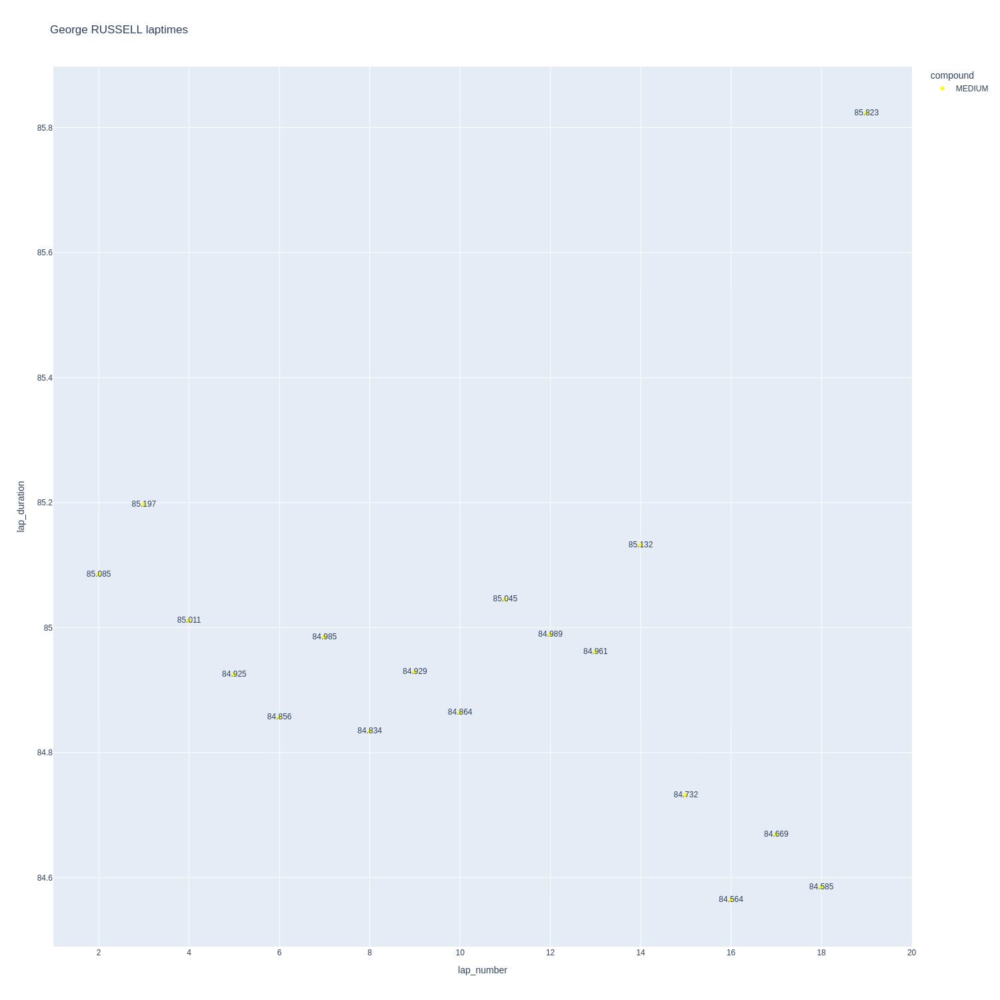

In [79]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

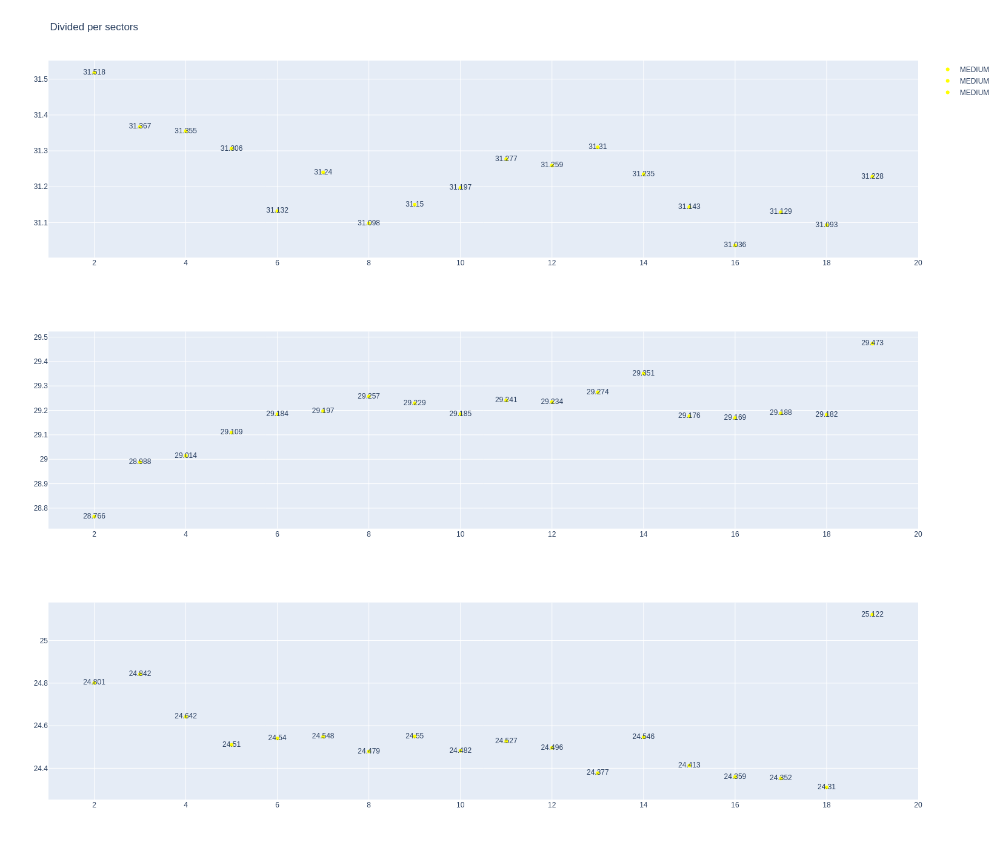

In [80]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [81]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
5,1275,9845,1,4,1,1,MEDIUM,5
12,1275,9845,1,81,1,19,MEDIUM,5
14,1275,9845,2,4,2,19,HARD,0


In [82]:
data = libraryDataF1.getinfolongruns(jointables,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
22,Lando NORRIS,HARD,2025-11-29T14:05:03.058000+00:00,2,31.619,28.844,24.672,85.135
42,Lando NORRIS,HARD,2025-11-29T14:06:28.139000+00:00,3,31.427,28.973,24.698,85.098
62,Lando NORRIS,HARD,2025-11-29T14:07:53.192000+00:00,4,31.267,29.212,24.624,85.103
82,Lando NORRIS,HARD,2025-11-29T14:09:18.253000+00:00,5,31.177,29.229,24.563,84.969
102,Lando NORRIS,HARD,2025-11-29T14:10:43.219000+00:00,6,31.291,29.214,24.576,85.081
122,Lando NORRIS,HARD,2025-11-29T14:12:08.325000+00:00,7,31.360,29.308,24.521,85.189
142,Lando NORRIS,HARD,2025-11-29T14:13:33.503000+00:00,8,31.266,29.393,24.410,85.069
162,Lando NORRIS,HARD,2025-11-29T14:14:58.674000+00:00,9,31.340,29.263,24.393,84.996
182,Lando NORRIS,HARD,2025-11-29T14:16:23.618000+00:00,10,31.434,29.247,24.340,85.021
202,Lando NORRIS,HARD,2025-11-29T14:17:48.715000+00:00,11,31.363,29.185,24.311,84.859


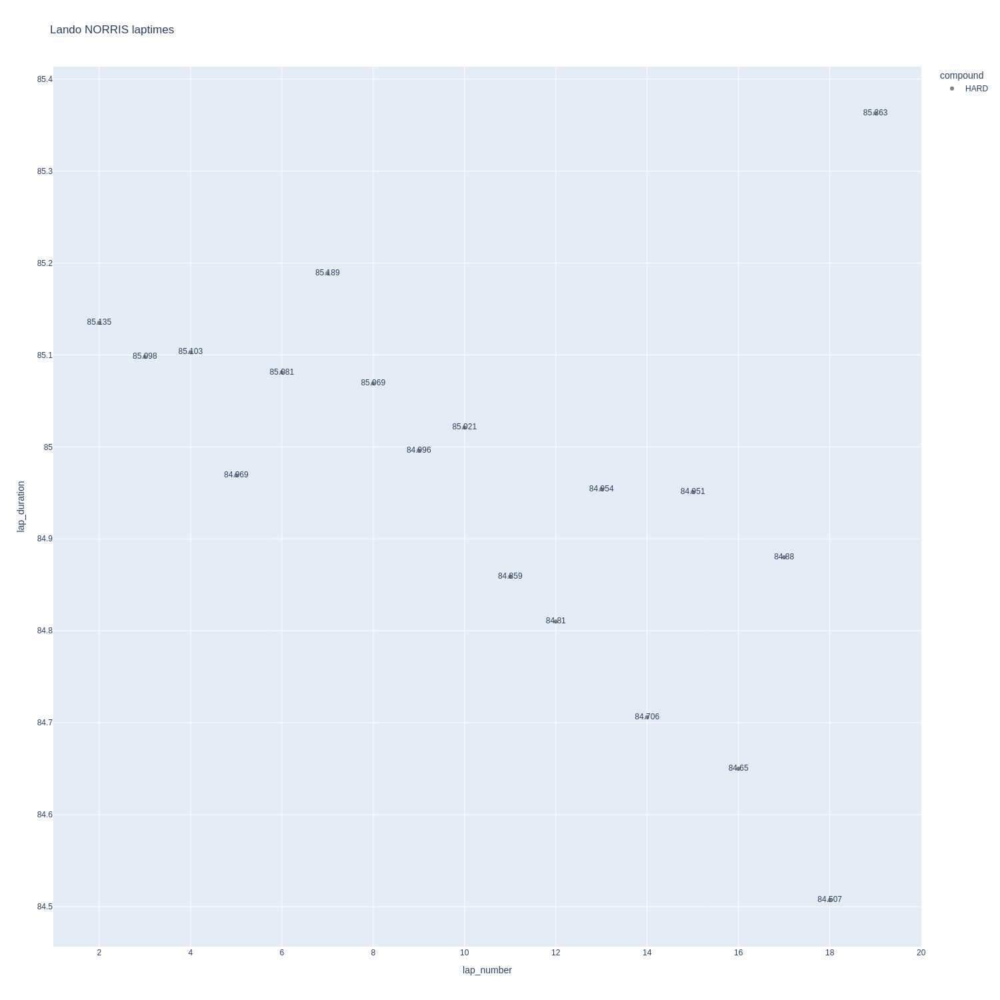

In [83]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

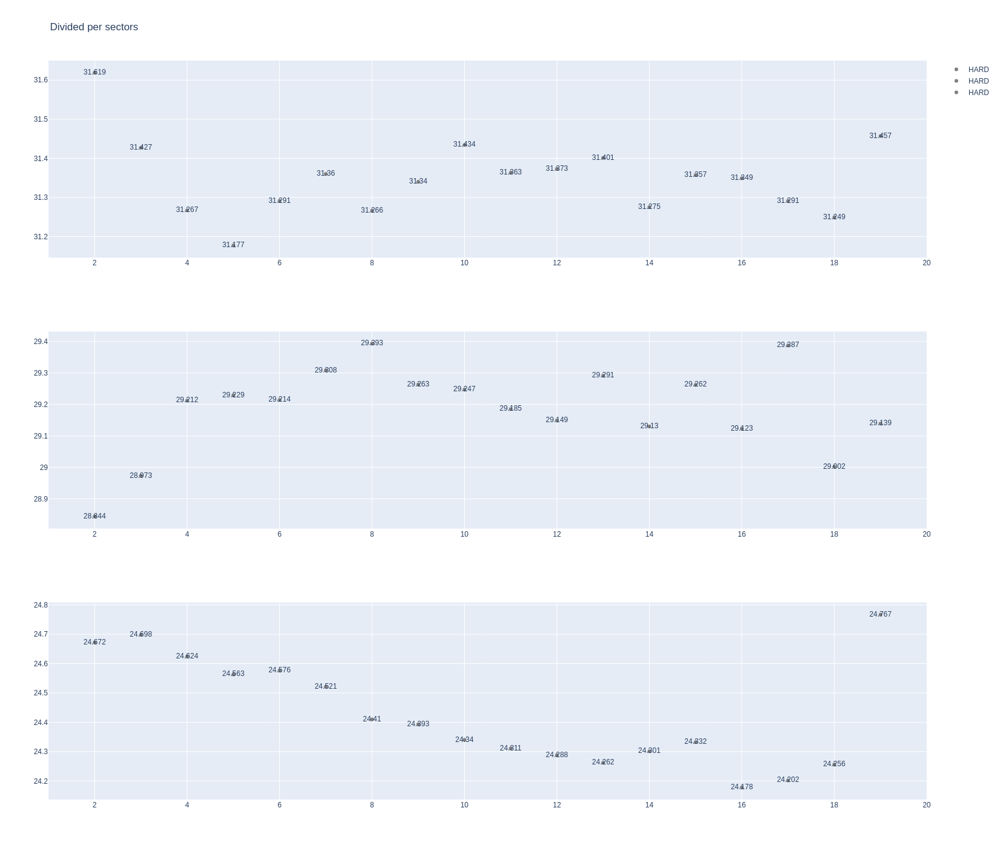

In [84]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [85]:
data = libraryDataF1.getinfolongruns(jointables,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
20,Oscar PIASTRI,MEDIUM,2025-11-29T14:05:00.654000+00:00,2,31.501,28.571,25.014,85.086
40,Oscar PIASTRI,MEDIUM,2025-11-29T14:06:25.577000+00:00,3,31.465,28.823,24.858,85.146
60,Oscar PIASTRI,MEDIUM,2025-11-29T14:07:50.703000+00:00,4,31.432,28.716,24.774,84.922
80,Oscar PIASTRI,MEDIUM,2025-11-29T14:09:15.772000+00:00,5,31.363,28.861,24.811,85.035
100,Oscar PIASTRI,MEDIUM,2025-11-29T14:10:40.656000+00:00,6,31.247,28.683,24.704,84.634
120,Oscar PIASTRI,MEDIUM,2025-11-29T14:12:05.417000+00:00,7,NaN,28.860,24.727,84.834
140,Oscar PIASTRI,MEDIUM,2025-11-29T14:13:30.203000+00:00,8,31.290,28.808,24.610,84.708
160,Oscar PIASTRI,MEDIUM,2025-11-29T14:14:54.813000+00:00,9,31.288,28.898,24.704,84.890
180,Oscar PIASTRI,MEDIUM,2025-11-29T14:16:19.741000+00:00,10,31.257,28.851,24.630,84.738
200,Oscar PIASTRI,MEDIUM,2025-11-29T14:17:44.496000+00:00,11,31.374,28.843,24.782,84.999


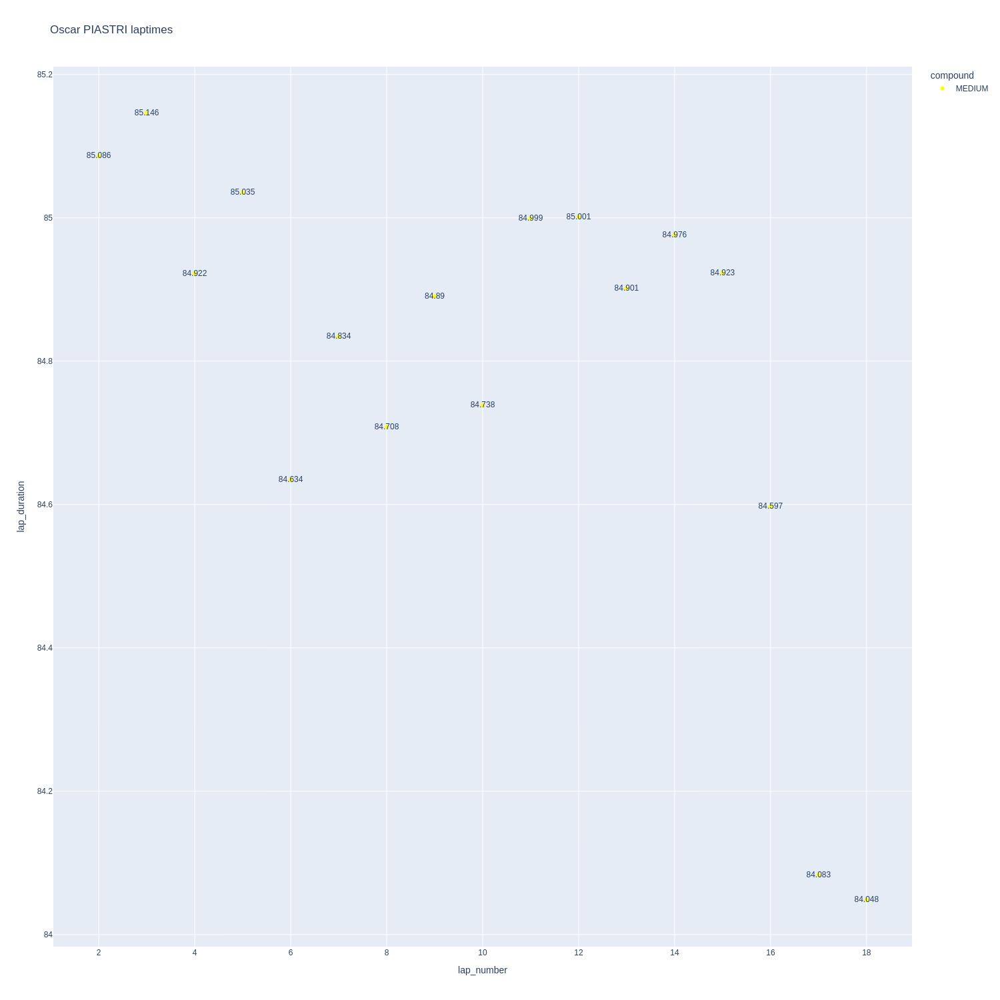

In [86]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

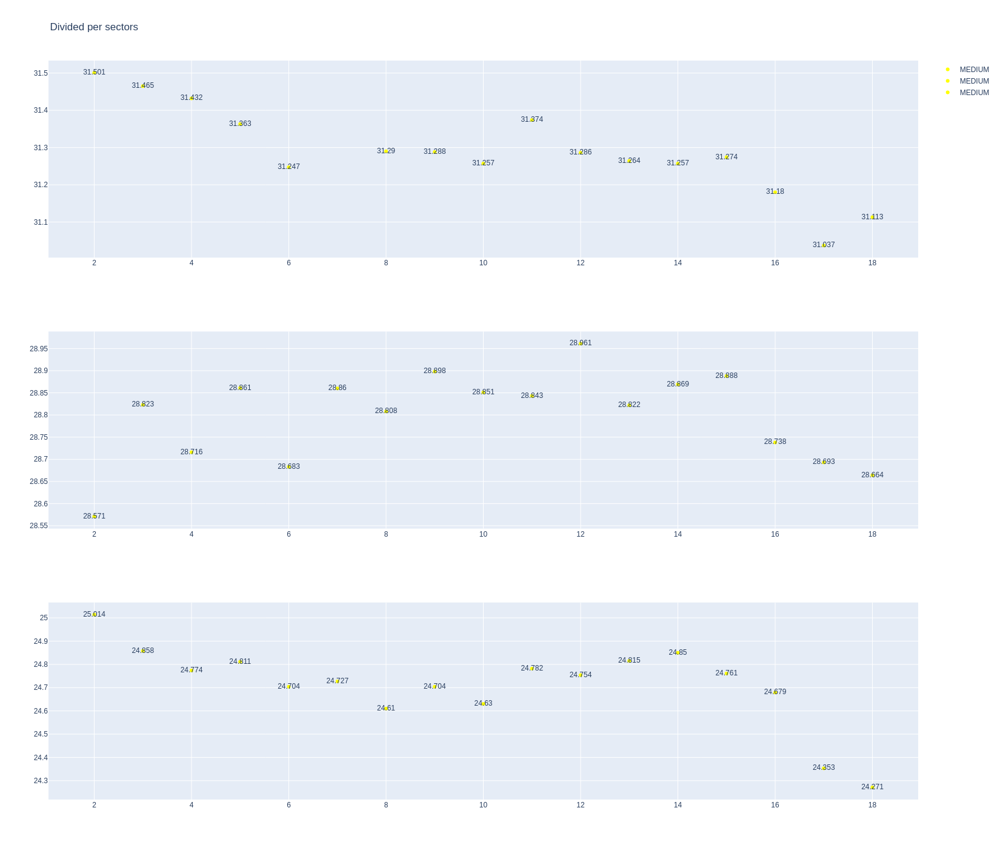

In [87]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [88]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1275,9845,1,14,1,1,MEDIUM,6
10,1275,9845,1,18,1,13,MEDIUM,7
18,1275,9845,2,14,2,19,HARD,0
30,1275,9845,2,18,14,19,SOFT,10


In [89]:
data = libraryDataF1.getinfolongruns(jointables,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
25,Fernando ALONSO,HARD,2025-11-29T14:05:05.300000+00:00,2,31.762,29.261,24.803,85.826
45,Fernando ALONSO,HARD,2025-11-29T14:06:31.108000+00:00,3,31.449,29.230,24.845,85.524
65,Fernando ALONSO,HARD,2025-11-29T14:07:56.641000+00:00,4,31.518,29.132,24.765,85.415
85,Fernando ALONSO,HARD,2025-11-29T14:09:22.143000+00:00,5,31.453,29.220,24.828,85.501
105,Fernando ALONSO,HARD,2025-11-29T14:10:47.624000+00:00,6,31.510,29.309,24.809,85.628
125,Fernando ALONSO,HARD,2025-11-29T14:12:13.224000+00:00,7,31.370,29.296,24.868,85.534
145,Fernando ALONSO,HARD,2025-11-29T14:13:38.716000+00:00,8,31.432,29.379,24.871,85.682
165,Fernando ALONSO,HARD,2025-11-29T14:15:04.441000+00:00,9,31.439,29.395,24.759,85.593
185,Fernando ALONSO,HARD,2025-11-29T14:16:30.102000+00:00,10,31.462,29.430,24.649,85.541
205,Fernando ALONSO,HARD,2025-11-29T14:17:55.637000+00:00,11,31.657,29.484,24.715,85.856


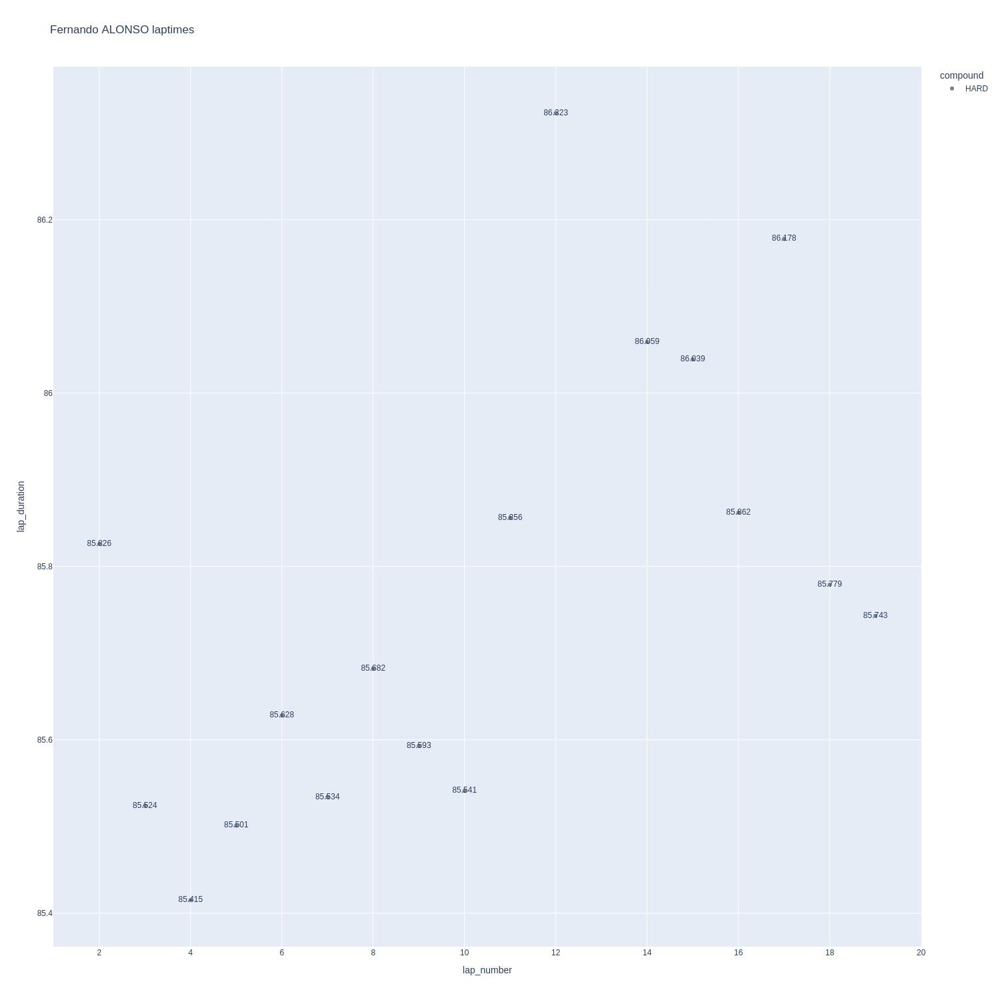

In [90]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

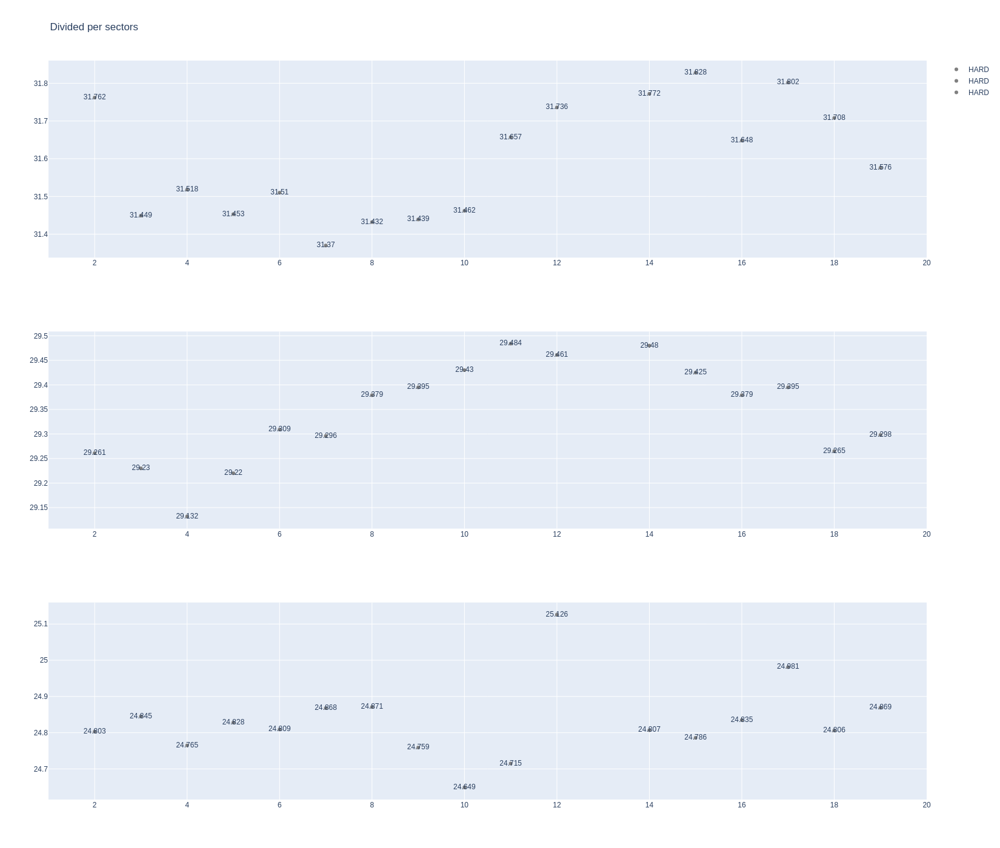

In [91]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [92]:
data = libraryDataF1.getinfolongruns(jointables,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
56,Lance STROLL,MEDIUM,2025-11-29T14:06:38.301000+00:00,3,31.892,29.395,25.341,86.628
76,Lance STROLL,MEDIUM,2025-11-29T14:08:04.901000+00:00,4,31.551,29.621,24.983,86.155
96,Lance STROLL,MEDIUM,2025-11-29T14:09:31.128000+00:00,5,31.482,29.373,24.929,85.784
116,Lance STROLL,MEDIUM,2025-11-29T14:10:56.839000+00:00,6,31.447,29.459,24.847,85.753
136,Lance STROLL,MEDIUM,2025-11-29T14:12:22.653000+00:00,7,31.499,29.700,25.085,86.284
156,Lance STROLL,MEDIUM,2025-11-29T14:13:48.929000+00:00,8,31.724,29.776,24.934,86.434
176,Lance STROLL,MEDIUM,2025-11-29T14:15:15.311000+00:00,9,31.714,29.747,24.911,86.372
196,Lance STROLL,MEDIUM,2025-11-29T14:16:41.743000+00:00,10,31.784,29.728,24.989,86.501


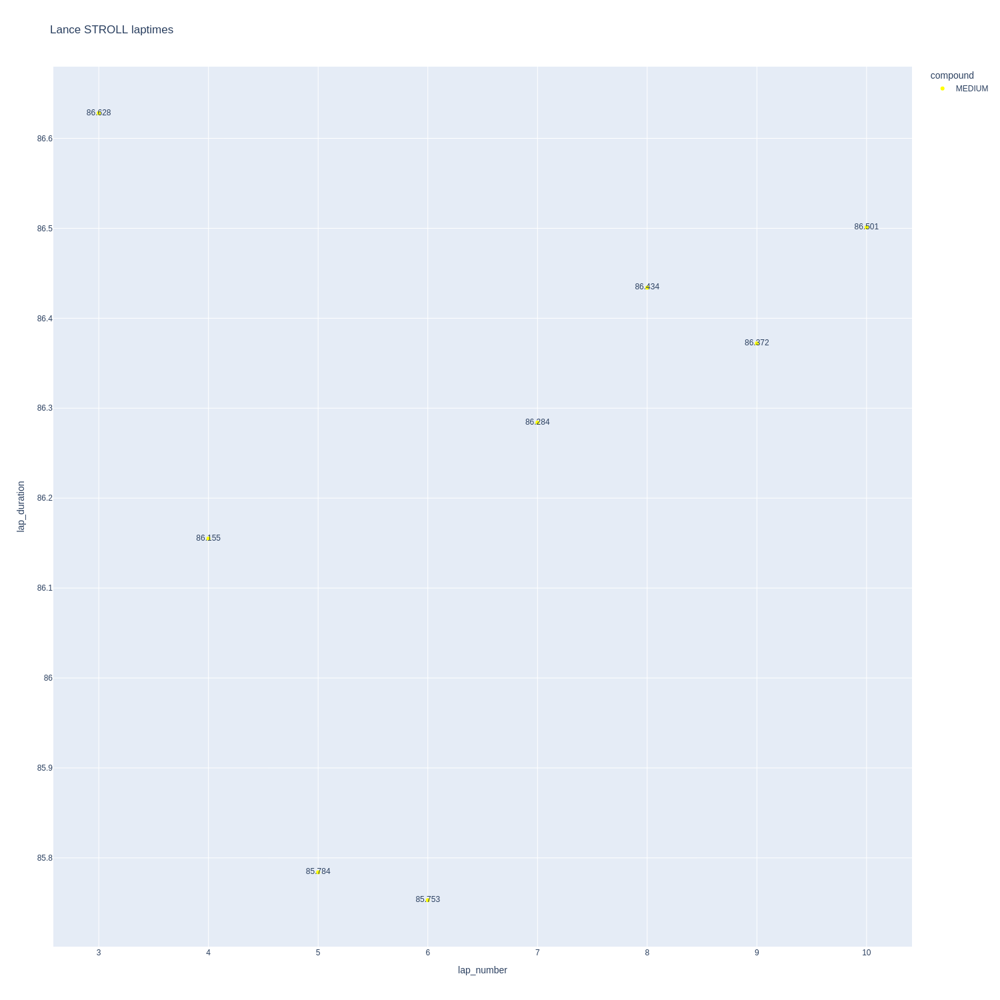

In [93]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

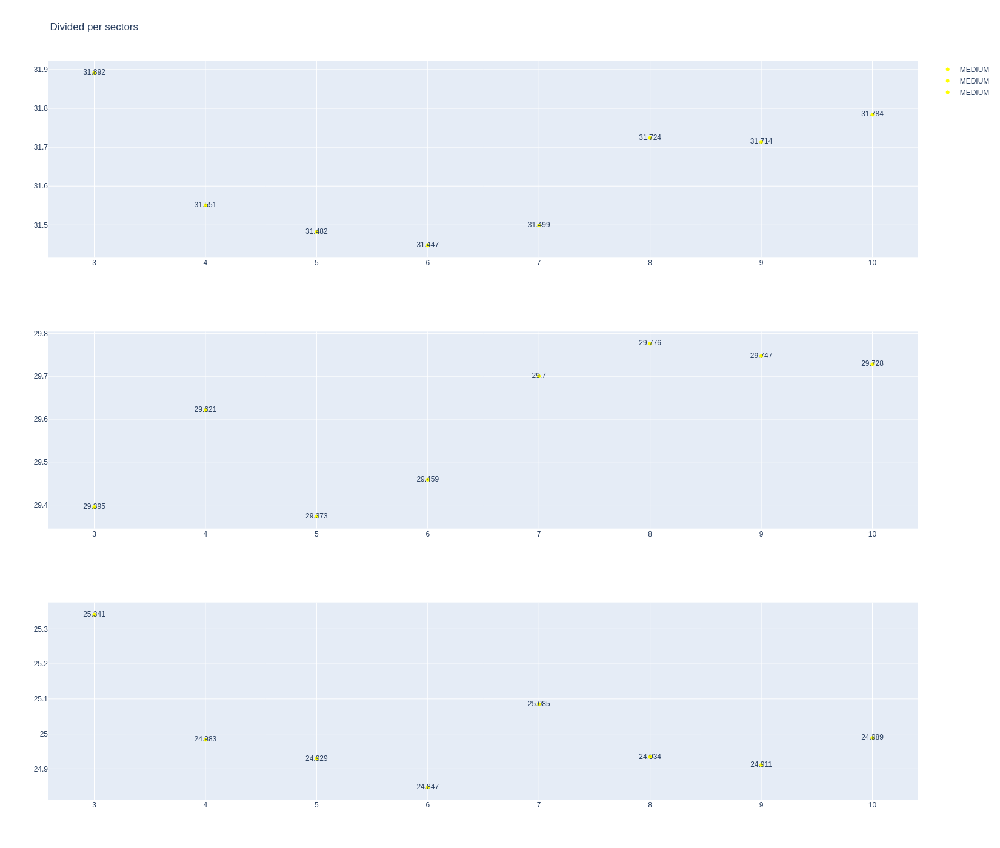

In [94]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [95]:
stintInformation.query('driver_number == 30 or driver_number == 6')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1275,9845,1,6,1,1,MEDIUM,6
20,1275,9845,2,6,2,19,HARD,0
25,1275,9845,1,30,1,19,MEDIUM,6


In [96]:
data = libraryDataF1.getinfolongruns(jointables,30,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
53,Liam LAWSON,MEDIUM,2025-11-29T14:06:36.782000+00:00,3,31.753,29.546,25.069,86.368
73,Liam LAWSON,MEDIUM,2025-11-29T14:08:03.079000+00:00,4,31.674,29.171,24.895,85.740
93,Liam LAWSON,MEDIUM,2025-11-29T14:09:28.924000+00:00,5,31.391,29.418,24.811,85.620
113,Liam LAWSON,MEDIUM,2025-11-29T14:10:54.455000+00:00,6,31.444,29.540,25.028,86.012
133,Liam LAWSON,MEDIUM,2025-11-29T14:12:20.508000+00:00,7,31.635,29.462,24.819,85.916
153,Liam LAWSON,MEDIUM,2025-11-29T14:13:46.338000+00:00,8,31.904,29.700,24.885,86.489
173,Liam LAWSON,MEDIUM,2025-11-29T14:15:12.839000+00:00,9,31.694,29.764,24.844,86.302
193,Liam LAWSON,MEDIUM,2025-11-29T14:16:39.133000+00:00,10,31.758,29.869,24.907,86.534
253,Liam LAWSON,MEDIUM,2025-11-29T14:21:00.328000+00:00,13,31.928,29.490,24.816,86.234
273,Liam LAWSON,MEDIUM,2025-11-29T14:22:26.593000+00:00,14,31.797,29.343,24.872,86.012


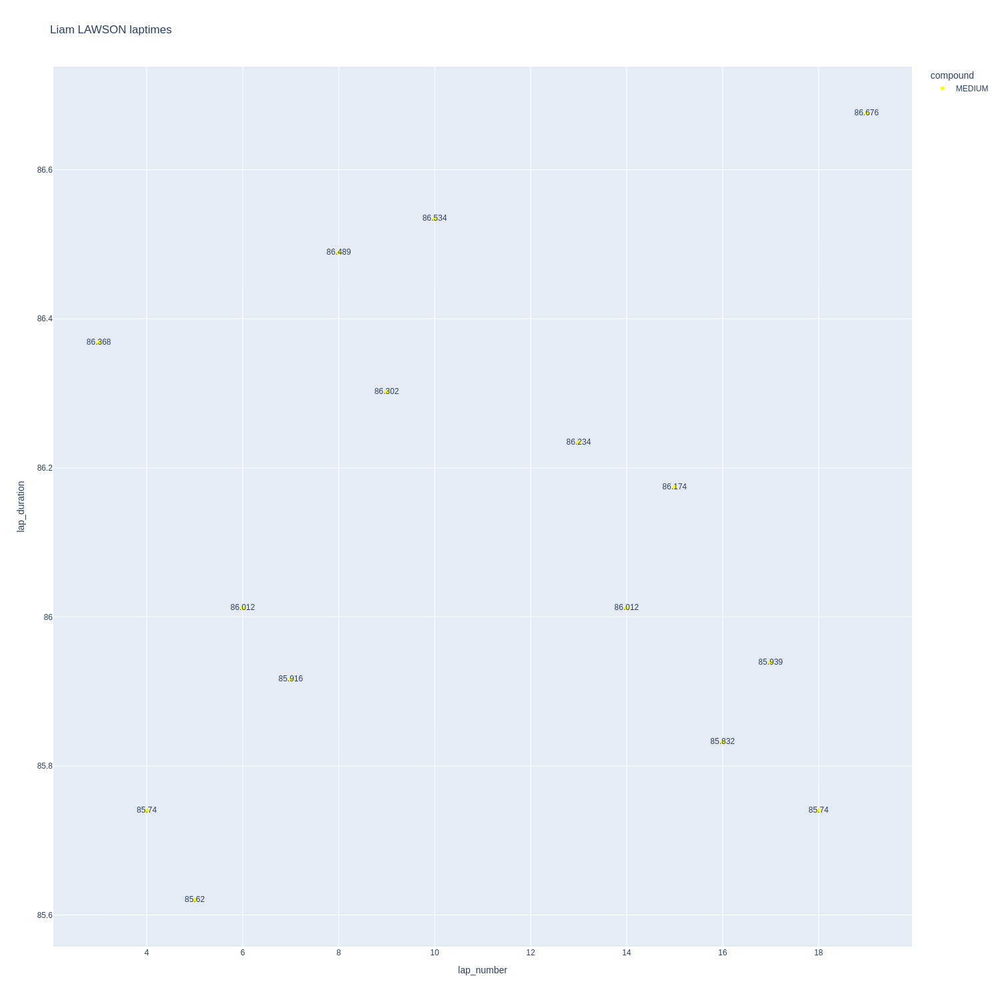

In [97]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

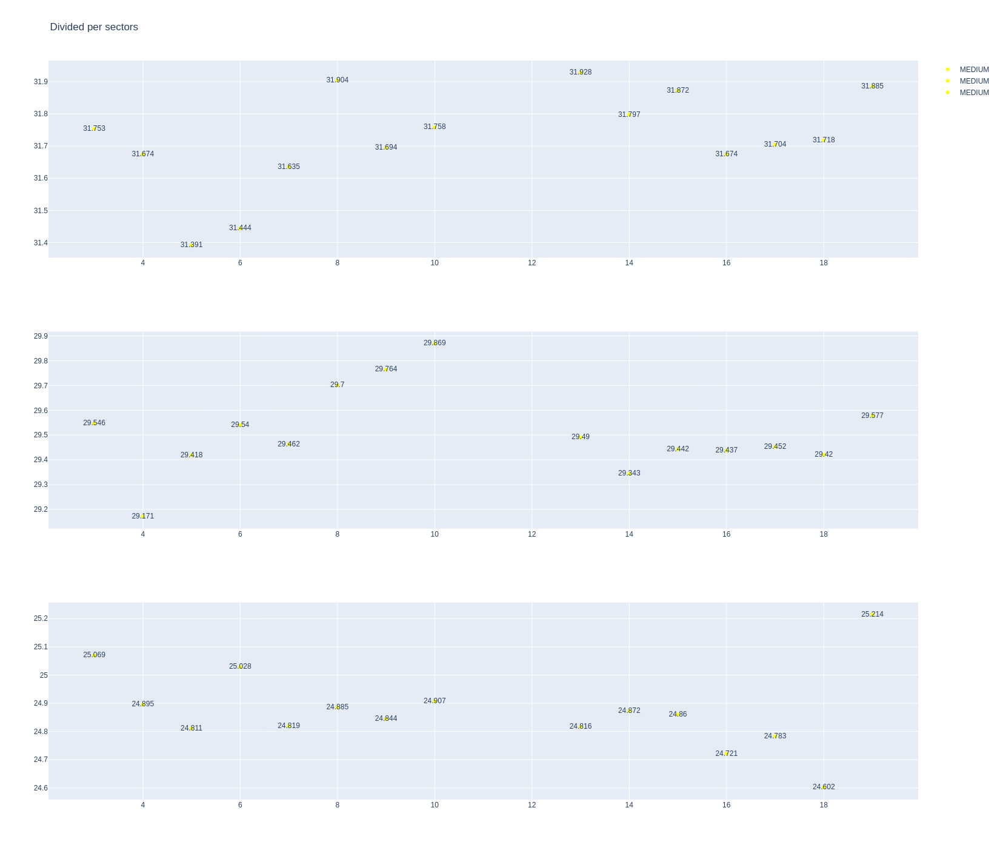

In [98]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [99]:
data = libraryDataF1.getinfolongruns(jointables,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
28,Isack HADJAR,HARD,2025-11-29T14:05:06.988000+00:00,2,32.314,29.483,24.897,86.694
48,Isack HADJAR,HARD,2025-11-29T14:06:33.688000+00:00,3,31.627,29.068,24.937,85.632
68,Isack HADJAR,HARD,2025-11-29T14:07:59.298000+00:00,4,31.544,29.087,24.862,85.493
88,Isack HADJAR,HARD,2025-11-29T14:09:24.815000+00:00,5,31.443,29.110,24.851,85.404
108,Isack HADJAR,HARD,2025-11-29T14:10:50.117000+00:00,6,31.618,29.284,24.904,85.806
128,Isack HADJAR,HARD,2025-11-29T14:12:15.960000+00:00,7,31.668,29.423,24.851,85.942
148,Isack HADJAR,HARD,2025-11-29T14:13:42.022000+00:00,8,31.817,29.359,24.911,86.087
168,Isack HADJAR,HARD,2025-11-29T14:15:08.024000+00:00,9,31.927,29.400,24.789,86.116
188,Isack HADJAR,HARD,2025-11-29T14:16:34.087000+00:00,10,31.874,29.473,24.873,86.220
208,Isack HADJAR,HARD,2025-11-29T14:18:00.309000+00:00,11,31.880,29.415,24.774,86.069


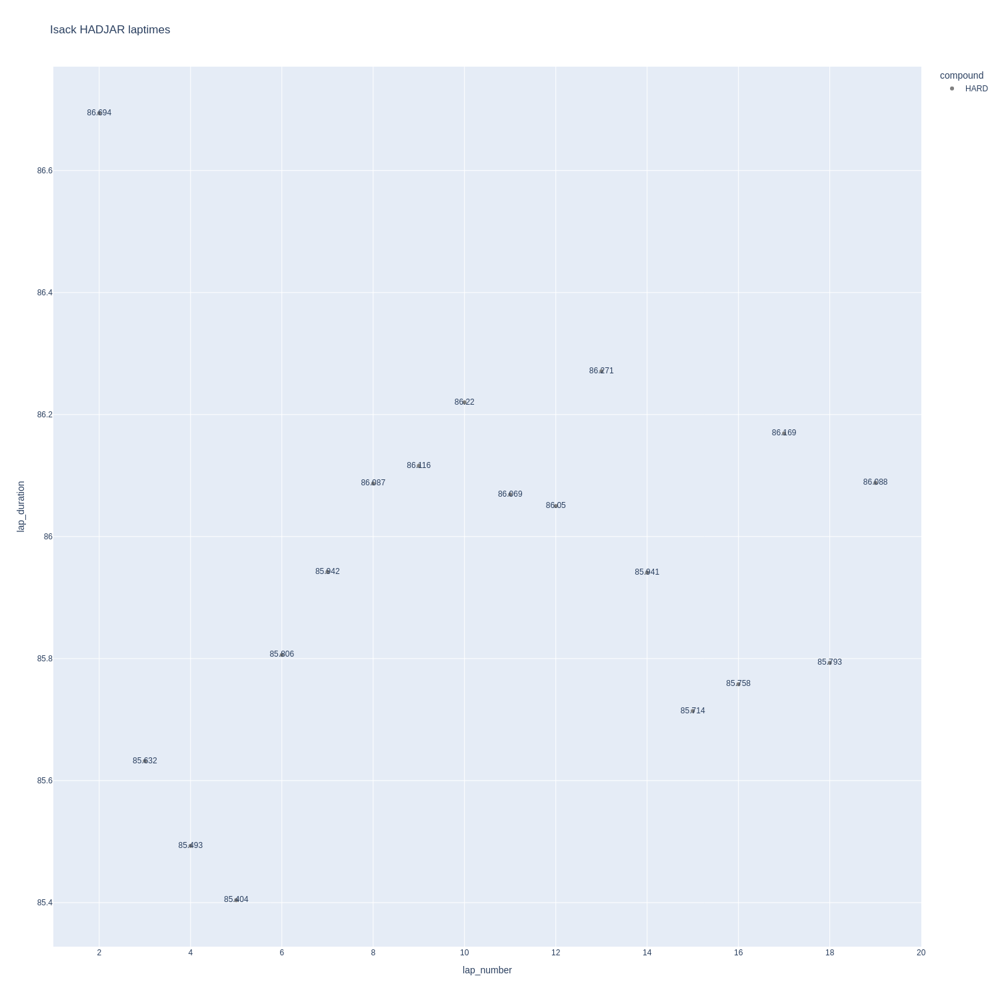

In [100]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

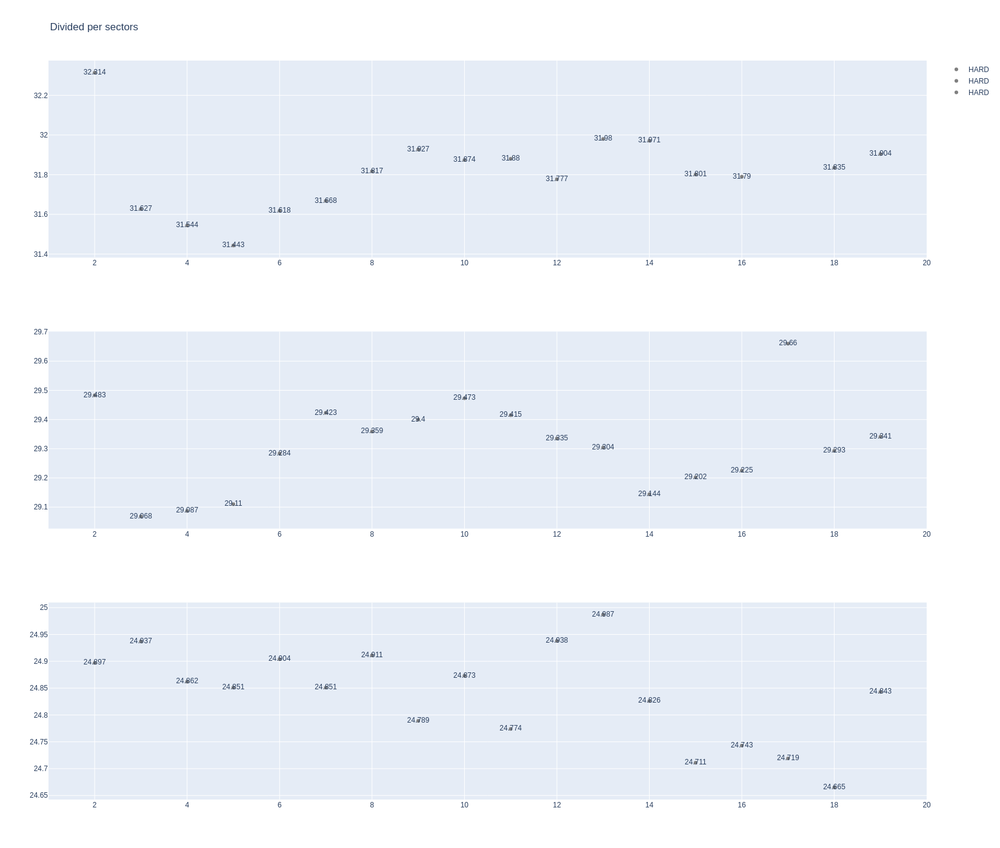

In [101]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [102]:
stintInformation.query('driver_number == 20 or driver_number == 27')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
27,1275,9845,1,27,1,19,MEDIUM,6


In [103]:
data = libraryDataF1.getinfolongruns(jointables,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
54,Esteban OCON,MEDIUM,2025-11-29T14:06:37.371000+00:00,3,31.935,29.386,25.154,86.475
74,Esteban OCON,MEDIUM,2025-11-29T14:08:03.841000+00:00,4,31.656,29.258,25.066,85.980
94,Esteban OCON,MEDIUM,2025-11-29T14:09:29.831000+00:00,5,31.415,29.268,24.872,85.555
114,Esteban OCON,MEDIUM,2025-11-29T14:10:55.437000+00:00,6,31.506,29.316,24.980,85.802
134,Esteban OCON,MEDIUM,2025-11-29T14:12:21.144000+00:00,7,31.640,29.554,24.995,86.189
154,Esteban OCON,MEDIUM,2025-11-29T14:13:47.325000+00:00,8,31.807,29.601,24.816,86.224
174,Esteban OCON,MEDIUM,2025-11-29T14:15:13.660000+00:00,9,31.853,29.627,25.063,86.543
194,Esteban OCON,MEDIUM,2025-11-29T14:16:40.133000+00:00,10,31.790,29.609,25.050,86.449
254,Esteban OCON,MEDIUM,2025-11-29T14:21:01.394000+00:00,13,31.911,29.561,25.079,86.551
274,Esteban OCON,MEDIUM,2025-11-29T14:22:27.932000+00:00,14,31.785,29.489,24.870,86.144


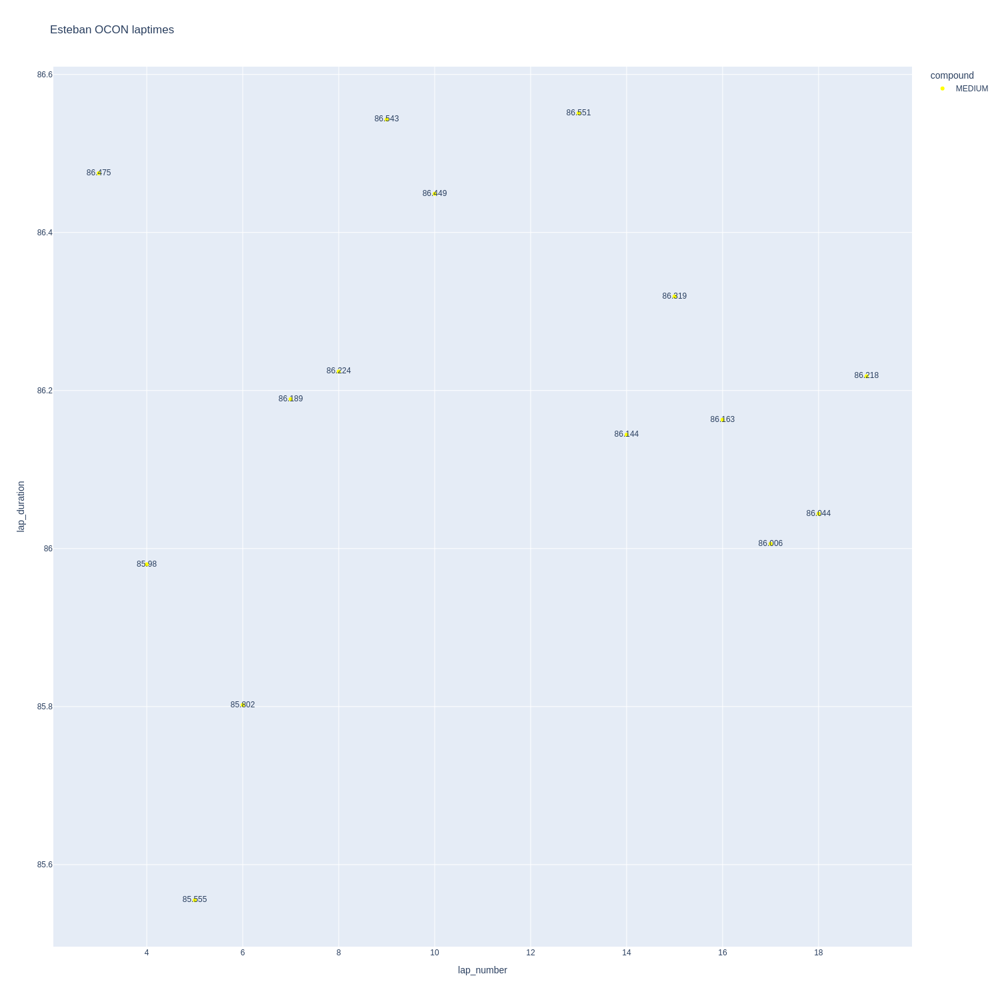

In [104]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

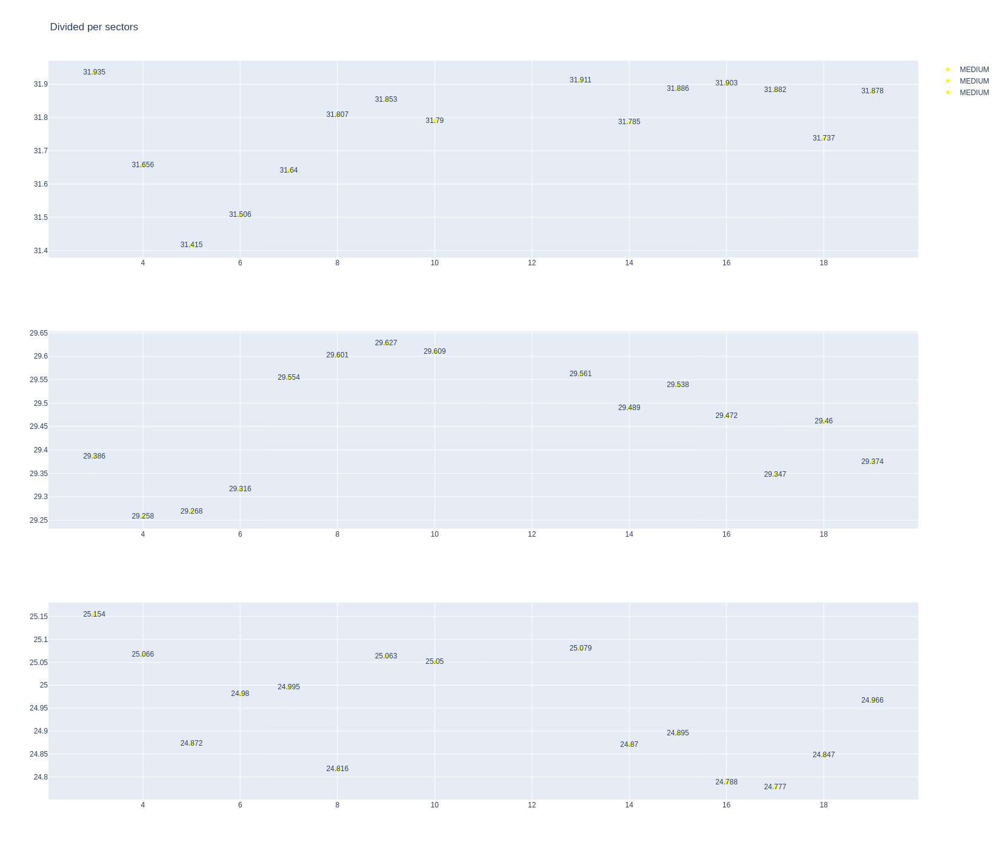

In [105]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [106]:
data = libraryDataF1.getinfolongruns(jointables,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
31,Oliver BEARMAN,MEDIUM,2025-11-29T14:05:08.723000+00:00,2,32.210,29.504,25.080,86.794
51,Oliver BEARMAN,MEDIUM,2025-11-29T14:06:35.612000+00:00,3,31.733,29.333,24.984,86.050
71,Oliver BEARMAN,MEDIUM,2025-11-29T14:08:01.638000+00:00,4,31.550,29.307,24.901,85.758
91,Oliver BEARMAN,MEDIUM,2025-11-29T14:09:27.331000+00:00,5,31.351,29.354,24.888,85.593
111,Oliver BEARMAN,MEDIUM,2025-11-29T14:10:52.937000+00:00,6,31.577,29.453,24.871,85.901
131,Oliver BEARMAN,MEDIUM,2025-11-29T14:12:18.794000+00:00,7,31.770,29.655,24.905,86.330
151,Oliver BEARMAN,MEDIUM,2025-11-29T14:13:45.260000+00:00,8,31.737,29.456,24.845,86.038
171,Oliver BEARMAN,MEDIUM,2025-11-29T14:15:11.203000+00:00,9,32.126,29.547,24.925,86.598
191,Oliver BEARMAN,MEDIUM,2025-11-29T14:16:37.852000+00:00,10,31.895,29.520,25.018,86.433
211,Oliver BEARMAN,MEDIUM,2025-11-29T14:18:04.199000+00:00,11,31.983,29.523,24.924,86.430


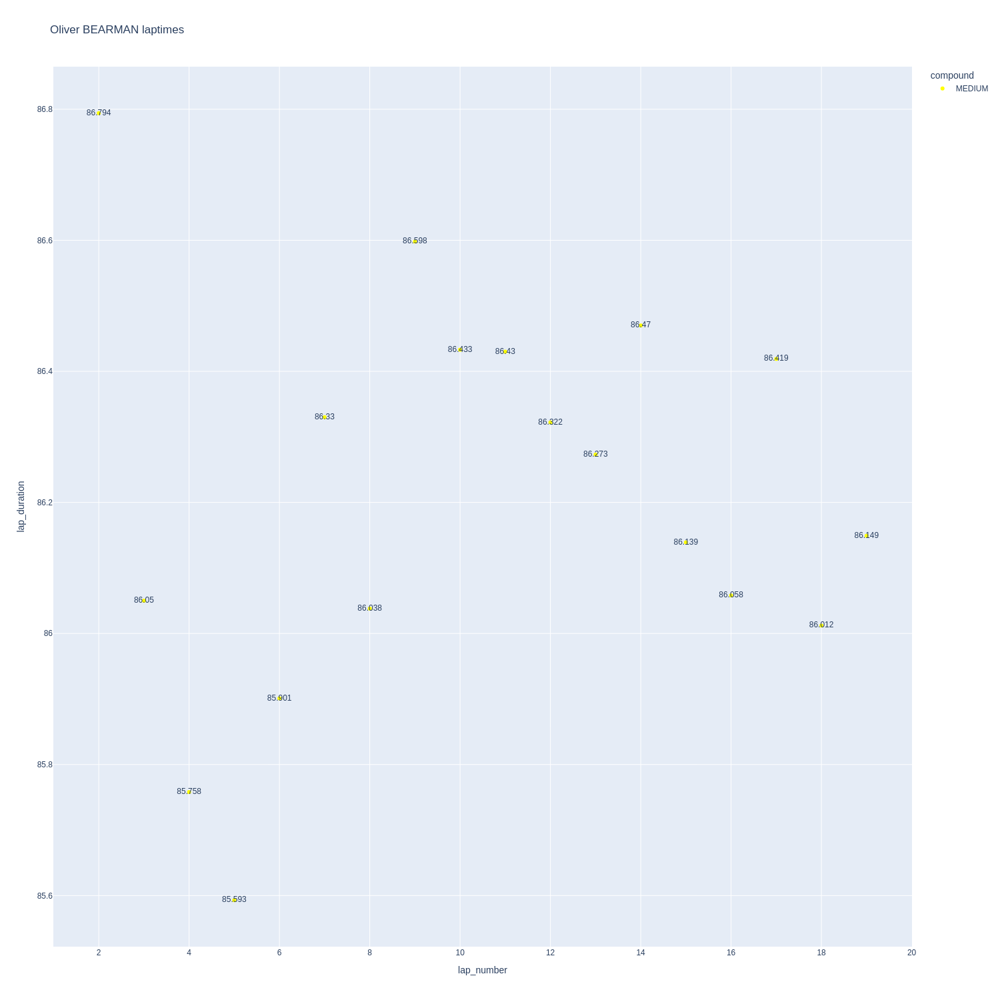

In [107]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

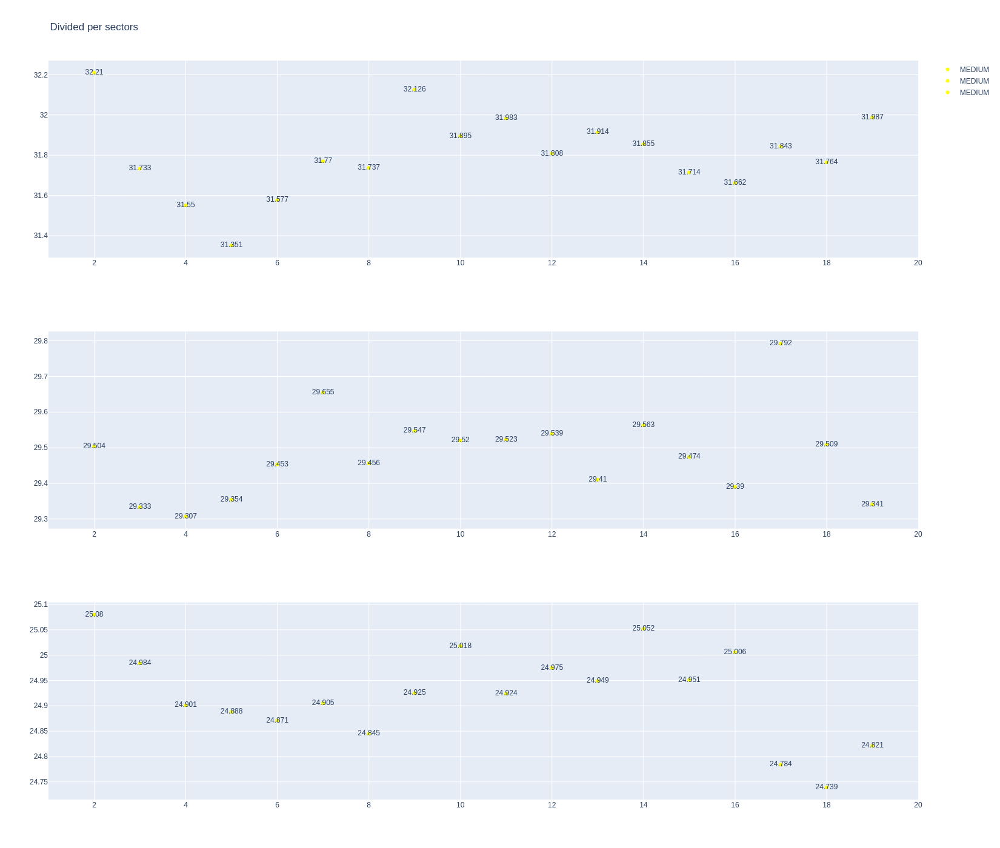

In [108]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [109]:
stintInformation.query('driver_number == 10 or driver_number == 43')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
8,1275,9845,1,10,1,1,MEDIUM,0
11,1275,9845,1,43,1,17,MEDIUM,0
29,1275,9845,2,10,2,19,SOFT,0
31,1275,9845,2,43,18,19,SOFT,6


In [110]:
data =libraryDataF1.getinfolongruns(jointables,43,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
59,Franco COLAPINTO,MEDIUM,2025-11-29T14:06:40.701000+00:00,3,31.988,29.585,25.256,86.829
79,Franco COLAPINTO,MEDIUM,2025-11-29T14:08:07.151000+00:00,4,31.912,29.458,25.128,86.498
99,Franco COLAPINTO,MEDIUM,2025-11-29T14:09:33.721000+00:00,5,31.814,29.535,25.420,86.769
119,Franco COLAPINTO,MEDIUM,2025-11-29T14:11:00.424000+00:00,6,32.084,29.501,25.011,86.596
139,Franco COLAPINTO,MEDIUM,2025-11-29T14:12:27.052000+00:00,7,31.789,29.583,25.025,86.397
159,Franco COLAPINTO,MEDIUM,2025-11-29T14:13:53.413000+00:00,8,31.811,29.556,24.875,86.242
179,Franco COLAPINTO,MEDIUM,2025-11-29T14:15:19.777000+00:00,9,31.757,29.371,24.750,85.878
199,Franco COLAPINTO,MEDIUM,2025-11-29T14:16:45.649000+00:00,10,31.898,29.639,24.881,86.418
219,Franco COLAPINTO,MEDIUM,2025-11-29T14:18:12.027000+00:00,11,31.974,29.661,24.912,86.547
239,Franco COLAPINTO,MEDIUM,2025-11-29T14:19:38.531000+00:00,12,31.985,29.767,24.996,86.748


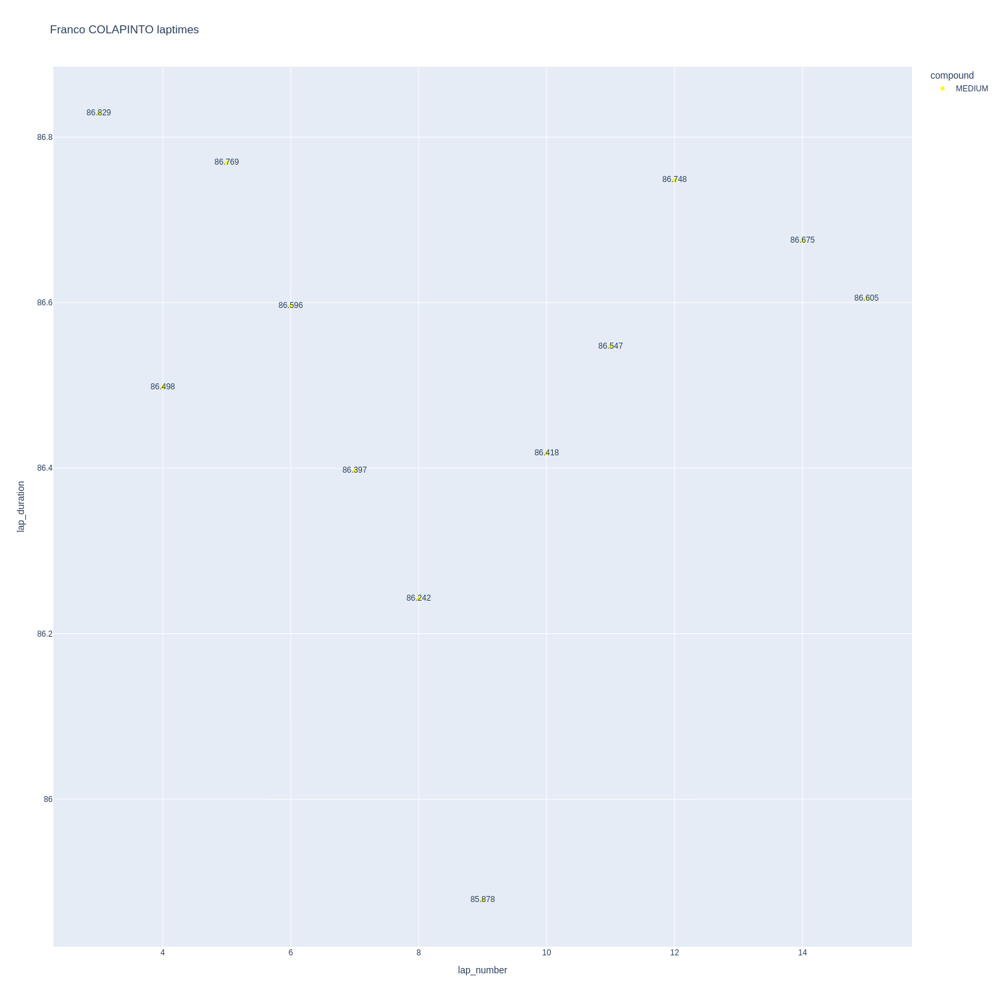

In [111]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

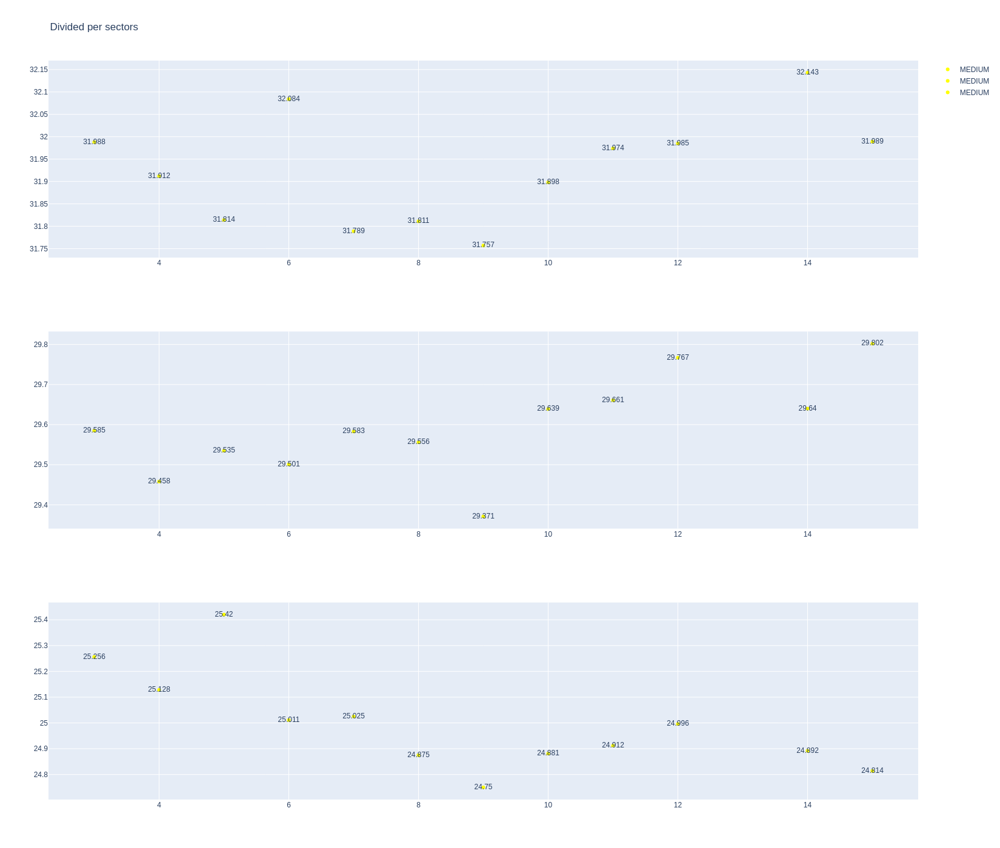

In [112]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [113]:
data = libraryDataF1.getinfolongruns(jointables,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
58,Pierre GASLY,SOFT,2025-11-29T14:06:39.537000+00:00,3,32.091,29.427,25.222,86.740
78,Pierre GASLY,SOFT,2025-11-29T14:08:06.232000+00:00,4,31.983,29.376,25.110,86.469
98,Pierre GASLY,SOFT,2025-11-29T14:09:32.721000+00:00,5,31.847,29.616,24.957,86.420
118,Pierre GASLY,SOFT,2025-11-29T14:10:59.153000+00:00,6,31.574,29.414,25.015,86.003
138,Pierre GASLY,SOFT,2025-11-29T14:12:25.173000+00:00,7,31.890,29.523,24.977,86.390
158,Pierre GASLY,SOFT,2025-11-29T14:13:51.554000+00:00,8,31.841,29.440,24.806,86.087
178,Pierre GASLY,SOFT,2025-11-29T14:15:17.660000+00:00,9,31.842,29.447,24.759,86.048
198,Pierre GASLY,SOFT,2025-11-29T14:16:43.587000+00:00,10,31.818,29.756,25.024,86.598
218,Pierre GASLY,SOFT,2025-11-29T14:18:10.272000+00:00,11,31.875,29.755,24.969,86.599
277,Pierre GASLY,SOFT,2025-11-29T14:22:31.308000+00:00,14,31.810,29.573,24.860,86.243


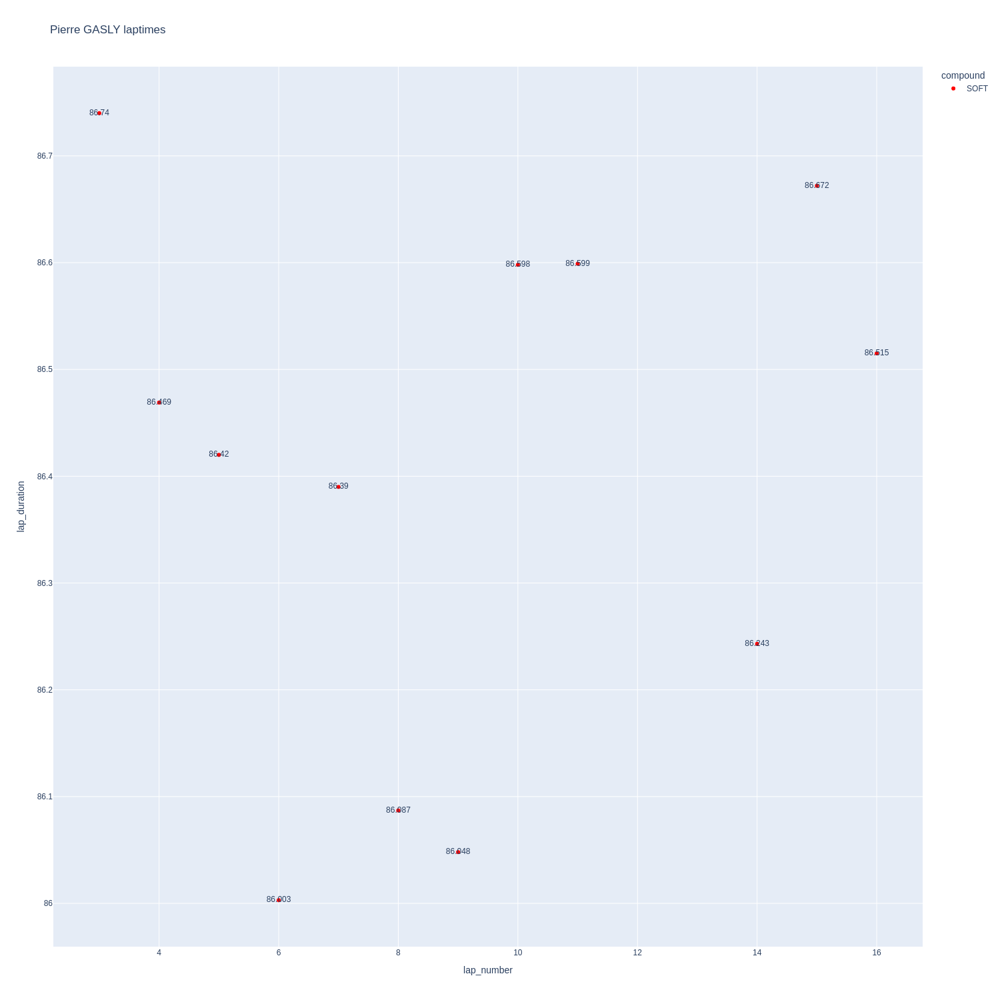

In [114]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

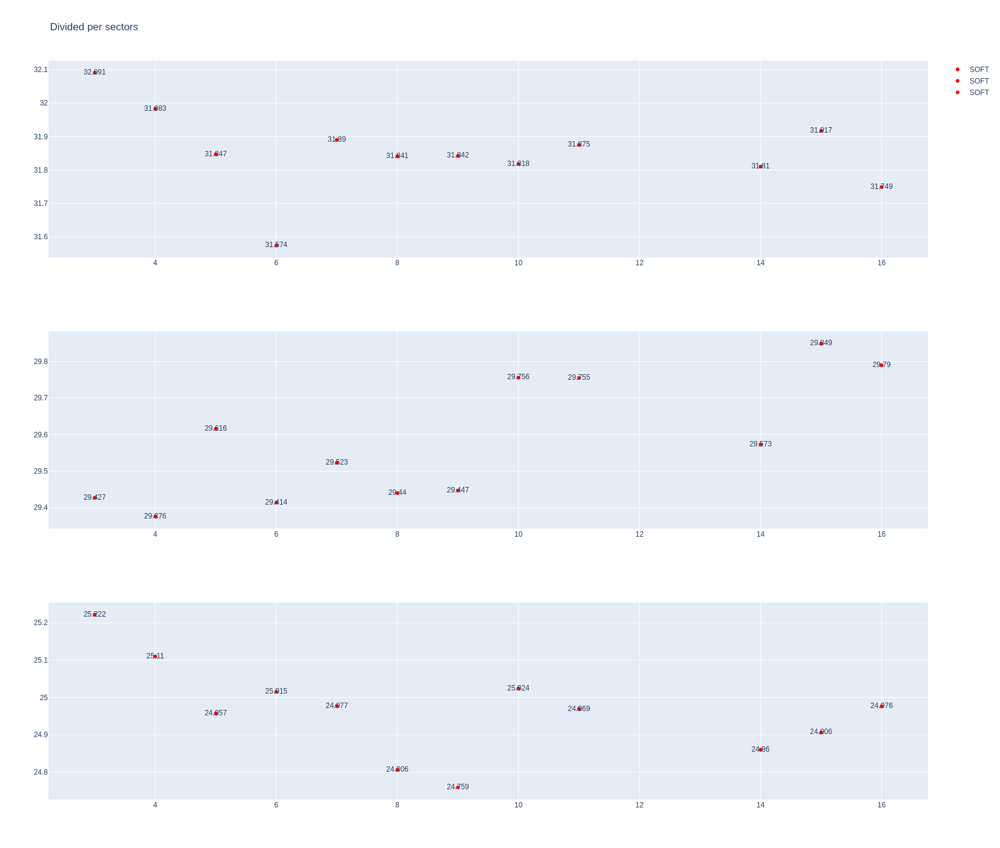

In [115]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [116]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1275,9845,1,23,1,1,MEDIUM,6
19,1275,9845,1,55,1,19,MEDIUM,6
21,1275,9845,2,23,2,19,HARD,0


In [117]:
data = libraryDataF1.getinfolongruns(jointables,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
29,Alexander ALBON,HARD,2025-11-29T14:05:07.752000+00:00,2,32.323,29.372,24.892,86.587
49,Alexander ALBON,HARD,2025-11-29T14:06:34.401000+00:00,3,31.665,29.220,24.854,85.739
69,Alexander ALBON,HARD,2025-11-29T14:08:00.072000+00:00,4,31.553,29.246,24.989,85.788
89,Alexander ALBON,HARD,2025-11-29T14:09:25.878000+00:00,5,31.495,29.373,24.770,85.638
109,Alexander ALBON,HARD,2025-11-29T14:10:51.454000+00:00,6,31.589,29.190,24.935,85.714
129,Alexander ALBON,HARD,2025-11-29T14:12:17.157000+00:00,7,31.712,29.374,24.882,85.968
149,Alexander ALBON,HARD,2025-11-29T14:13:43.181000+00:00,8,31.759,29.425,24.798,85.982
169,Alexander ALBON,HARD,2025-11-29T14:15:09.173000+00:00,9,31.677,29.416,24.962,86.055
189,Alexander ALBON,HARD,2025-11-29T14:16:35.258000+00:00,10,31.705,29.421,24.919,86.045
209,Alexander ALBON,HARD,2025-11-29T14:18:01.262000+00:00,11,31.708,29.454,24.861,86.023


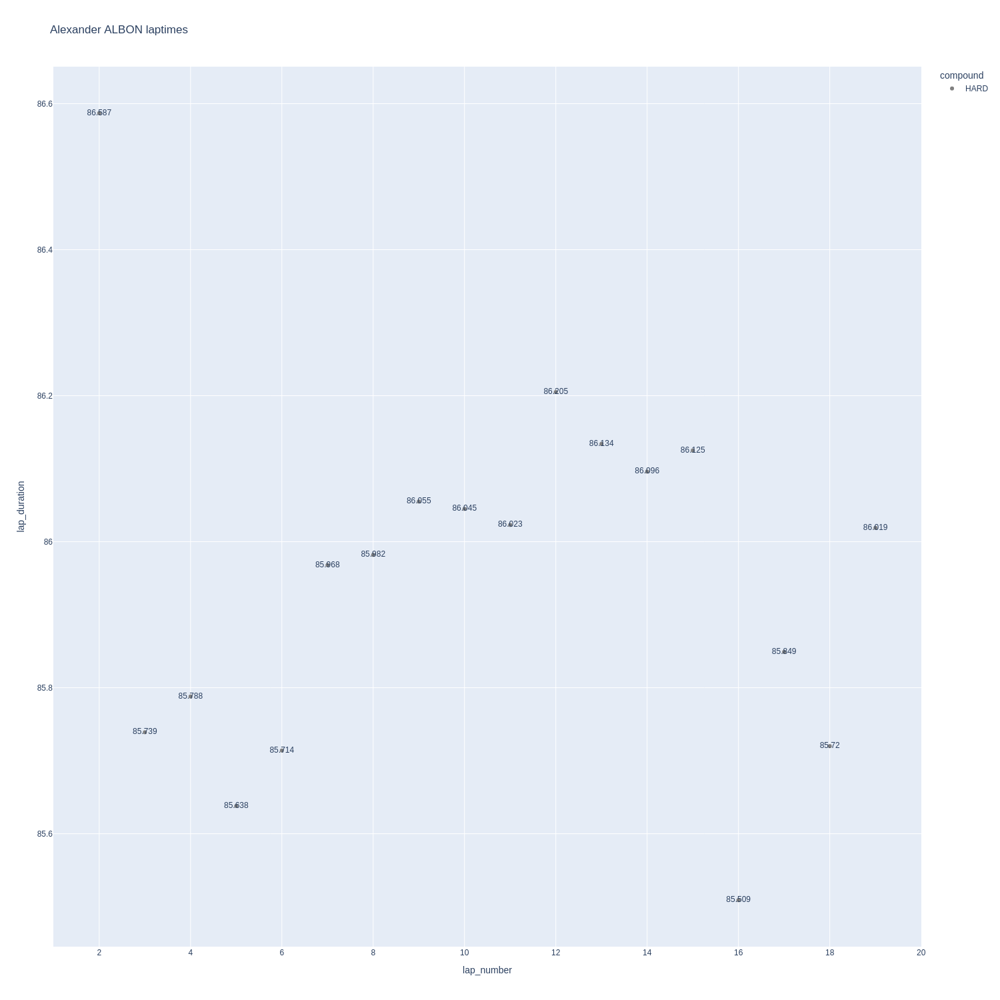

In [118]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

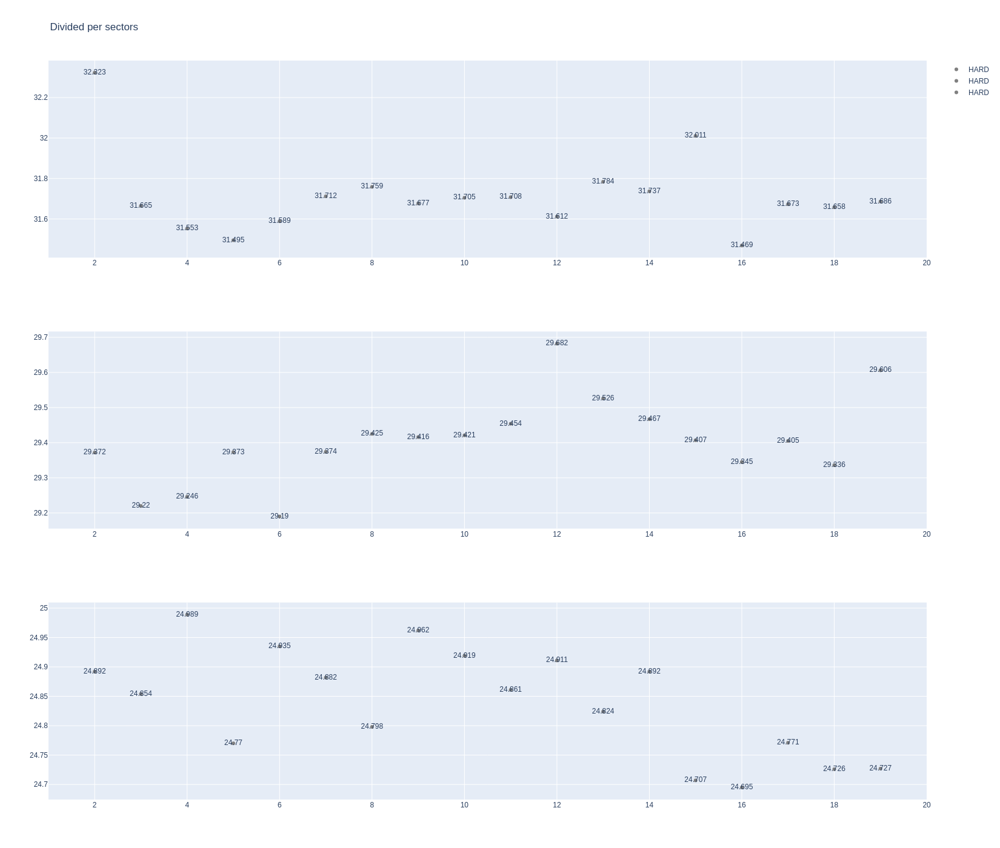

In [119]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [120]:
data= libraryDataF1.getinfolongruns(jointables,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
27,Carlos SAINZ,MEDIUM,2025-11-29T14:05:06.723000+00:00,2,31.879,29.471,24.890,86.240
47,Carlos SAINZ,MEDIUM,2025-11-29T14:06:33.007000+00:00,3,31.738,28.991,24.832,85.561
67,Carlos SAINZ,MEDIUM,2025-11-29T14:07:58.480000+00:00,4,31.645,28.960,24.890,85.495
87,Carlos SAINZ,MEDIUM,2025-11-29T14:09:24.018000+00:00,5,31.484,29.176,24.803,85.463
107,Carlos SAINZ,MEDIUM,2025-11-29T14:10:49.552000+00:00,6,31.500,29.285,24.878,85.663
127,Carlos SAINZ,MEDIUM,2025-11-29T14:12:15.092000+00:00,7,31.586,29.294,24.724,85.604
147,Carlos SAINZ,MEDIUM,2025-11-29T14:13:40.781000+00:00,8,31.504,29.432,24.868,85.804
167,Carlos SAINZ,MEDIUM,2025-11-29T14:15:06.528000+00:00,9,31.758,29.385,24.867,86.010
187,Carlos SAINZ,MEDIUM,2025-11-29T14:16:32.524000+00:00,10,31.751,29.325,24.846,85.922
207,Carlos SAINZ,MEDIUM,2025-11-29T14:17:58.403000+00:00,11,31.872,29.432,24.834,86.138


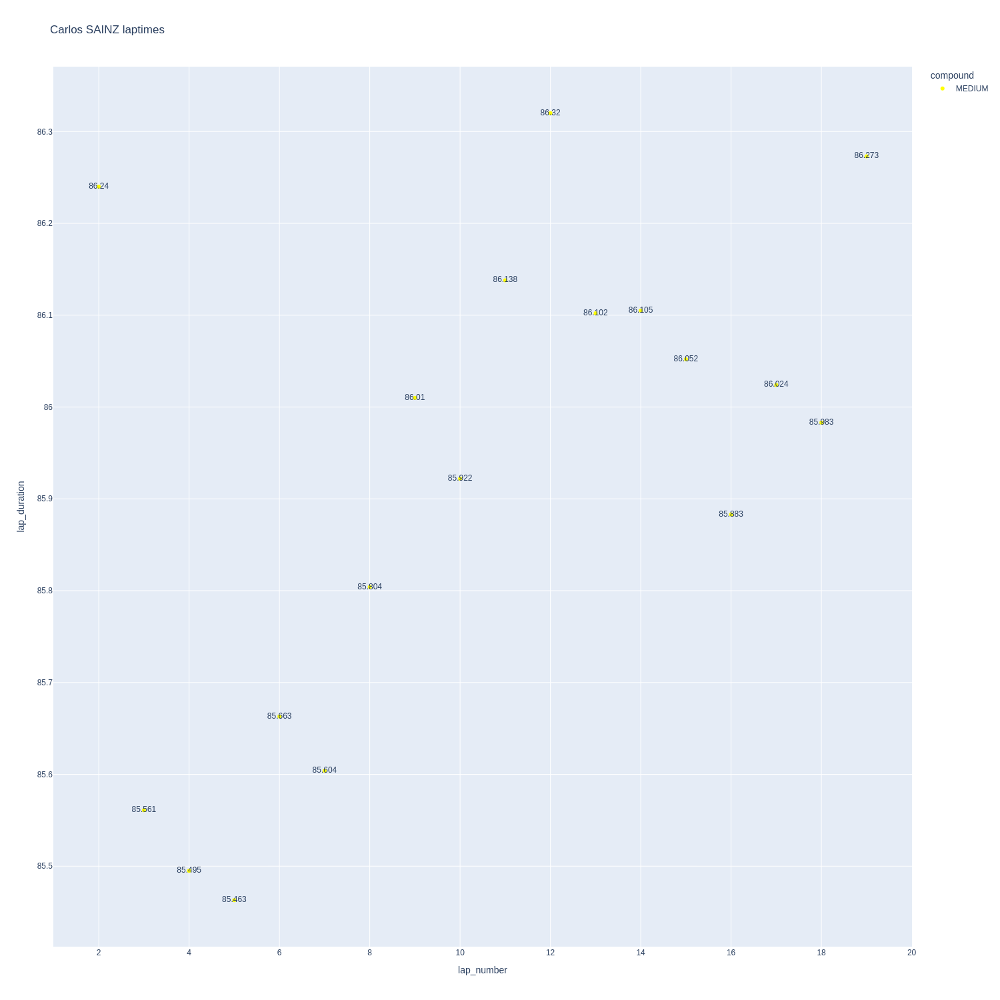

In [121]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

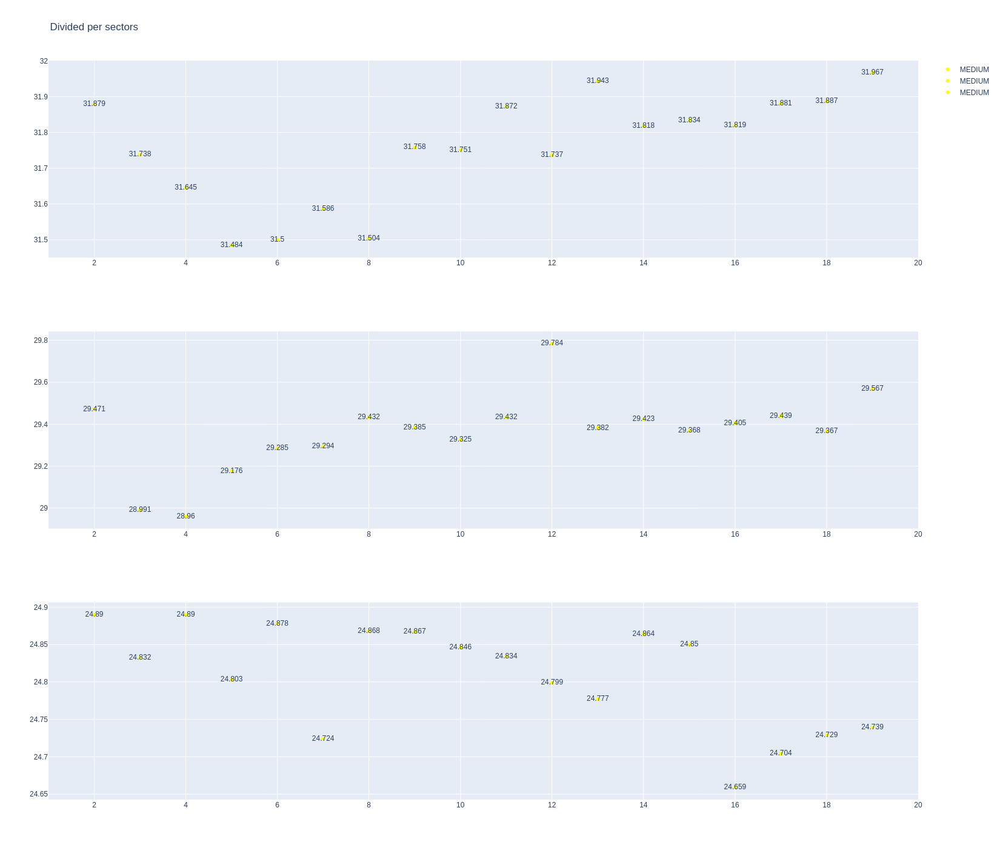

In [122]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [123]:
stintInformation.query('driver_number == 27 or driver_number == 5')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1275,9845,1,5,1,1,MEDIUM,6
22,1275,9845,2,5,2,19,HARD,0
27,1275,9845,1,27,1,19,MEDIUM,6


In [124]:
data = libraryDataF1.getinfolongruns(jointables,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
55,Nico HULKENBERG,MEDIUM,2025-11-29T14:06:37.779000+00:00,3,31.959,29.409,25.175,86.543
75,Nico HULKENBERG,MEDIUM,2025-11-29T14:08:04.372000+00:00,4,31.702,29.422,24.990,86.114
95,Nico HULKENBERG,MEDIUM,2025-11-29T14:09:30.503000+00:00,5,31.415,29.334,24.929,85.678
115,Nico HULKENBERG,MEDIUM,2025-11-29T14:10:56.053000+00:00,6,31.473,29.454,24.915,85.842
135,Nico HULKENBERG,MEDIUM,2025-11-29T14:12:21.920000+00:00,7,31.451,29.522,25.136,86.109
155,Nico HULKENBERG,MEDIUM,2025-11-29T14:13:48.141000+00:00,8,31.728,29.599,24.998,86.325
175,Nico HULKENBERG,MEDIUM,2025-11-29T14:15:14.356000+00:00,9,31.705,29.631,25.062,86.398
195,Nico HULKENBERG,MEDIUM,2025-11-29T14:16:40.837000+00:00,10,31.867,29.587,25.053,86.507
255,Nico HULKENBERG,MEDIUM,2025-11-29T14:21:02.160000+00:00,13,31.732,29.752,25.036,86.520
275,Nico HULKENBERG,MEDIUM,2025-11-29T14:22:28.935000+00:00,14,31.801,29.460,24.844,86.105


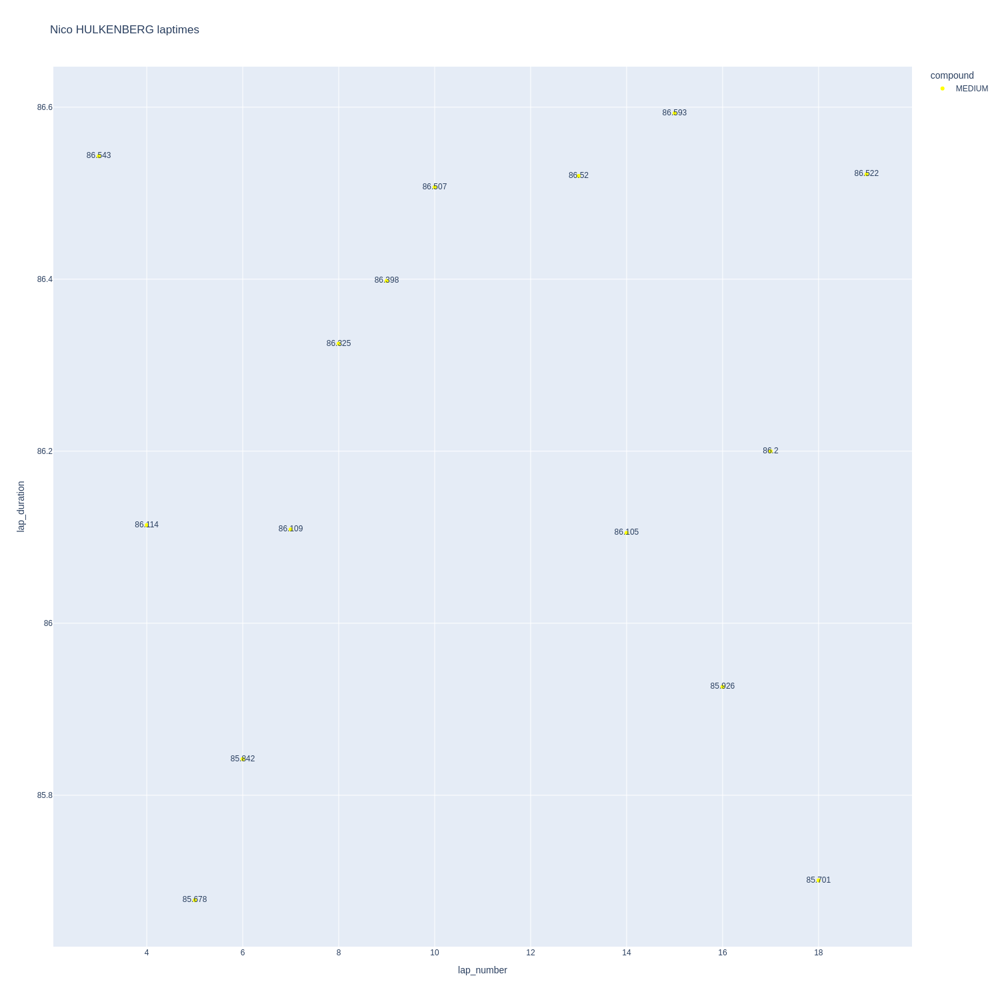

In [125]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

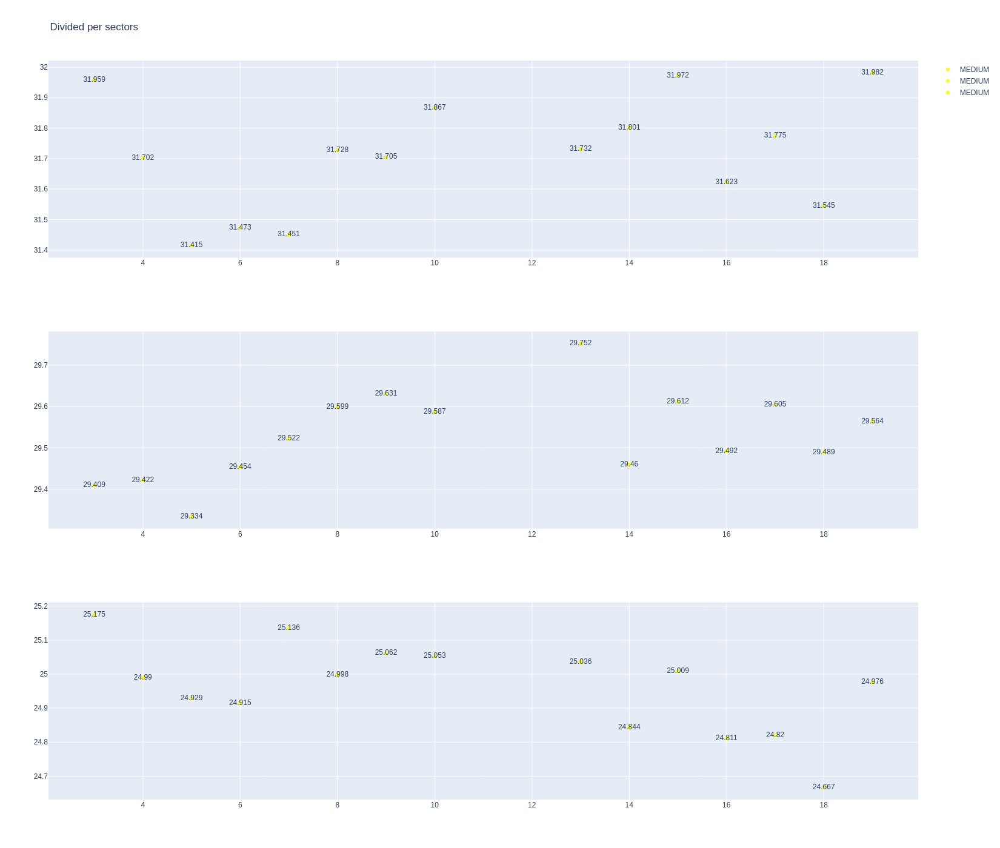

In [126]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [127]:
data = libraryDataF1.getinfolongruns(jointables,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
30,Gabriel BORTOLETO,HARD,2025-11-29T14:05:08.180000+00:00,2,32.363,29.446,25.091,86.900
50,Gabriel BORTOLETO,HARD,2025-11-29T14:06:35.101000+00:00,3,31.650,29.244,25.021,85.915
70,Gabriel BORTOLETO,HARD,2025-11-29T14:08:00.889000+00:00,4,31.528,29.145,24.990,85.663
90,Gabriel BORTOLETO,HARD,2025-11-29T14:09:26.643000+00:00,5,31.454,29.331,24.969,85.754
110,Gabriel BORTOLETO,HARD,2025-11-29T14:10:52.327000+00:00,6,31.475,29.465,24.771,85.711
130,Gabriel BORTOLETO,HARD,2025-11-29T14:12:18.158000+00:00,7,31.562,29.484,24.886,85.932
150,Gabriel BORTOLETO,HARD,2025-11-29T14:13:44.031000+00:00,8,31.478,29.682,24.972,86.132
170,Gabriel BORTOLETO,HARD,2025-11-29T14:15:10.190000+00:00,9,31.517,29.753,24.933,86.203
190,Gabriel BORTOLETO,HARD,2025-11-29T14:16:36.321000+00:00,10,31.797,29.618,25.197,86.612
210,Gabriel BORTOLETO,HARD,2025-11-29T14:18:03.012000+00:00,11,31.751,29.585,25.089,86.425


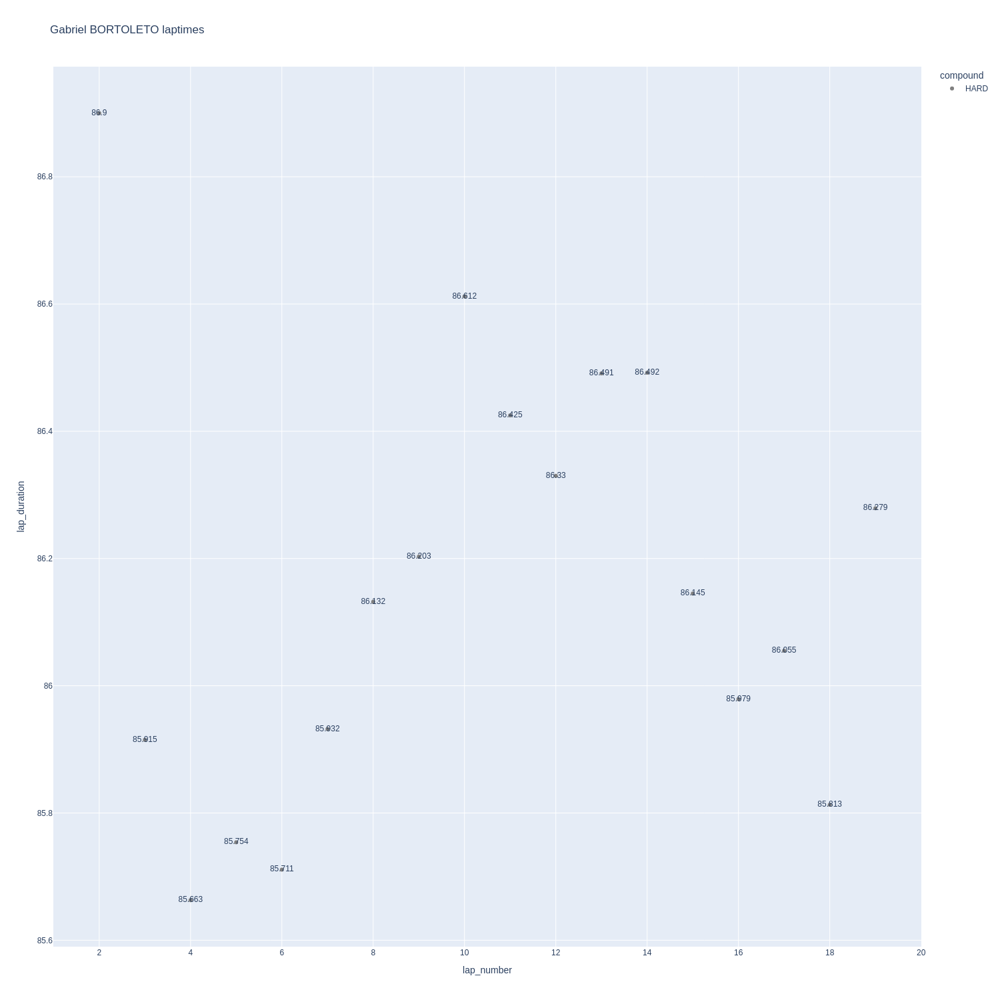

In [128]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

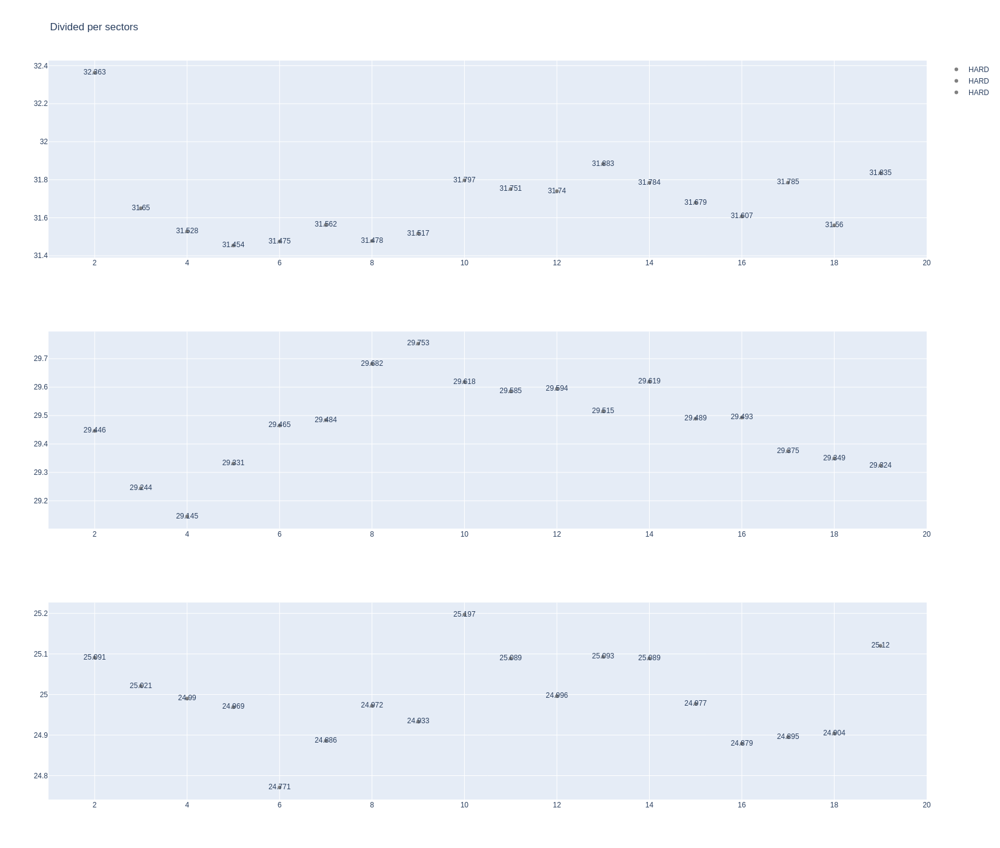

In [129]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

### Long runs mean for each driver

In [135]:
longrun_data = libraryDataF1.obtainLongRunData(drivers,jointables,MINIMUN_SECONDS,MAXIMUM_SECONDS)

In [136]:
pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3']).sort_values(by='lap_duration',ascending=True)[['driver','lap_duration','compound']]

,driver,lap_duration,compound
18,Oscar PIASTRI,84.795353,MEDIUM
17,George RUSSELL,84.954778,MEDIUM
1,Lando NORRIS,84.963389,HARD
0,Max VERSTAPPEN,85.083278,HARD
9,Yuki TSUNODA,85.318500,HARD
5,Kimi ANTONELLI,85.358611,HARD
6,Fernando ALONSO,85.769588,HARD
16,Carlos SAINZ,85.924556,MEDIUM
10,Alexander ALBON,85.955333,HARD
3,Isack HADJAR,85.958167,HARD


#### Sorted by sector 1

In [137]:
pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3']).sort_values(by='sector1',ascending=True)[['driver','sector1','compound']]

,driver,sector1,compound
17,George RUSSELL,31.226278,MEDIUM
18,Oscar PIASTRI,31.289250,MEDIUM
1,Lando NORRIS,31.349778,HARD
5,Kimi ANTONELLI,31.359556,HARD
0,Max VERSTAPPEN,31.428389,HARD
9,Yuki TSUNODA,31.437833,HARD
6,Fernando ALONSO,31.595412,HARD
8,Lance STROLL,31.636625,MEDIUM
7,Charles LECLERC,31.673875,HARD
2,Gabriel BORTOLETO,31.691556,HARD


#### Sector by sector 2

In [138]:
pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3']).sort_values(by='sector2',ascending=True)[['driver','sector2','compound']]

,driver,sector2,compound
18,Oscar PIASTRI,28.797000,MEDIUM
17,George RUSSELL,29.178722,MEDIUM
9,Yuki TSUNODA,29.185778,HARD
1,Lando NORRIS,29.186167,HARD
0,Max VERSTAPPEN,29.193833,HARD
5,Kimi ANTONELLI,29.258556,HARD
3,Isack HADJAR,29.311444,HARD
6,Fernando ALONSO,29.343471,HARD
16,Carlos SAINZ,29.360333,MEDIUM
10,Alexander ALBON,29.403611,HARD


#### Sorted by sector 3

In [139]:
pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3']).sort_values(by='sector3',ascending=True)[['driver','sector3','compound']]

,driver,sector3,compound
1,Lando NORRIS,24.427444,HARD
0,Max VERSTAPPEN,24.461056,HARD
17,George RUSSELL,24.549778,MEDIUM
7,Charles LECLERC,24.694625,HARD
9,Yuki TSUNODA,24.694889,HARD
18,Oscar PIASTRI,24.711588,MEDIUM
5,Kimi ANTONELLI,24.740500,HARD
16,Carlos SAINZ,24.808500,MEDIUM
6,Fernando ALONSO,24.830706,HARD
3,Isack HADJAR,24.837833,HARD


## Qualyfing
### Set up
First of all, it is neccesary to obtain the data about the qualyfing
#### Race control
This section has been added in order to know which laps has been deleted and knowing what happened on track during this session. As every laptime that has been deleted were slow laps, none of them were removed.

In [ ]:
libraryDataF1.obtain_information('race_control',session_key=9646)

### Obtain setup

In [ ]:
qualyfing = libraryDataF1.obtain_information('laps',session_key=9646)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9646)
drivers = libraryDataF1.obtain_information('drivers',session_key=9646)

In [ ]:
drivers.loc[drivers['driver_number']==30,'team_name'] = 'RB'
drivers.loc[drivers['driver_number']==43,'team_name'] = 'Williams'
drivers.loc[drivers['driver_number']==30,'team_colour'] = '6692FF'
drivers.loc[drivers['driver_number']==43,'team_colour'] = '64C4FF'
libraryDataF1.obtain_drivers_colours(drivers)

In [ ]:
session = ff1.get_session(2024, 23, 'Q')
session.load()
session.laps["LapTimeSeconds"] = session.laps["LapTime"].dt.total_seconds()

In [ ]:
laptimes_deleted = [83.505,83.525,82.873,81.437,81.320]
driver_number_lap_deleted = [20,43,23,4,14]

for ltime_deleted, dn_time_deleted in zip(laptimes_deleted,driver_number_lap_deleted):
    try:
        id_deleted = qualyfing.query("driver_number == @dn_time_deleted and lap_duration == @ltime_deleted").index[0]
        qualyfing = qualyfing.drop(id_deleted)
    except:
        print("Laptime deleted associated with the selected driver does not exist. Please, check again the order of the arrays")

In [ ]:
bestlap = qualyfing.loc[qualyfing.groupby(['driver_number'])['lap_duration'].idxmin()].sort_values(by=['lap_duration'],ascending=True)

In this case, the fastest lap is 80.52 seconds (1.20.52= so that to obtain the competitve laps the fastest lap will be multiplied by 1.07 86.15 seconds) due to, according to the rules all the drivers have to do unless one lap within this gap.

In [ ]:
competitiveLaps = qualyfing.query("is_pit_out_lap == False and lap_duration <= 86.15")

In [ ]:
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()

#### Best lap per driver compared with the best lap of the session
In this chart we can see the deltas with compared with the fastest lap of the session that it could be different than the pole.

In [ ]:
dt = jointables.sort_values(by=['fastest_lap'],ascending=True)
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Speed trap

#### Maximum speed per drivers

In [ ]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

In [ ]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

In [ ]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

### Maximum speed per teams

In [ ]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i1_speed",top_speed)

In [ ]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i2_speed",top_speed)

In [ ]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","st_speed",top_speed)

In [ ]:
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])

In order to know when each session finished, race control dataset will be consulted.

In [ ]:
maximumDateQ1 = "date_start <'2024-11-30T18:25:00+00:00'"
maximumDateQ2 = "date_start <'2024-11-30T18:48:00+00:00' and date_start >'2024-11-30T18:25:00+00:00'"
maximumDateQ3 = "date_start >'2024-11-30T18:48:00+00:00'"

### Qualyfing 1

In [ ]:
q1Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver,I will do a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap. 



In [ ]:
#Reference
P15 = q1Data[14:15]

In [ ]:
print(
"Driver:",P15.full_name.to_string(index=False),
"Sector 1: ",P15.duration_sector_1.to_string(index=False),
"Sector 2: ",P15.duration_sector_2.to_string(index=False),
"Sector 3: ",P15.duration_sector_3.to_string(index=False)
)

In [ ]:
q1Data[15::]

##### Analysis of each sector of the driver at risk compared to the drivers eliminated.


In [ ]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[15::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

In [ ]:
libraryDataF1.draw_gap(P15,15,20,q1Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.

In [ ]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[0:14].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

#### Best sector per driver
In this section we can see the best sector of the session

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 2

In [ ]:
q2Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [ ]:
#Reference
P10 = q2Data[9:10]
print(
"Driver:",P10.full_name.to_string(index=False),
"Sector 1: ",P10.duration_sector_1.to_string(index=False),
"Sector 2: ",P10.duration_sector_2.to_string(index=False),
"Sector 3: ",P10.duration_sector_3.to_string(index=False)
)

##### Analysis of each sector of the driver at risk compared to the drivers eliminated.


In [ ]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[10::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

In [ ]:

#libraryDataF1.draw_gap(P10,11,15,q2Data,drivers,session)
    

##### Analysis with the drivers that finished better than the driver at risk

In [ ]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[0:9].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

#### Best sector per driver
In this section we can see the best sector of the session

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q2Data.sort_values(by=['duration_sector_1'],ascending=True))

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q2Data.sort_values(by=['duration_sector_2'],ascending=True))

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q2Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 3

In [ ]:
q3Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with poleman
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [ ]:
#Reference
P1 = q3Data[:1]
print(
"Driver:",P1.full_name.to_string(index=False),
"Sector 1: ",P1.duration_sector_1.to_string(index=False),
"Sector 2: ",P1.duration_sector_2.to_string(index=False),
"Sector 3: ",P1.duration_sector_3.to_string(index=False)
)

##### Analysis of each sector of the poleman compared to the drivers eliminated.



In [ ]:
newdataset2 = pd.DataFrame()
for index,row in q3Data[1::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P1,newdataset2)
newdataset2

#### Best sector per driver
In this section we can see the best sector of the session

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q3Data.sort_values(by=['duration_sector_1'],ascending=True))

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q3Data.sort_values(by=['duration_sector_2'],ascending=True))

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q3Data.sort_values(by=['duration_sector_3'],ascending=True))

#### Best sector per driver of the session (in general)

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_1'].min().sort_values(ascending=True)).reset_index())

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_2'].min().sort_values(ascending=True)).reset_index())

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_3'].min().sort_values(ascending=True)).reset_index())

### Comparaison between the poleman and the second

In [ ]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

In [ ]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

In [ ]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

In [ ]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Race
### Obtain setup

In [ ]:
race = libraryDataF1.obtain_information('laps',session_key=9655)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9655)
drivers = libraryDataF1.obtain_information('drivers',session_key=9655)
drivers.loc[drivers['driver_number']==30,'team_name'] = 'RB'
drivers.loc[drivers['driver_number']==43,'team_name'] = 'Williams'
drivers.loc[drivers['driver_number']==30,'team_colour'] = '6692FF'
drivers.loc[drivers['driver_number']==43,'team_colour'] = '64C4FF'
libraryDataF1.obtain_drivers_colours(drivers)

In [ ]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)

In [ ]:
raceLaps = race.query("is_pit_out_lap == False")
jointables = pd.merge(raceLaps,stintsDataFrame,on=['lap_number','driver_number'])

### Speed trap

In [ ]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax().dropna()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

In [ ]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax().dropna()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

In [ ]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax().dropna()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Mean pace with the different compound used on the session

In [ ]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration >82 and lap_duration <=89").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

### Race pace

In [ ]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration >82 and lap_duration <=89").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

#### Mean race pace per sector
In this section, we can see the pace shown per each team in each sector sorted ascending.

#### Sector 1

In [ ]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration >82 and lap_duration <=89").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

#### Sector 2

In [ ]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration >82 and lap_duration <=89").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

#### Sector 3

In [ ]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False and lap_duration >82 and lap_duration <=89").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

### Long runs

In [ ]:
MINIMUN_SECONDS = 82
MAXIMUM_SECONDS = 89

#### Red Bull Racing

In [ ]:
stintInformation.query('driver_number == 1 or driver_number == 11')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,11,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [ ]:
stintInformation.query('driver_number == 55 or driver_number == 16')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,55,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [ ]:
stintInformation.query('driver_number == 63 or driver_number == 44')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,44,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [ ]:
stintInformation.query('driver_number == 81 or driver_number == 4')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [ ]:
stintInformation.query('driver_number == 18 or driver_number == 14')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [ ]:
stintInformation.query('driver_number == 30 or driver_number == 22')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,30,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,22,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [ ]:
stintInformation.query('driver_number == 20 or driver_number == 27')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,20,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,27,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [ ]:
stintInformation.query('driver_number == 10 or driver_number == 31')

In [ ]:
data =libraryDataF1.getinfolongruns(jointables,31,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [ ]:
stintInformation.query('driver_number == 43 or driver_number == 23')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data= libraryDataF1.getinfolongruns(jointables,43,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [ ]:
stintInformation.query('driver_number == 24 or driver_number == 77')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,24,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,77,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

### Pits
Before to finish the analysis, I added the Pits sections where it can see how much time teams spent in the box.

In [ ]:
pit = libraryDataF1.obtain_information('pit',session_key=9655)

In [ ]:
jointables = pd.merge(drivers,pit,on=['driver_number']).query("pit_duration<120")
jointables
pit_duration = pd.DataFrame(jointables.groupby('team_name')['pit_duration'].mean().sort_values(ascending=True))
pit_duration